In [10]:
import pandas as pd
import numpy as np
from pathlib import Path
from matplotlib import pyplot as plt
import seaborn as sns

from collections import OrderedDict
import scipy as sp
import statsmodels.api as sm
import scipy.stats as st
from sklearn.decomposition import PCA
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform

In [11]:
folder = Path('/Users/ssulheim/Library/CloudStorage/OneDrive-SINTEF/UNIL/leakage/data/Vila et al., 2023')

In [12]:
untargeted_fn = folder / 'Untargeted_LCMS.csv'
dfu = pd.read_csv(untargeted_fn)
targeted_fn = folder / 'Targeted_LCMS.csv'
dft = pd.read_csv(targeted_fn)

In [13]:
dfu.head(300)

,SID,Metabolite,Peak_Intensity,Strain,SangerID,Carbon_Source,Well,Plate,OD,Replicate,Type
0,C1_E1,"2',4'-Dihydroxyacetophenone",21466.33,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
1,C1_E1,"2,3-Diaminopropionic acid",6622.67,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
2,C1_E1,2-Hydroxybutyric acid,31576.00,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
3,C1_E1,2-Hydroxyglutaric acid,880990.69,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
4,C1_E1,2-Ketobutyric acid/Succinic acid semialdehyde,16728.67,Enterobacteriaceae,360,D-Glucose,B1,1,0.151,1,S
...,...,...,...,...,...,...,...,...,...,...,...
295,C1_P3,Cyclic AMP,29967.00,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
296,C1_P3,Deoxyguanosine,10696.67,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
297,C1_P3,Dethiobiotin,24535.33,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S
298,C1_P3,FAD,2302.00,Pseudomonadacae,449,D-Glucose,C1,2,0.181,3,S


# Plot raw data and evaluate

## Enterobacteriaceae
__Metabolites identified in less than 10 samples (these are removed from further analyses)__
- 4-Guanidinobutanoic acid 2
- Acetylglycine 9
- Alanine/Sarcosine 6
- Malonic acid 8

__Samples that seems like outliers (not removed)__
- C1_E3
- C8_E2



/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


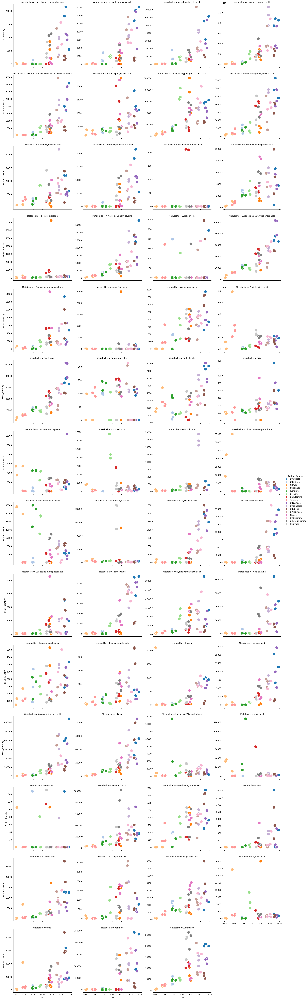

In [14]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
sns.relplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Peak_Intensity', hue = 'Carbon_Source', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4, s=200, palette = 'tab20')
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

In [15]:
sidx = dfu.Strain == 'Enterobacteriaceae'
for m in dfu.loc[sidx,:].Metabolite.unique():
    midx = sidx & (dfu.Metabolite == m)
    n = sum(dfu.loc[midx, 'Peak_Intensity'] > 0)
    if n < 10:
        print(m ,n)


4-Guanidinobutanoic acid 2
Acetylglycine 9
Alanine/Sarcosine 6
Malonic acid 8


In [16]:
mets_to_remove = ['4-Guanidinobutanoic acid', 'Acetylglycine', 'Alanine/Sarcosine', 'Malonic acid']
sidx = dfu.Strain == 'Enterobacteriaceae'
drop = dfu.loc[sidx, 'Metabolite'].isin(mets_to_remove)
dfu.drop(dfu.where(drop).dropna().index, inplace = True)

# sids_to_remove = ['C1_E3', 'C11_E1']
# sidx = dfu.Strain == 'Enterobacteriaceae'
# # drop = sidx = dfu.Strain == 'Enterobacteriaceae'
# drop = dfu.loc[sidx, 'SID'].isin(sids_to_remove)
# dfu.drop(dfu.where(drop).dropna().index, inplace = True)


In [17]:
idx_to_remove = []
for s in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        for cs in dfu.Carbon_Source.unique():
            idx = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Carbon_Source == cs)
            values = dfu.loc[idx, 'Peak_Intensity'].values
            if len(values):
                # Remove values where max is larger than 10 times median
                larger_than_threshold = dfu.loc[idx, 'Peak_Intensity']/dfu.loc[idx, 'Peak_Intensity'].median() > 10
                idx_to_remove += dfu.loc[idx,:].index[larger_than_threshold].to_list()
                if len(dfu.loc[idx,:].index[larger_than_threshold].to_list()):
                    print(s,m,cs, max(dfu.loc[idx, 'Peak_Intensity']/dfu.loc[idx, 'Peak_Intensity'].median()))
                    # print(dfu.loc[idx, 'Peak_Intensity'])


Enterobacteriaceae 2',4'-Dihydroxyacetophenone L-Glutamine nan
Enterobacteriaceae 2,3-Diaminopropionic acid Acetate nan
Enterobacteriaceae 2-Hydroxybutyric acid Succinate inf
Enterobacteriaceae 3-Hydroxyphenylacetic acid L-Glutamine nan
Enterobacteriaceae 4-Hydroxyproline Citrate 58.121727062202964
Enterobacteriaceae 4-Hydroxyproline Succinate inf
Enterobacteriaceae Adenosine monophosphate Fumarate nan
Enterobacteriaceae Aminoadipic acid Fumarate inf
Enterobacteriaceae Deoxyguanosine Succinate nan
Enterobacteriaceae Deoxyguanosine L-Malate nan
Enterobacteriaceae Deoxyguanosine D-Gluconate nan
Enterobacteriaceae Fructose 6-phosphate Citrate nan
Enterobacteriaceae Fructose 6-phosphate L-Glutamine 14.621250000000002
Enterobacteriaceae Fumaric acid Citrate 10.801052021575357
Enterobacteriaceae Fumaric acid L-Glutamine nan
Enterobacteriaceae Fumaric acid D-Gluconate inf
Enterobacteriaceae Glucosamine 6-phosphate D-Lactate nan
Enterobacteriaceae Glucosamine 6-phosphate Fumarate nan
Enterobac

In [18]:
dfu.drop(idx_to_remove, inplace=True)

## Pseudomonadacae
### Remove
- Glycocholic acid 2
- Guanine 1

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


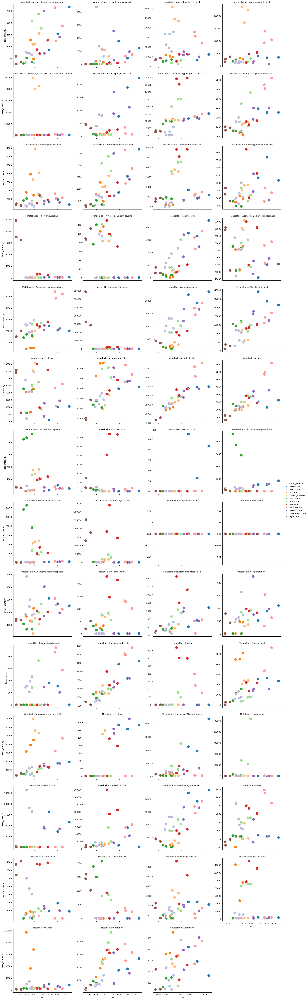

In [19]:
sidx = dfu.Strain == 'Pseudomonadacae'
# sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
sns.relplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Peak_Intensity', hue = 'Carbon_Source', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4, s=200, palette = 'tab20')
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

In [20]:
sidx = dfu.Strain == 'Pseudomonadacae'
for m in dfu.loc[sidx,:].Metabolite.unique():
    midx = sidx & (dfu.Metabolite == m)
    n = sum(dfu.loc[midx, 'Peak_Intensity'] > 0)
    if n < 10:
        print(m ,n)
    

Glycocholic acid 0
Guanine 0
Inosine 8


In [21]:
mets_to_remove = ['Glycocholic acid', 'Guanine']
sidx = dfu.Strain == 'Pseudomonadacae'
drop = dfu.loc[sidx, 'Metabolite'].isin(mets_to_remove)


# Read growth rates

In [22]:
growth_rate_fn = folder / 'Growth_Rates_Fig2_Snorre.csv'
growth_df = pd.read_csv(growth_rate_fn)

In [23]:
growth_df.head()

,SangerID,CS,N0,Nmax,T0,Tmax,T16,N16,max_OD,rmax,gcr,gcauc,gcr_se,r,r16,Family
0,160,D-Glucose,0.040,0.240,1.018889,10.184722,15.792778,0.417,0.442,0.078308,0.835219,14.799585,0.021879,0.282022,0.228916,Enterobacteriaceae
1,160,D-Fructose,0.040,0.246,1.018889,12.733611,15.792778,0.342,0.388,0.057469,0.725609,11.306414,0.049695,0.223700,0.209554,Enterobacteriaceae
2,160,D-Galactose,0.039,0.159,1.018611,21.910000,15.792778,0.077,0.274,0.019450,0.336986,6.107443,0.010360,0.097049,0.066426,Enterobacteriaceae
3,160,D-Ribose,0.039,0.196,1.018889,12.733333,15.792778,0.282,0.348,0.035129,0.443001,10.412643,0.019502,0.198841,0.193189,Enterobacteriaceae
4,160,L-Arabinose,0.039,0.188,1.018611,15.282778,15.792778,0.204,0.378,0.026946,0.329874,9.741623,0.017652,0.159083,0.161567,Enterobacteriaceae


## Carbon source to color

In [24]:
cs_to_type_map = {}
cs_to_color_map = {}
type_to_color = {'A':'g', 'S':'r'}
for cs in dfu.Carbon_Source.unique():
    idx = dfu.Carbon_Source==cs
    type_ = dfu.loc[idx, 'Type'].values[0]
    cs_to_type_map[cs] = type_
    cs_to_color_map[cs] = type_to_color[type_]

# Normalization

## From methods
For the analysis shown in Figures 3B-E and Figure S11 peak heights were averaged across all 3 replicates on each carbon source and then normalized across carbon sources (Z-Score Normalization). For Figures S12 and S13 the normalization was conducted  across all samples (i.e including all 3 replicates separately..

# Fit data to equation

$X(t) = X_0e^{\mu t}$

$\frac{d\sigma_i}{dt} = a_iX(t) = a_iX_0e^{\mu t}$, $a$ [mmol/gDW/h] -> $\sigma$ [mmol]

$\sigma_i(t) = \sigma_i(0) + \int_0^t a_iX_0e^{\mu t} dt = \sigma_i(0) + a_iX_0 \int_0^t e^{\mu t} = \sigma_i(0) + a_iX_0 (\frac{e^{\mu t}-1}{\mu})$

$\sigma_i(t)-\sigma_i(0)=a_iX_0 (\frac{e^{\mu t}-1}{\mu}) = a_i(\frac{X(t)-X_0}{\mu}) = bX(t) - bX_0, \rightarrow b=\frac{a_i}{\mu}$

$a_i = \mu \frac{\sigma_i-\sigma_i(0)}{X(t)-X_0}$
Thus, concentrations increases linearly with growth


https://github.com/linzx06/AC-PCA/blob/master/Matlab_code/acPCA.m can potentially be used?

## Normalize with growth rate and OD

For species i and carbon source j and metabolite k:

$a_{ijk} = \mu_{ij}\frac{\sigma_{ijk}}{X_{ij}}$

In [25]:
dfu.loc[idx, :]

,SID,Metabolite,Peak_Intensity,Strain,SangerID,Carbon_Source,Well,Plate,OD,Replicate,Type
4125,C9_E1,"2',4'-Dihydroxyacetophenone",8257.00,Enterobacteriaceae,360,Pyruvate,B5,1,0.110,1,A
4126,C9_E1,"2,3-Diaminopropionic acid",412.67,Enterobacteriaceae,360,Pyruvate,B5,1,0.110,1,A
4127,C9_E1,2-Hydroxybutyric acid,6771.33,Enterobacteriaceae,360,Pyruvate,B5,1,0.110,1,A
4128,C9_E1,2-Hydroxyglutaric acid,178667.67,Enterobacteriaceae,360,Pyruvate,B5,1,0.110,1,A
4129,C9_E1,2-Ketobutyric acid/Succinic acid semialdehyde,2170.00,Enterobacteriaceae,360,Pyruvate,B5,1,0.110,1,A
...,...,...,...,...,...,...,...,...,...,...,...
4450,C9_P3,Phenylpyruvic acid,2222.33,Pseudomonadacae,449,Pyruvate,C3,2,0.073,3,A
4451,C9_P3,Pyruvic acid,NaN,Pseudomonadacae,449,Pyruvate,C3,2,0.073,3,A
4452,C9_P3,Uracil,1614.67,Pseudomonadacae,449,Pyruvate,C3,2,0.073,3,A
4453,C9_P3,Xanthine,1849.33,Pseudomonadacae,449,Pyruvate,C3,2,0.073,3,A


In [26]:
growth_df

,SangerID,CS,N0,Nmax,T0,Tmax,T16,N16,max_OD,rmax,gcr,gcauc,gcr_se,r,r16,Family
0,160,D-Glucose,0.040,0.240,1.018889,10.184722,15.792778,0.417,0.442,0.078308,0.835219,14.799585,0.021879,0.282022,0.228916,Enterobacteriaceae
1,160,D-Fructose,0.040,0.246,1.018889,12.733611,15.792778,0.342,0.388,0.057469,0.725609,11.306414,0.049695,0.223700,0.209554,Enterobacteriaceae
2,160,D-Galactose,0.039,0.159,1.018611,21.910000,15.792778,0.077,0.274,0.019450,0.336986,6.107443,0.010360,0.097049,0.066426,Enterobacteriaceae
3,160,D-Ribose,0.039,0.196,1.018889,12.733333,15.792778,0.282,0.348,0.035129,0.443001,10.412643,0.019502,0.198841,0.193189,Enterobacteriaceae
4,160,L-Arabinose,0.039,0.188,1.018611,15.282778,15.792778,0.204,0.378,0.026946,0.329874,9.741623,0.017652,0.159083,0.161567,Enterobacteriaceae
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,449,L-Malate,0.040,0.348,1.018611,18.851389,15.793056,0.188,0.598,0.115263,0.496454,15.720708,0.032398,0.175016,0.151116,Pseudomonadaceae
72,449,L-Glutamine,0.039,0.636,1.018611,22.419722,15.792778,0.225,0.767,0.080837,0.425727,19.778404,0.024722,0.188190,0.171135,Pseudomonadaceae
73,449,Acetate,0.039,0.257,1.018611,30.579444,15.793056,0.044,0.570,0.067941,0.462085,8.579452,0.034914,0.092021,0.011779,Pseudomonadaceae
74,449,L-Leucine,0.040,0.318,1.018611,23.949444,15.793056,0.112,0.552,0.052232,0.234316,12.557091,0.004531,0.130434,0.100540,Pseudomonadaceae


In [27]:
growth_rate_dict_r = growth_df.set_index(['SangerID', 'CS'])['r'].to_dict()
growth_rate_dict_gcr = growth_df.set_index(['SangerID', 'CS'])['gcr'].to_dict()
growth_rate_dict_auc = growth_df.set_index(['SangerID', 'CS'])['gcauc'].to_dict()

In [28]:
for s in dfu.Strain.unique():
    sanger_id = dfu.loc[dfu.Strain == s, 'SangerID'].values[0]
    for cs in dfu.Carbon_Source.unique():
        idx = (dfu['Carbon_Source'] == cs)&(dfu.Strain == s)
        wells = dfu.loc[idx, 'Well'].unique()
        
        growth_rate = growth_rate_dict_r[sanger_id, cs]
        auc = growth_rate_dict_auc[sanger_id,cs]
        dfu.loc[idx, 'Growth-normalized peaks'] = growth_rate * dfu.loc[idx, 'Peak_Intensity'] / dfu.loc[idx, 'OD']
        dfu.loc[idx, 'Growth-normalized peaks (auc)'] = dfu.loc[idx, 'Peak_Intensity'] / auc


In [29]:
# dfu.loc[dfu.Carbon_Source=='Citrate', :]

## Normalization of mean values

dfu['Normalized peak'] = dfu['Peak_Intensity']/dfu['OD']
dfu['logscaled (Np)'] = np.log10(dfu['Normalized peak'])
dfu['logscaled (PI)'] = np.log10(dfu['Peak_Intensity'])

dfm = dfu.groupby(['Strain', 'Metabolite', 'Carbon_Source']).mean(numeric_only=True).reset_index()
dfm['Type'] = dfm['Carbon_Source'].map(cs_to_type_map)
dfm.drop(columns = ['Replicate'], inplace=True)


# PCA of means 

id_dict = dfm[['Strain', 'Carbon_Source', 'Type', 'OD']].drop_duplicates().to_dict('index')
id_dict_s = {key: value['Strain'] for key, value in id_dict.items()}
id_dict_c = {key: value['Carbon_Source'] for key, value in id_dict.items()}
id_dict_t = {key: value['Type'] for key, value in id_dict.items()}
id_dict_od = {key: value['OD'] for key, value in id_dict.items()}
id_strain_cs_od = {(value['Strain'], value['Carbon_Source']): value['OD'] for key, value in id_dict.items()}

## Normalize

In [30]:
metabolites = dfu.Metabolite.unique()
key = 'Growth-normalized peaks'
key2 = 'Peak_Intensity'
key3 =  'Growth-normalized peaks (auc)'
# dfu[key2] = dfu[key]/(dfu['OD']**4)
for s in dfu.Strain.unique():
    sidx = dfu.Strain == s
    for m in metabolites:
        idx = (dfu.Metabolite == m)&sidx
        dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()
        dfu.loc[idx, 'Z-score (auc)'] = (dfu.loc[idx, key3]-dfu.loc[idx, key3].mean())/dfu.loc[idx, key3].std()
        dfu.loc[idx, 'Z-score (PI)'] = (dfu.loc[idx, key2]-dfu.loc[idx, key2].mean())/dfu.loc[idx, key2].std()
        # logscaled = np.log10(dfu.loc[idx, key])
        # logscaled.replace([np.inf, -np.inf], np.nan, inplace=True)
        # dfu.loc[idx, 'logscaled (PI)'] = logscaled
        # dfu.loc[idx, 'Z-score(log)'] = (logscaled-np.nanmean(logscaled))/np.nanstd(logscaled)


In [31]:
cid_dict = dfu[['SID', 'Strain', 'Carbon_Source', 'Type', 'OD']].drop_duplicates().set_index('SID').to_dict('index')
cid_dict_s = {key: value['Strain'] for key, value in cid_dict.items()}
cid_dict_c = {key: value['Carbon_Source'] for key, value in cid_dict.items()}
cid_dict_t = {key: value['Type'] for key, value in cid_dict.items()}
# cid_dict_od = {key: value['OD'] for key, value in cid_dict.items()}
cid_strain_cs_od = {(value['Strain'], value['Carbon_Source']): value['OD'] for key, value in cid_dict.items()}

In [382]:
cs_to_type_dict = {a:b for (a,b) in dfu.groupby(['Carbon_Source', 'Type']).count().index}

# PCA

## With peak intensities

Enterobacteriaceae
[0.37027078 0.08491788 0.06127232 0.05446316]
Pseudomonadacae
[0.24885858 0.16880048 0.11805093 0.07315848]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


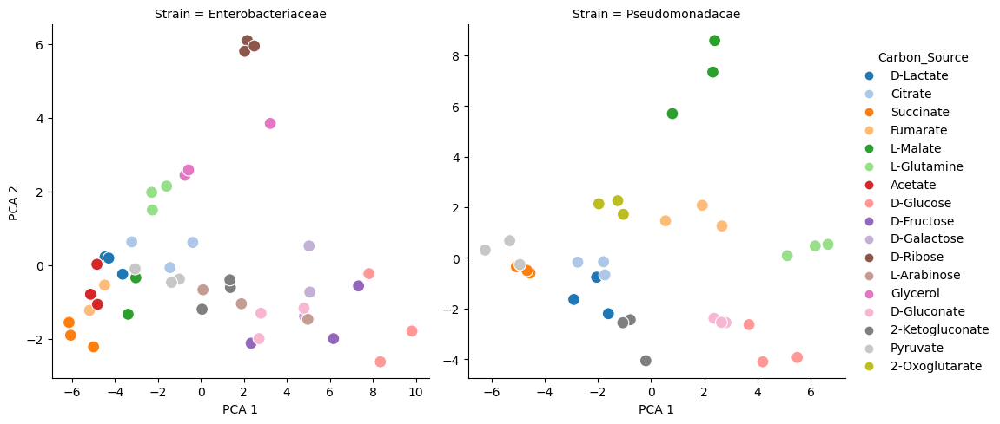

In [62]:
strains = dfu.Strain.unique()
df_list = []
for strain in strains:
    print(strain)
    pca = PCA(n_components=4)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfu.Strain == strain
    X = dfu.loc[sidx,:].pivot(index = 'SID', columns = 'Metabolite', values = 'Peak_Intensity')#Z-score(log)
    X_std =X.std(axis=0)
    X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    fit = pca.fit(Xi)
    fitT = pca.fit_transform(Xi)
    print(fit.explained_variance_ratio_)
    pca_df_s = pd.DataFrame(fitT, columns = ['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4'])
    pca_df_s['SID'] = Xi.index
    pca_df_s['Strain'] = pca_df_s['SID'].map(cid_dict_s)
    pca_df_s['Carbon_Source'] = pca_df_s['SID'].map(cid_dict_c)
    pca_df_s['Type'] = pca_df_s['SID'].map(cid_dict_t)
    pca_df_s['OD'] = [cid_strain_cs_od[strain, met] for met in pca_df_s['Carbon_Source']]
    df_list.append(pca_df_s)
    
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})#, hue_order=['S','A'])
plt.show()


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


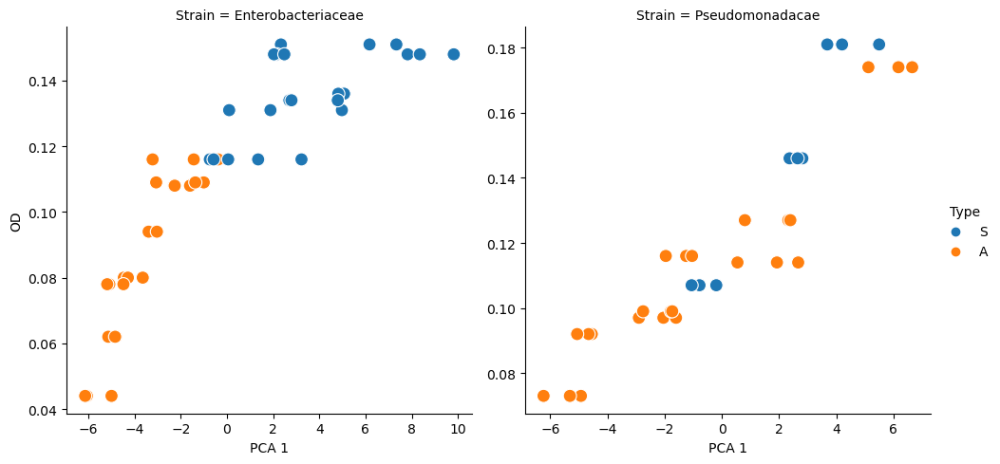

In [63]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()

## With growth-normalized peak intensities

Enterobacteriaceae
[0.41017667 0.06808062 0.0629911  0.05873563]
Pseudomonadacae
[0.20669927 0.14043831 0.12664657 0.09374078]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


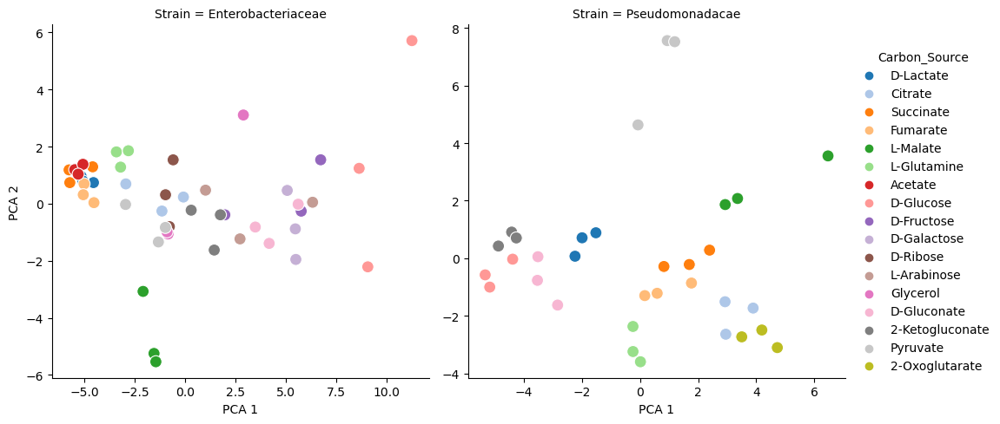

In [64]:
strains = dfu.Strain.unique()
df_list = []
for strain in strains:
    print(strain)
    pca = PCA(n_components=4)
# X = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score(log)', aggfunc='mean')
# dfu['ID'] = dfu['STRAIN
    sidx = dfu.Strain == strain
    X = dfu.loc[sidx,:].pivot(index = 'SID', columns = 'Metabolite', values = 'Growth-normalized peaks')#Z-score(log)
    X_std =X.std(axis=0)
    X_std[X_std==0]=1
    Xi = (X-X.mean(axis = 0))/X_std
    Xi.fillna(0, inplace=True)
# Xi.fillna(Xi.min(axis=0), inplace=True)
# imputer = SimpleImputer()
# Xi = imputer.fit_transform(X)
    fit = pca.fit(Xi)
    fitT = pca.fit_transform(Xi)
    print(fit.explained_variance_ratio_)
    pca_df_s = pd.DataFrame(fitT, columns = ['PCA 1', 'PCA 2', 'PCA 3', 'PCA 4'])
    pca_df_s['SID'] = Xi.index
    pca_df_s['Strain'] = pca_df_s['SID'].map(cid_dict_s)
    pca_df_s['Carbon_Source'] = pca_df_s['SID'].map(cid_dict_c)
    pca_df_s['Type'] = pca_df_s['SID'].map(cid_dict_t)
    pca_df_s['OD'] = [cid_strain_cs_od[strain, met] for met in pca_df_s['Carbon_Source']]
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
# sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()
# Sample SID looks like outlier C11_E1

In [65]:
Xnew = fit.fit_transform(Xi)

In [71]:
pca.components_

(4, 55)

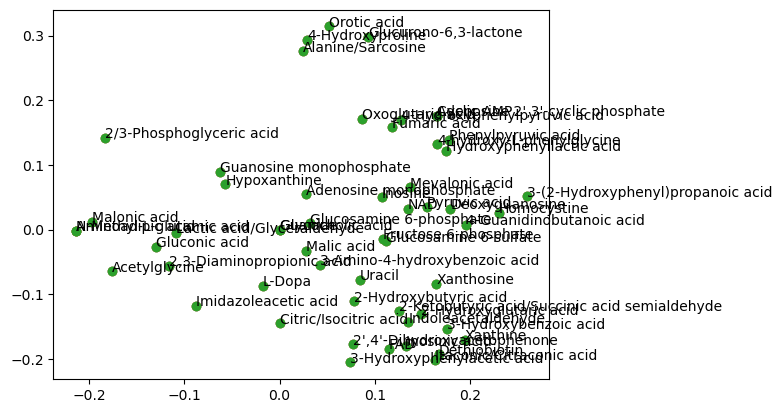

In [76]:
plt.scatter(pca.components_[0,:], pca.components_[1,:])
for i in range(len(pca.components_[0])):
    plt.annotate(X.columns[i], (pca.components_[0,i], pca.components_[1, i]))
plt.show()


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


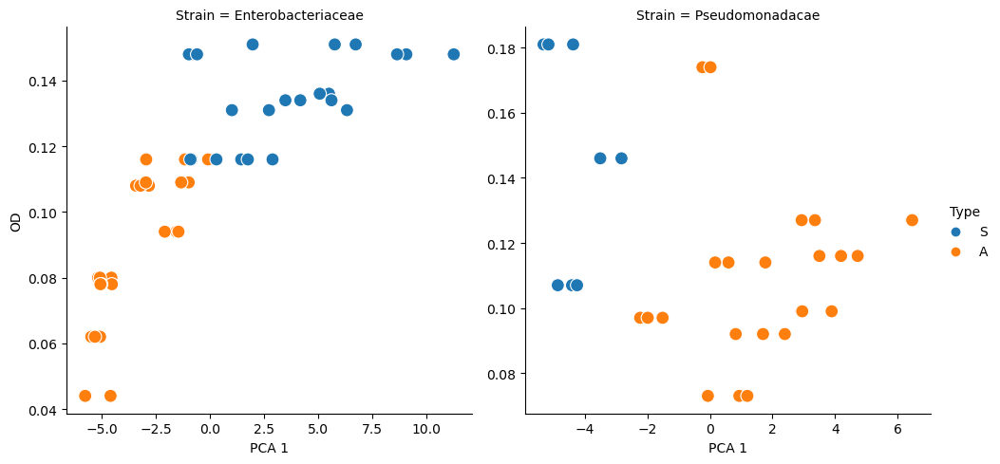

In [77]:
sns.relplot(data = pca_df, x = 'PCA 1', y = 'OD', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
plt.show()

In [38]:
# od_t_s = dfm.loc[:, ['OD', 'Type', 'Strain']].drop_duplicates()


In [39]:
# sns.boxplot(y = od_t_s['OD'], x =  od_t_s['Type'], hue = od_t_s['Strain'])
# plt.show()

# How much is of the variability is predicted by OD?

### Permanova?? Manova??
https://www.statsmodels.org/stable/generated/statsmodels.multivariate.manova.MANOVA.html#statsmodels.multivariate.manova.MANOVA


In [40]:
result_list = []
ykey = 'Growth-normalized peaks'
for strain in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        sidx = dfu.Strain == strain
        idx = (dfu.Metabolite == m)&sidx
        for key in ['OD', 'Type']:
            Xdata = sm.add_constant(dfu.loc[idx, key])
            Ydata = (dfu.loc[idx, [ykey]]-np.nanmean(dfu.loc[idx, [ykey]]))/np.nanstd(dfu.loc[idx, [ykey]])
            if key == 'OD':
                Xdata['OD'] = (Xdata['OD']-np.nanmean(Xdata['OD']))/np.nanstd(Xdata['OD'])
            else:
                Xdata = pd.get_dummies(Xdata, drop_first=True)
            nanidx = Ydata[ykey].isna()
            Xdata = Xdata.loc[~nanidx,:]
            Xdata = sm.add_constant(Xdata)
            Ydata = Ydata[~nanidx]
            if len(Ydata) > 10:
                # smodel = sm.GLM(Ydata, XdataD)
                smodel = sm.OLS(Ydata, Xdata)
                results = smodel.fit()
                if not np.isnan(results.rsquared_adj):
                    result_list.append([strain, m, key, results.rsquared, results.rsquared_adj, results.aic, results.f_pvalue])
reg_df = pd.DataFrame(result_list, columns = ['Strain', 'Metabolite', 'Variable', 'R squared', 'Adjusted R squared', 'AIC', 'P-value (F-statistic)'])
# cat_columns = ['Strain', 'Type', 'Carbon_Source']
# XdataD=Xdata
# Xdata[cat_columns] = XdataD[cat_columns].astype('category')


/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_81684/955099701.py:9: RuntimeWarning: Mean of empty slice
  Ydata = (dfu.loc[idx, [ykey]]-np.nanmean(dfu.loc[idx, [ykey]]))/np.nanstd(dfu.loc[idx, [ykey]])
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_81684/955099701.py:11: RuntimeWarning: Mean of empty slice
  Xdata['OD'] = (Xdata['OD']-np.nanmean(Xdata['OD']))/np.nanstd(Xdata['OD'])
/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_81684/955099701.py:9: RuntimeWarning: Mean of empty slice
  Ydata = (dfu.loc[idx, [ykey]]-np.nanmean(dfu.loc[idx, [ykey]]))/np.nanstd(dfu.loc[idx, [ykey]])
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1872: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dt

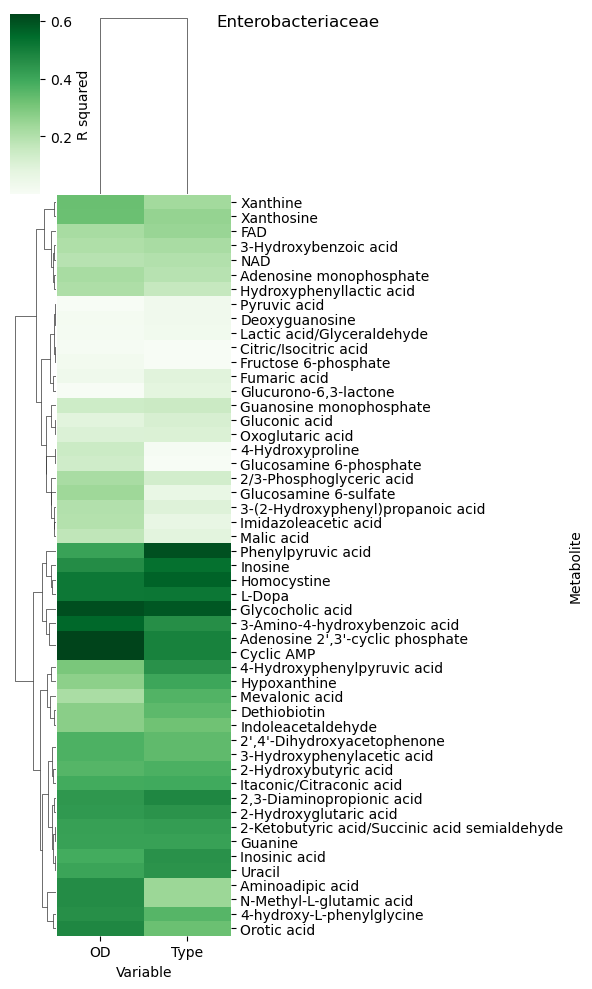

In [41]:
strain = 'Enterobacteriaceae'
sidx = reg_df.Strain == strain
reg_pivot = reg_df.loc[sidx,:].pivot(index = 'Metabolite', columns = ['Variable'], values = 'R squared')
g = sns.clustermap(reg_pivot, yticklabels=True, cmap = 'Greens', cbar_kws={'label': 'R squared'}, figsize = (6,10))
plt.savefig('explained_variance_entero.svg')

g.fig.suptitle(strain)
plt.show()

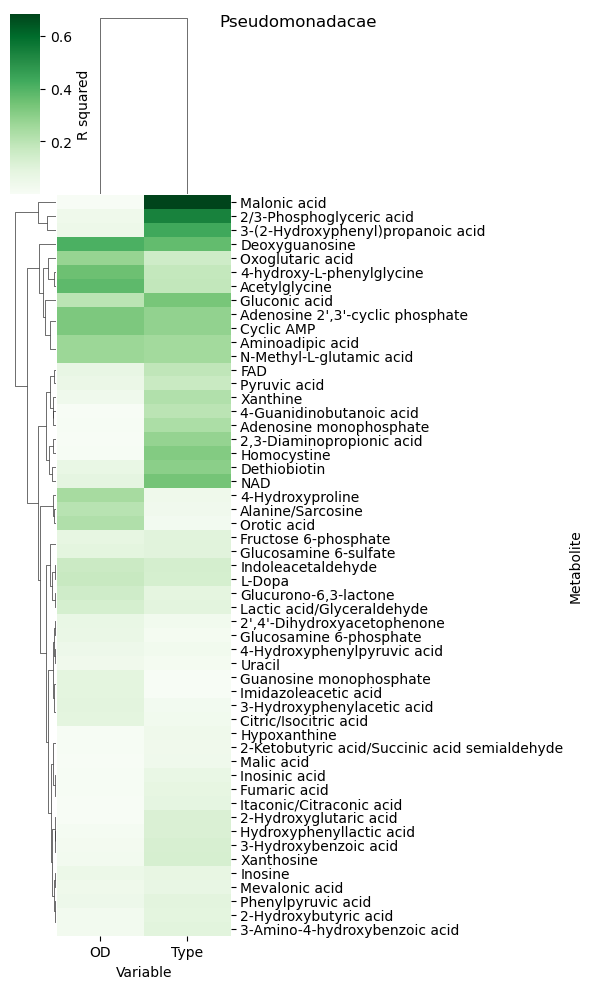

In [42]:
strain = 'Pseudomonadacae'
sidx = reg_df.Strain == strain
reg_pivot = reg_df.loc[sidx,:].pivot(index = 'Metabolite', columns = ['Variable'], values = 'R squared')
g = sns.clustermap(reg_pivot, yticklabels=True, cmap = 'Greens', cbar_kws={'label': 'R squared'}, figsize = (6,10))
g.fig.suptitle(strain)
plt.savefig('explained_variance_pseudomonas.svg')
plt.show()

# Scatterplots of Z-scores vs OD

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


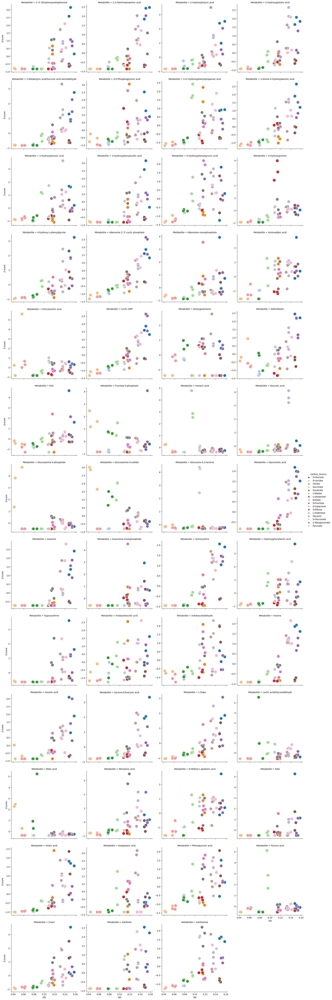

In [43]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
sns.relplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Carbon_Source', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4, s=200, palette = 'tab20')
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


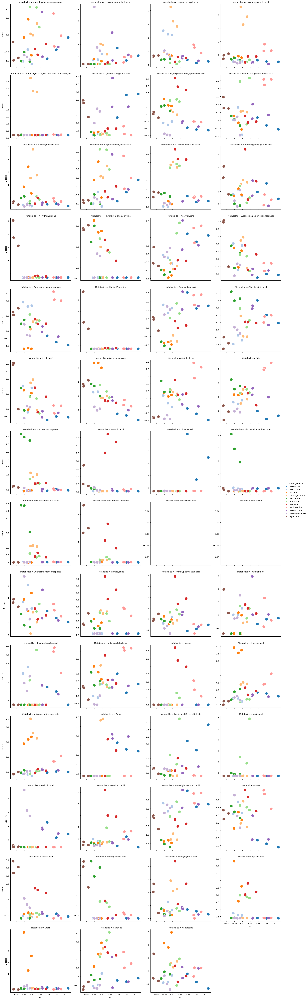

In [44]:
sidx = dfu.Strain == 'Pseudomonadacae'
# sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
sns.relplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Carbon_Source', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4, s=200, palette = 'tab20')
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

## everything below here is from 2

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


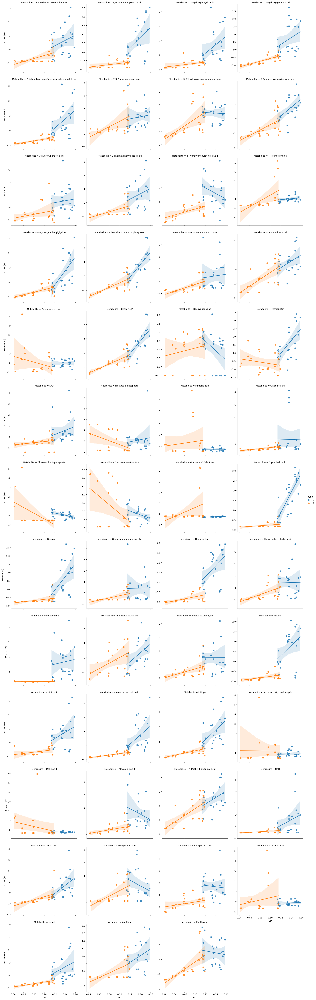

In [45]:
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score (PI)', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


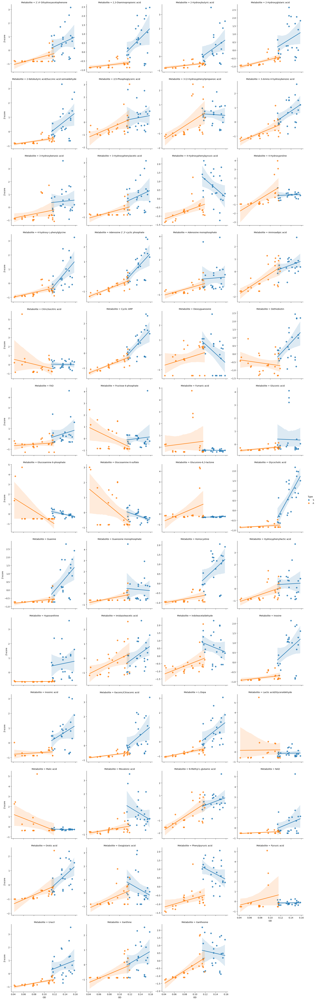

In [46]:
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.lmplot(data = dfu.loc[sidx, :], x = 'OD', y = 'Z-score', hue = 'Type', col = 'Metabolite', facet_kws={'sharey': False, 'sharex': True}, col_wrap=4)
# plt.savefig('correlation logscaled peak vs od.svg')
plt.show()

# Heatmaps

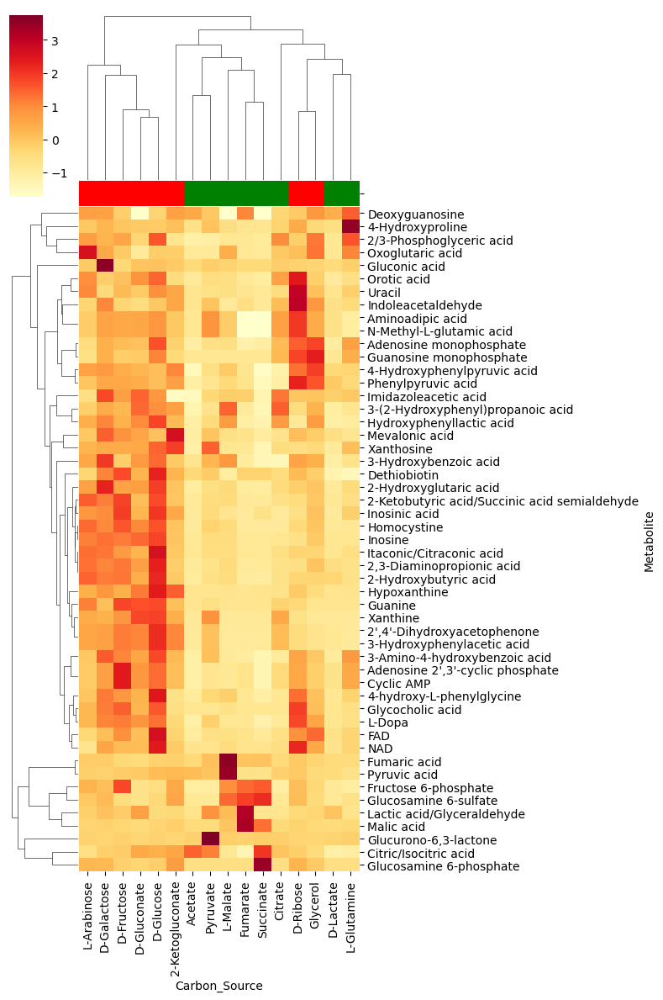

In [48]:
sidx = dfu.Strain == 'Enterobacteriaceae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Peak_Intensity', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
# mask = dfu_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation")
plt.show()

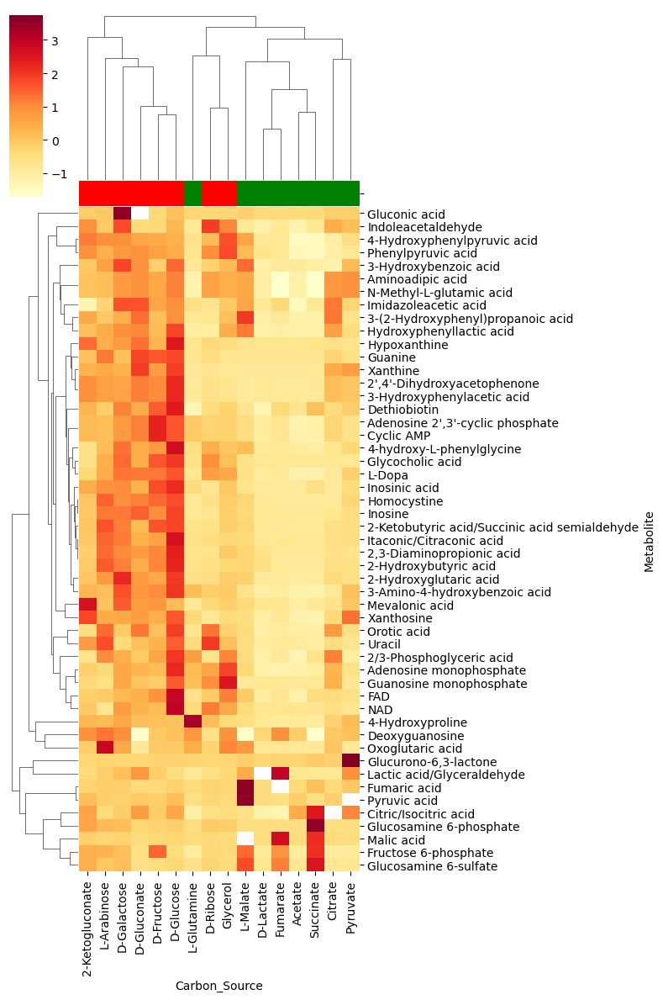

In [49]:
sidx = dfu.Strain == 'Enterobacteriaceae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Growth-normalized peaks', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

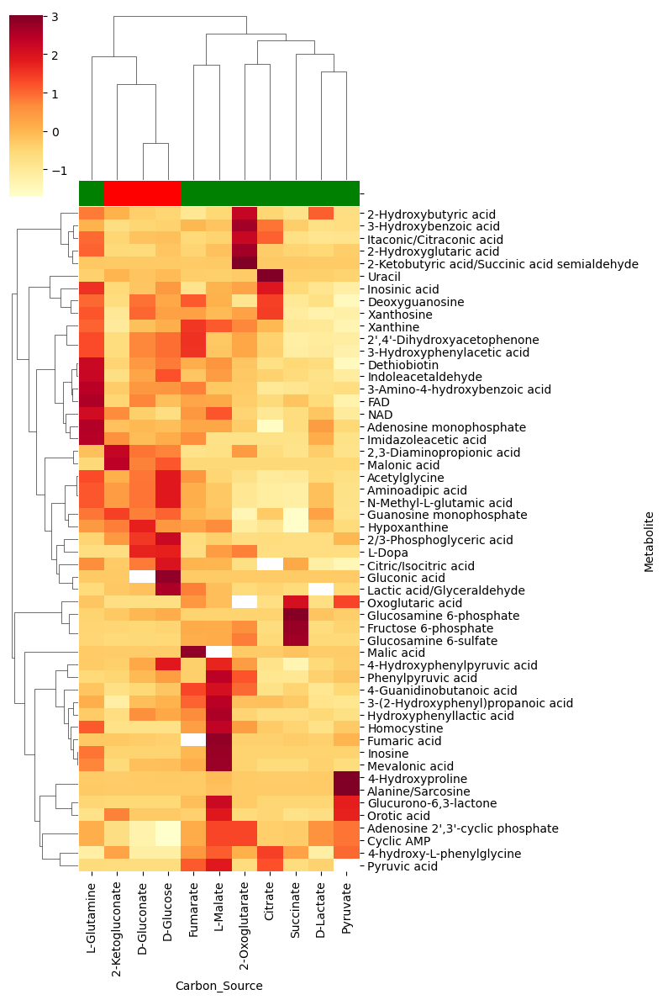

In [50]:
sidx = dfu.Strain == 'Pseudomonadacae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score (PI)', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

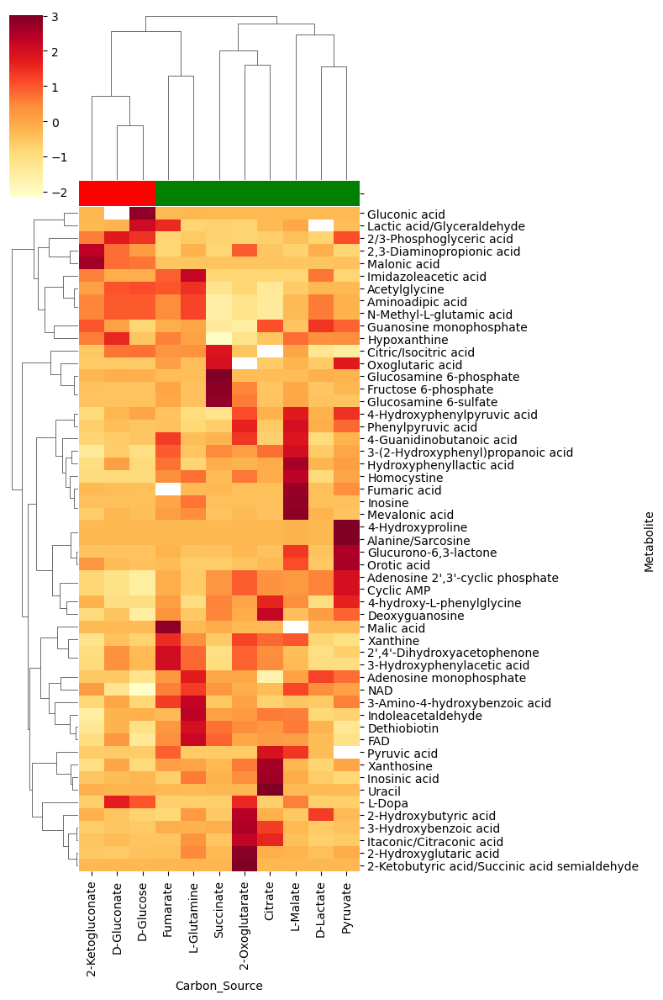

In [51]:
sidx = dfu.Strain == 'Pseudomonadacae'
df_pivot = pd.pivot_table(dfu.loc[sidx, :], index = 'Metabolite', columns = 'Carbon_Source', values = 'Z-score', aggfunc='mean', fill_value=np.nan)
# dfm_pivotZ = (dfm_pivot.T - np.nanmean(dfm_pivot, axis = 1))/np.nanstd(dfm_pivot, axis # = 1)
df_pivot = df_pivot.loc[df_pivot.isna().sum(axis=1)<4,:]

df_pivotZ = ((df_pivot.T - df_pivot.mean(axis=1))/df_pivot.std(axis=1)).T
# dfm_pivotZ = dfm_pivotZ.loc[:,dfm_pivotZ.isna().sum(axis=0)<10].T
mask = df_pivotZ.isna()

# dfu_pivotZ.T.fillna(dfu_pivotZ.min(axis = 1), inplace = True)
df_pivotZ.fillna(0, inplace = True)# 0 is mean since these are standardized

sns.clustermap(df_pivotZ, figsize=(8, 12), yticklabels = True, col_colors=pd.Series(cs_to_color_map), cmap = 'YlOrRd', metric="correlation", mask = mask)
plt.show()

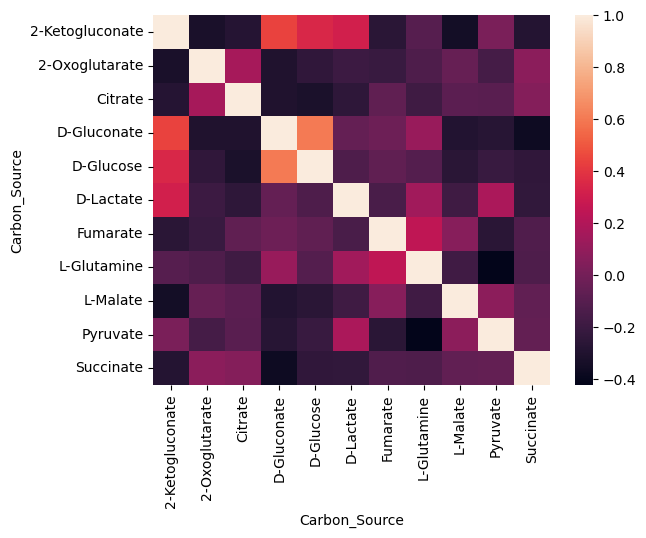

In [629]:
sns.heatmap(df_pivotZ.corr())
plt.show()

# Fit data to equation

$X(t) = X_0e^{\mu t}$

$\frac{d\sigma_i}{dt} = a_i(\textbf{v})X(t) = a_i(\textbf{v})X_0e^{\mu t}$, $a$ [mmol/gDW/h] -> $\sigma$ [mmol]

$\sigma_i(t) = \int_0^t a_i(\textbf{v})X_0e^{\mu t} dt = a_i(\textbf{v})X_0 \int_0^t e^{\mu t} = a_i(\textbf{v})X_0 (\frac{e^{\mu t}-1}{\mu})$

$ln(\sigma_i(t)) = ln(a_i(\textbf{v})) + ln(X_0) + ln(\frac{e^{\mu t}-1}{\mu})$

$\mu = \frac{ln(X)-ln(X_0)}{\Delta t} $


t = 24 h
But X0 is not nown....

$\sigma_i(t)=a_i(\textbf{v})X_0 (\frac{e^{\mu t}-1}{\mu}) = a_i(\textbf{v})(\frac{X(t)-X0}{\mu}) = bX(t) + bX_0, \rightarrow b=\frac{a_i}{\mu}$

Thus, concentrations increases linearly with growth


# Fit data to equation

$X(t) = X_0e^{\mu t}$

$\frac{d\sigma_i}{dt} = a_iX(t) = a_iX_0e^{\mu t}$, $a$ [mmol/gDW/h] -> $\sigma$ [mmol]

$\sigma_i(t) = \sigma_i(0) + \int_0^t a_iX_0e^{\mu t} dt = \sigma_i(0) + a_iX_0 \int_0^t e^{\mu t} = \sigma_i(0) + a_iX_0 (\frac{e^{\mu t}-1}{\mu})$

$\sigma_i(t)-\sigma_i(0)=a_iX_0 (\frac{e^{\mu t}-1}{\mu}) = a_i(\frac{X(t)-X_0}{\mu}) = bX(t) - bX_0, \rightarrow b=\frac{a_i}{\mu}$

$a_i = \mu \frac{\sigma_i-\sigma_i(0)}{X(t)-X_0}$
Thus, concentrations increases linearly with growth


# Question 2 - > Are metabolite values predictive of changes in release rates

## Load models

In [685]:
import cobra
import sys
sys.path.append('../../code/')
import leakage

In [600]:
model_e = cobra.io.read_sbml_model('../../models/e_coli/iML1515.xml')
model_e.solver = 'gurobi'
model_ez = cobra.io.read_sbml_model('../../models/e_coli/momentiJO1366.xml')
model_ez.id = 'moment-iJO1366'
model_p = cobra.io.read_sbml_model('../../models/iJN1463.xml')
model_p.solver = 'gurobi'
model_pz = cobra.io.read_sbml_model('../../models/momentiJN1463.xml')
model_pz.solver = 'gurobi'


In [672]:
cs_to_exchange = {'D-Glucose': 'EX_glc__D_e',
                'D-Fructose': 'EX_fru_e',
                'D-Galactose': 'EX_gal_e',
                'D-Ribose': 'EX_rib__D_e',
                'L-Arabinose': 'EX_arab__L_e',
                'Glycerol': 'EX_glyc_e',
                'D-Gluconate': 'EX_glcn_e',
                '2-Ketogluconate': 'EX_25dkglcn_e',
                'D-Lactate': 'EX_lac__L_e',
                '2-Oxoglutarate': 'EX_akg_e',
                'Fumarate': 'EX_fum_e',
                'L-Malate': 'EX_mal__L_e',
                'L-Glutamine': 'EX_gln__L_e',
                'Acetate': 'EX_ac_e',
                'Succinate': 'EX_succ_e',
                'Citrate': 'EX_cit_e',
                'Pyruvate': 'EX_pyr_e'}

In [673]:
model_dict = {'Enterobacteriaceae': model_ez,
              'Pseudomonadacae'   : model_pz}

## Get metabolite values

In [674]:
fnmc = folder / 'ms_name_to_id_curated.csv'
dfmc = pd.read_csv(fnmc, index_col = 0)
translate_dict = dfmc[['Untargeted MS name', 'Metabolite ID']].set_index('Untargeted MS name').to_dict()['Metabolite ID']
model = model_ez

In [675]:
translate_dict_r = {value:key for key, value in translate_dict.items()}

In [676]:
measured_mets = []
measured_metnames = []
for key, value in translate_dict.items():
    m_id = f'{value}_c'
    measured_mets.append(m_id)
    measured_metnames.append(key)
    

In [691]:
metabolite_value_dict = OrderedDict()
all_metabolite_values_dict = OrderedDict()
metabolite_value_list = []
for strain in dfu.Strain.unique():
    strain_metabolite_value_dict = OrderedDict()
    strain_all_metabolite_value_dict = OrderedDict()
    model = model_dict[strain]
    model.reactions.EX_glc__D_e.lower_bound = 0
    model_metabolites = [m.id for m in model.metabolites]
    for cs, ex_id in cs_to_exchange.items():
        with model:
            try:
                r = model.reactions.get_by_id(ex_id)
            except KeyError:
                print(f'{ex_id} not in model')
                continue
            m_ex = r.metabolites.popitem()[0]
            try:
                nC = model_ez.metabolites.get_by_id(m_ex.id).elements['C']
            except KeyError:
                if len(m_ex.elements):
                    nC = m_ex.elements['C']
                else:
                    nC = 6
            lb = 60/nC
            # model.reactions.EX_pi_e.lower_bound = -1
            r.lower_bound = -lb
            solution = model.optimize()
            if solution.objective_value:
                # print(strain, cs)
                # print(model.summary())

                # growth_dict[cs] = solution.objective_value
                shadow_prices = leakage.estimate_shadow_prices(model, delta = 0.01)
                strain_all_metabolite_value_dict[cs] = {key:-value for key, value in shadow_prices.items()}
                strain_metabolite_value_dict[cs] = {m: -shadow_prices[m] for m in measured_mets if m in model_metabolites}
                # strain_metabolite_value_dict[cs] = -solution.shadow_prices[[x for x in measured_mets if x in model_metabolites]]
                # strain_all_metabolite_value_dict[cs] = -solution.shadow_prices[[x.id for x in model.metabolites if x.id[-2:] == '_c']]
                for key, value in strain_metabolite_value_dict[cs].items():
                    m_name = translate_dict_r[key[:-2]]
                    metabolite_value_list.append([strain, cs,m_name , value])
                break
    metabolite_value_dict[strain] = strain_metabolite_value_dict
    all_metabolite_values_dict[strain] = strain_all_metabolite_value_dict

## PCA of metabolite values

### Based only the measured metabolites

[0.58241056 0.21252585]
[0.57229022 0.22241806]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


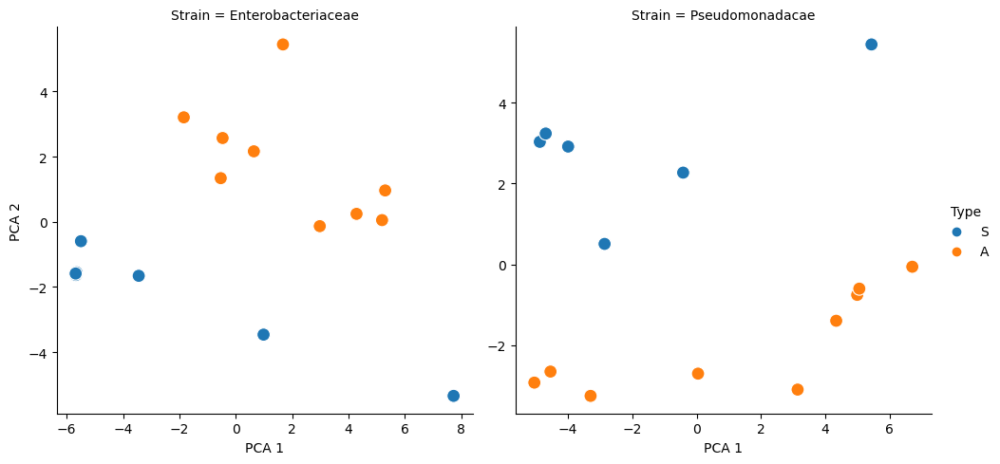

In [678]:
metabolite_value_df = pd.DataFrame(metabolite_value_list, columns = ['Strain', 'Carbon Source', 'Metabolite', 'Metabolite values'])
df_list = []
for strain in metabolite_value_df.Strain.unique():
    idx = metabolite_value_df.Strain == strain
    wide_df = metabolite_value_df.loc[idx, ['Carbon Source', 'Metabolite', 'Metabolite values']].pivot(index = 'Carbon Source', columns = 'Metabolite')['Metabolite values']
    X = (wide_df - wide_df.mean())/wide_df.std()
    X.dropna(axis = 1, inplace = True)
    pca = PCA(2)
    fit = pca.fit(X)
    fitT = pca.fit_transform(X)
    print(fit.explained_variance_ratio_)
    pca_df_s = pd.DataFrame(fitT, columns = ['PCA 1', 'PCA 2'])
    pca_df_s['Carbon_Source'] = wide_df.index
    pca_df_s['Strain'] = strain
    pca_df_s['Type'] = pca_df_s.Carbon_Source.map(cs_to_type_map)
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
# sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Carbon_Source', col = 'Strain', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()

# Based on all metabolites

In [679]:
X.dropna(axis = 1)

Metabolite,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,4-Guanidinobutanoic acid,4-Hydroxyphenylpyruvic acid,4-Hydroxyproline,Adenosine monophosphate,Alanine/Sarcosine,Aminoadipic acid,Citric/Isocitric acid,...,Malic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,-0.559499,-0.071075,-1.234405,-1.038345,-1.286477,-0.444574,-0.118763,-0.706775,-1.667366,-0.505187,...,-0.379919,-0.504504,-1.296694,-0.150766,-0.512777,-1.277545,-0.786771,0.700032,1.198293,-0.169040
2-Oxoglutarate,1.654727,1.158444,1.358998,-0.689818,1.378303,1.340905,-0.856569,1.481485,1.231828,1.298005,...,1.067360,1.330813,0.741782,0.927772,1.210386,1.395098,1.460308,-0.141152,-0.746196,0.254888
Acetate,0.363695,0.038215,1.117935,1.049795,1.108373,0.406195,0.957967,0.929024,0.875586,0.431205,...,0.544382,0.317911,1.353647,0.397556,0.510635,1.089159,1.079128,-0.083672,0.430816,1.440286
Citrate,-1.529527,-1.847937,-0.386942,0.984195,-0.316685,-1.308808,0.192294,-1.051704,-0.005489,-1.604481,...,-1.714624,-1.441254,0.069452,-1.567667,-1.603036,-0.358324,-1.125626,-1.354182,-0.637274,0.678794
D-Fructose,0.182246,0.321086,-0.587974,-0.904873,-0.634977,0.204398,-0.081038,-0.031274,0.733735,0.243573,...,0.380058,0.259076,-0.691066,0.439156,0.314201,-0.609053,-0.039785,0.829035,0.492549,-0.951852
D-Gluconate,-0.683372,-0.262229,-1.350790,-1.070335,-1.394224,-0.774421,-0.322361,-0.844211,-1.596393,-0.664163,...,-0.526172,-0.642948,-1.449520,-0.275663,-0.650561,-1.386665,-0.934342,0.678465,1.142110,-0.309252
D-Glucose,-0.767472,-0.276087,-1.412697,-1.083360,-1.461017,-0.853419,-0.408475,-0.901916,0.479095,-0.737437,...,-0.604974,-0.722042,-1.509578,-0.345315,-0.744319,-1.454227,-0.995454,0.650982,1.131559,-1.468719
D-Lactate,0.844937,1.157709,1.048337,-0.730786,1.060116,1.075155,1.354269,0.690642,-0.916955,1.051276,...,1.166816,0.952036,1.484243,1.147907,1.049203,1.055820,0.673521,0.779424,0.740706,1.089043
D-Ribose,1.455029,1.758103,0.520847,-0.626368,0.212264,1.742873,-2.366691,1.226618,-0.552901,1.670041,...,1.794301,1.677607,-0.967680,1.699024,1.734936,0.266207,1.276522,1.601233,-1.015639,-1.528023


[0.5319201  0.27494289]
[0.55137414 0.19193015]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


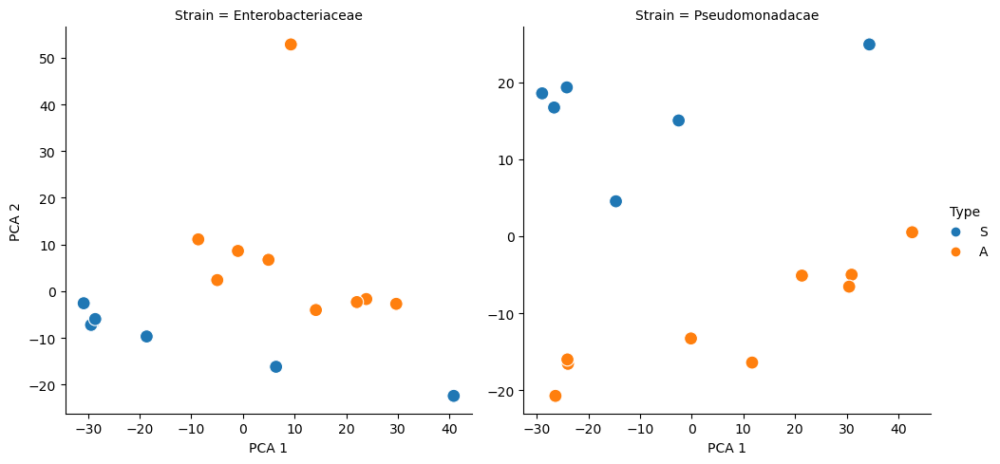

In [680]:
df_list = []
for strain, strain_dict in all_metabolite_values_dict.items():
    wide_df = pd.DataFrame(strain_dict).T
    X = (wide_df - wide_df.mean())/wide_df.std()
    X.dropna(axis = 1, inplace = True)
    pca = PCA(2)
    fit = pca.fit(X)
    fitT = pca.fit_transform(X)
    print(fit.explained_variance_ratio_)
    pca_df_s = pd.DataFrame(fitT, columns = ['PCA 1', 'PCA 2'])
    pca_df_s['Carbon_Source'] = wide_df.index
    pca_df_s['Strain'] = strain
    pca_df_s['Type'] = pca_df_s.Carbon_Source.map(cs_to_type_map)
    df_list.append(pca_df_s)
pca_df = pd.concat(df_list)
sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab10', s = 100, facet_kws={'sharey': False, 'sharex': False}, hue_order=['S','A'])
# sns.relplot(data = pca_df, x = 'PCA 1', y = 'PCA 2', hue = 'Type', col = 'Strain', palette='tab20', s = 100, facet_kws={'sharey': False, 'sharex': False})
plt.show()

In [681]:
data = []
for strain in dfu.Strain.unique():
    all_met_value_dict = metabolite_value_dict[strain]
    # all_met_value_dict = all_metabolite_values_dict[strain]
    carbon_sources = [x for x in all_met_value_dict.keys()]
    n = len(carbon_sources)
    
    for i in range(n):
        for j in range(i+1, n):
            cs1 = carbon_sources[i]
            cs2 = carbon_sources[j]
            mv_corr,_ = st.spearmanr(all_met_value_dict[cs1],all_met_value_dict[cs2])
    
            # Release rates
            idx1 = (dfu.Strain == strain) & (dfu.Carbon_Source == cs1)
            idx2 = (dfu.Strain == strain) & (dfu.Carbon_Source == cs2)
            s1 = dfu.loc[idx1, ['Metabolite', 'Growth-normalized peaks']].groupby('Metabolite').mean('Growth-normalized peaks') # Growth-normalized peaks
            s2 = dfu.loc[idx2, ['Metabolite', 'Growth-normalized peaks']].groupby('Metabolite').mean('Growth-normalized peaks') # Growth-normalized peaks
            temp = pd.concat([s1,s2], axis=1).dropna(axis=0)
            if len(temp):
                exo_corr,_ = st.spearmanr(temp.iloc[:,0], temp.iloc[:,1])
                data.append([strain, cs1, cs2, mv_corr, exo_corr])
dfmantel = pd.DataFrame(data, columns = ['Strain', 'CS 1', 'CS 2', 'MV corr', 'Exo corr'])

In [682]:
temp

,Growth-normalized peaks,Growth-normalized peaks
Metabolite,,
"2',4'-Dihydroxyacetophenone",1732.787161,978.047393
"2,3-Diaminopropionic acid",506.908804,0.000000
2-Hydroxybutyric acid,10939.048826,8963.090370
2-Hydroxyglutaric acid,113350.754862,128197.463584
2-Ketobutyric acid/Succinic acid semialdehyde,3024.355483,1660.348486
2/3-Phosphoglyceric acid,563.794239,4079.195739
3-(2-Hydroxyphenyl)propanoic acid,21289.435488,15812.921767
3-Amino-4-hydroxybenzoic acid,2911.009198,4622.673656
3-Hydroxybenzoic acid,9789.490639,1645.909221


MantelResult(0.33865468960242606, 0.0293, 2.227739346563709)


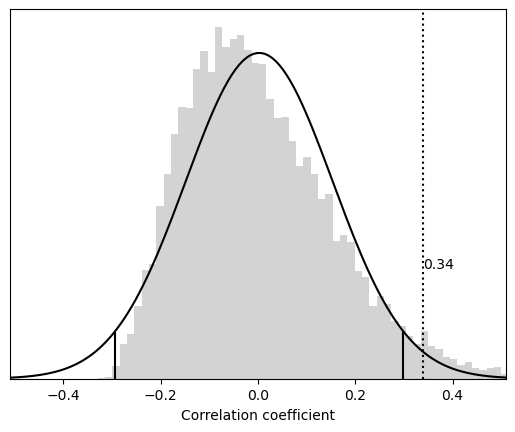

In [683]:
strain = 'Pseudomonadacae'
sidx = dfmantel.Strain == strain
mr = mantel.test(dfmantel.loc[sidx, 'Exo corr'], dfmantel.loc[sidx, 'MV corr'], method = 'spearman')
print(mr)
mantel.plot(mr)
plt.xlim(-0.51, 0.51)
plt.show()

MantelResult(0.3062328671656691, 0.0087, 2.760354646038616)


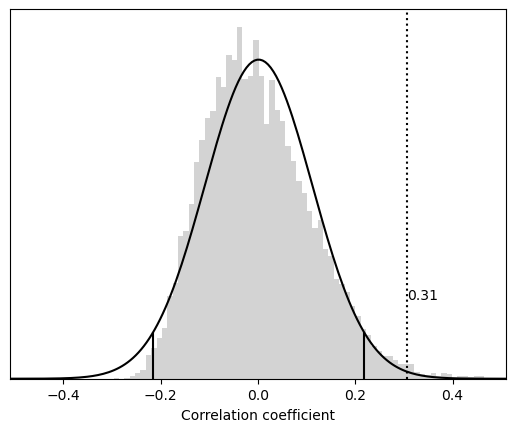

In [684]:
strain = 'Enterobacteriaceae'
sidx = dfmantel.Strain == strain
mr = mantel.test(dfmantel.loc[sidx, 'Exo corr'], dfmantel.loc[sidx, 'MV corr'], method = 'spearman')
print(mr)
mantel.plot(mr)
plt.xlim(-0.51, 0.51)
plt.show()

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


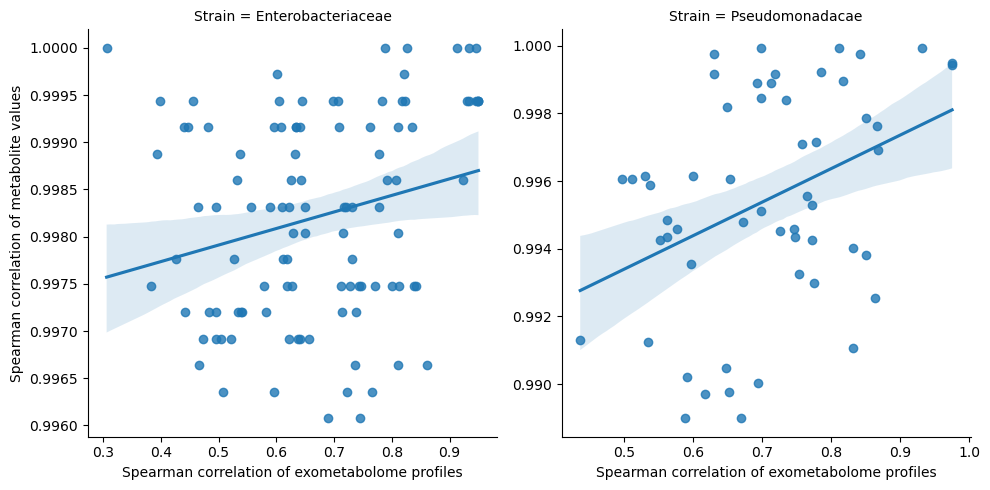

In [671]:
g = sns.lmplot(data = dfmantel, x = 'Exo corr', y = 'MV corr', col = 'Strain', facet_kws={'sharey': False, 'sharex': False})
for ax in g.axes[0]:
    ax.set_xlabel('Spearman correlation of exometabolome profiles')
g.axes[0][0].set_ylabel('Spearman correlation of metabolite values')
plt.show()

## Heatmap of correlations

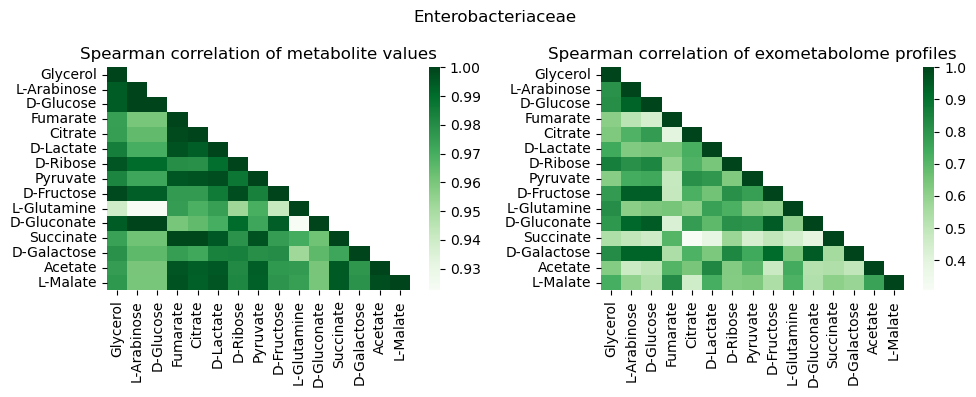

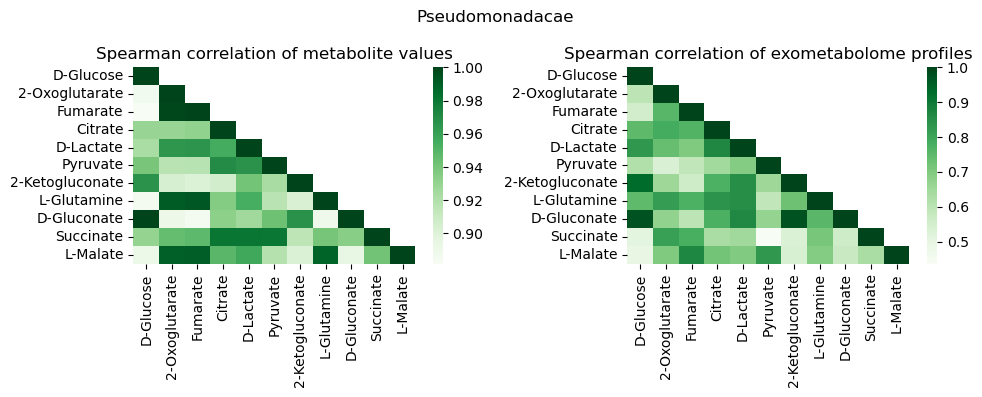

In [657]:
for strain in dfmantel.Strain.unique():
    sidx = dfmantel.Strain == strain
    # carbon_sources = list(cs_to_exchange.keys())
    carbon_sources = set(dfmantel.loc[sidx, ['CS 1', 'CS 2']].values.flatten())
    index_cs_dict = {cs:i for i, cs in enumerate(carbon_sources)}
    Ncs = len(carbon_sources)
    corr_matrix_mv = np.nan*np.zeros((Ncs,Ncs))
    corr_matrix_ex = np.nan*np.zeros((Ncs,Ncs))
    for _, row in dfmantel.loc[sidx, :].iterrows():
        i = index_cs_dict[row['CS 1']]
        j = index_cs_dict[row['CS 2']]
        if i < j:
            k = i
            i = j
            j = k
        corr_matrix_mv[i,j] = row['MV corr']
        corr_matrix_ex[i,j] = row['Exo corr']
    for i in range(Ncs):
        corr_matrix_mv[i,i] = 1
        corr_matrix_ex[i,i] = 1

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (10, 4))
    fig.suptitle(strain)
    sns.heatmap(corr_matrix_mv, cmap = 'Greens', xticklabels=carbon_sources, yticklabels=carbon_sources, ax = ax1)
    ax1.set_title('Spearman correlation of metabolite values')
    sns.heatmap(corr_matrix_ex, cmap = 'Greens', xticklabels=carbon_sources, yticklabels=carbon_sources, ax = ax2)
    ax2.set_title('Spearman correlation of exometabolome profiles')
    plt.tight_layout()
    plt.show()

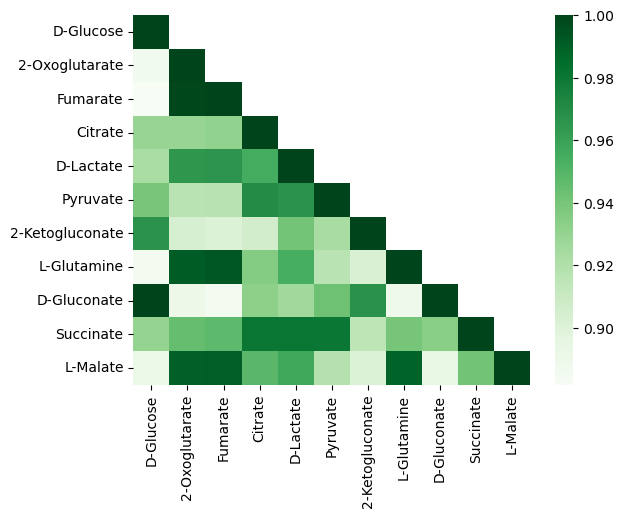

In [517]:
sns.heatmap(corr_matrix_mv, cmap = 'Greens', xticklabels=carbon_sources, yticklabels=carbon_sources)
plt.show()

In [142]:
distL = [x for x in dist.flatten() if not np.isnan(x)]

In [121]:
import mantel

In [144]:
mr = mantel.test(distL, distL)

In [147]:
mr.p

0.0001

## Calculate metabolite values for all pairs

In [419]:
dfu.Carbon_Source.unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', '2-Ketogluconate', 'Pyruvate'], dtype=object)

In [323]:
# metabolite_value_dict = OrderedDict()
# growth_dict = OrderedDict()
# model.reactions.EX_glc__D_e.lower_bound = 0
# for cs, ex_id in cs_to_exchange.items():
#     with model:
#         try:
#             r = model.reactions.get_by_id(ex_id)
#         except KeyError:
#             print(f'{ex_id} not in model')
#             continue
#         m_ex = r.metabolites.popitem()[0]
#         lb = 30/m_ex.elements['C']
#         # model.reactions.EX_pi_e.lower_bound = -1
#         r.lower_bound = -lb
#         solution = model.optimize()
#         if solution.objective_value:
#             # print(model.summary())

#             growth_dict[cs] = solution.objective_value
#             metabolite_value_dict[cs] = -solution.shadow_prices[measured_mets]
        

In [418]:
cs_to_exchange.keys()

dict_keys(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate', 'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol', 'D-Gluconate', '2-Ketogluconate', 'Pyruvate'])

In [515]:
metabolite_value_dict = OrderedDict()
metabolite_value_list = []
for s in dfu.Strain.unique():
    strain_metabolite_value_dict = OrderedDict()
    model = model_dict[s]
    model.reactions.EX_glc__D_e.lower_bound = 0
    model_metabolites = [m.id for m in model.metabolites]
    for cs, ex_id in cs_to_exchange.items():
        with model:
            try:
                r = model.reactions.get_by_id(ex_id)
            except KeyError:
                print(f'{ex_id} not in model')
                continue
            m_ex = r.metabolites.popitem()[0]
            try:
                nC = model_ez.metabolites.get_by_id(m_ex.id).elements['C']
            except KeyError:
                if len(m_ex.elements):
                    nC = m_ex.elements['C']
                else:
                    nC = 6
            lb = 30/nC
            # model.reactions.EX_pi_e.lower_bound = -1
            r.lower_bound = -lb
            solution = model.optimize()
            if solution.objective_value:
                # print(model.summary())

                # growth_dict[cs] = solution.objective_value
                
                strain_metabolite_value_dict[cs] = -solution.shadow_prices[[x for x in measured_mets if x in model_metabolites]]
                for key, value in strain_metabolite_value_dict[cs].items():
                    m_name = translate_dict_r[key[:-2]]
                    metabolite_value_list.append([s, cs,m_name , value])
metabolite_value_dict[s] = strain_metabolite_value_dict

EX_25dkglcn_e not in model
EX_gal_e not in model
EX_arab__L_e not in model


In [516]:
met_value_df = pd.DataFrame(metabolite_value_list, columns = ['Strain', 'Carbon source', 'Metabolite', 'Metabolite value'])

In [491]:
# dfsp = pd.DataFrame(metabolite_value_dict).T

In [492]:
# met_value_df

In [493]:
# dfsp[dfsp < 0] = np.nan
# dfsp.columns = [x.replace('_c', '') for x in dfsp.columns]

In [517]:
metabolite_values = {}
metabolite_zscores = {}
for strain in dfu.Strain.unique():
    dfsp = met_value_df.loc[met_value_df.Strain == strain, :].pivot(index = 'Metabolite', columns = 'Carbon source', values = 'Metabolite value')
    Zdfsp = (dfsp-dfsp.mean())/dfsp.std()
    metabolite_values[strain] = dfsp.T.to_dict()
    metabolite_zscores[strain] = Zdfsp.T.to_dict()

In [518]:
# metabolite_values[dfu.Strain.unique()[0]]

In [519]:
met_value_df.loc[met_value_df.Strain == 'Enterobacteriaceae', :]['Carbon source'].unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', 'Pyruvate'], dtype=object)

# Hankel test on correlation of metabolite profiles vs correlation of shadow prices

In [52]:
import mantel

## In which metabolites are there actually changes?
### Remove data where the metabolite is equal to the carbon source

In [2]:
cs_to_met_dict = {'D-Gluconate': 'Gluconic acid',
                  'Pyruvate': 'Pyruvic acid',
                  'L-Malate': 'Malic acid',
                  'Fumarate': 'Fumaric acid',
                  '2-Oxoglutarate': 'Oxoglutaric acid',
                  'Citrate': 'Citric/Isocitric acid',
                  'D-Lactate': 'Lactic acid/Glyceraldehyde'}

In [3]:
for cs, met in cs_to_met_dict.items():
    idx = (dfu.Carbon_Source == cs) & (dfu.Metabolite == met)
    dfu.loc[idx, 'Peak_Intensity'] = np.nan

NameError: name 'dfu' is not defined

In [4]:
dfu.Carbon_Source

NameError: name 'dfu' is not defined

## Calculate significant changes in metabolite concentration

In [5]:
ttest_pvals = {}
carbon_sources = dfu.Carbon_Source.unique()
nc = len(carbon_sources)
ttest_pval_arr = np.zeros((nc,nc))
data = []
key = 'Corrected Z-score(log)'
p_val_lim = 0.01
for met in dfu.Metabolite.unique():
    for strain in dfu.Strain.unique():
        idx = (dfu.Metabolite == met) & (dfu.Strain == strain)
        for i in range(nc):
            for j in range(nc):
                cs0 = carbon_sources[i]
                cs = carbon_sources[j]
                cs0_type = cs_to_type_map[cs0]
                cs_type = cs_to_type_map[cs]
                if cs0_type == cs_type:
                    if cs0_type == 'S':
                        type_diff = 'Sugar-Sugar'
                    else:
                        type_diff = 'Acid-Acid'
                else:
                    if cs0_type == 'S':
                        type_diff = 'Sugar-Acid'
                    else:
                        type_diff = 'Acid-Sugar'
                idxcs0 = idx & (dfu.Carbon_Source == cs0)
                idxcs  = idx & (dfu.Carbon_Source == cs)
                val0 = dfu.loc[idxcs0, key]
                valcs = dfu.loc[idxcs, key]
                if not (len(val0) and len(valcs)):
                    continue
                x0_arr = []
                x1_arr = []
                for x0, x1 in zip(val0.values, valcs.values):
                    if np.isfinite(x0) and np.isfinite(x1):
                        x0_arr.append(x0)
                        x1_arr.append(x1)
                        
                if not (len(x0_arr)>1 and len(x1_arr)>1):
                    continue
                # print(i, j, cs0, cs, len(val0), len(valcs))
                # I think equal_var is true when the data is log-scaled (se scatterplots)
                tscore = st.ttest_ind(x0_arr, x1_arr, equal_var=True)
                ttest_pvals[(cs0, cs)] = tscore.pvalue
                ttest_pval_arr[i,j] = tscore.pvalue
                # print(s, m, cs0, cs, x0_arr, x1_arr, tscore.pvalue)
                # Qualitative evaluation
                # log_diff = np.log10(np.mean(val0)) - np.log10(np.mean(valcs))
                diff = np.nanmean(x0_arr) - np.nanmean(x1_arr)
                # ratio = np.mean(x0_arr)/np.mean(x1_arr)
                if tscore.pvalue < p_val_lim:
                    if diff > 0:
                        qscore = 1
                    else:
                        qscore = -1
                elif np.isnan(tscore.pvalue):
                    qscore = np.nan
                else:
                    qscore = 0
                # print(cs0, cs, st.ttest_ind(val0, valcs))
                
                data.append([strain, met, cs0, cs, type_diff, np.nanmean(x0_arr), np.nanmean(x1_arr), tscore.pvalue, diff,qscore])
                

NameError: name 'dfu' is not defined

In [6]:
ttest_df = pd.DataFrame(data, columns = ['Strain', 'Metabolite', 'Carbon source 1', 'Carbon source 2', 'Type diff', 'X1', 'X2', 'P-value', 'Difference', 'Ratio', 'Outcome'])

NameError: name 'pd' is not defined

In [7]:
ttest_df.head(5)

NameError: name 'ttest_df' is not defined

In [8]:
ttest_df.sort_values('P-value', ascending=True).to_csv('ttest_results.csv')

NameError: name 'ttest_df' is not defined

In [9]:
n_changes_df = ttest_df.loc[ttest_df['P-value'] < 0.01, :].groupby(['Strain', 'Carbon source 1', 'Carbon source 2']).count().reset_index()

NameError: name 'ttest_df' is not defined

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


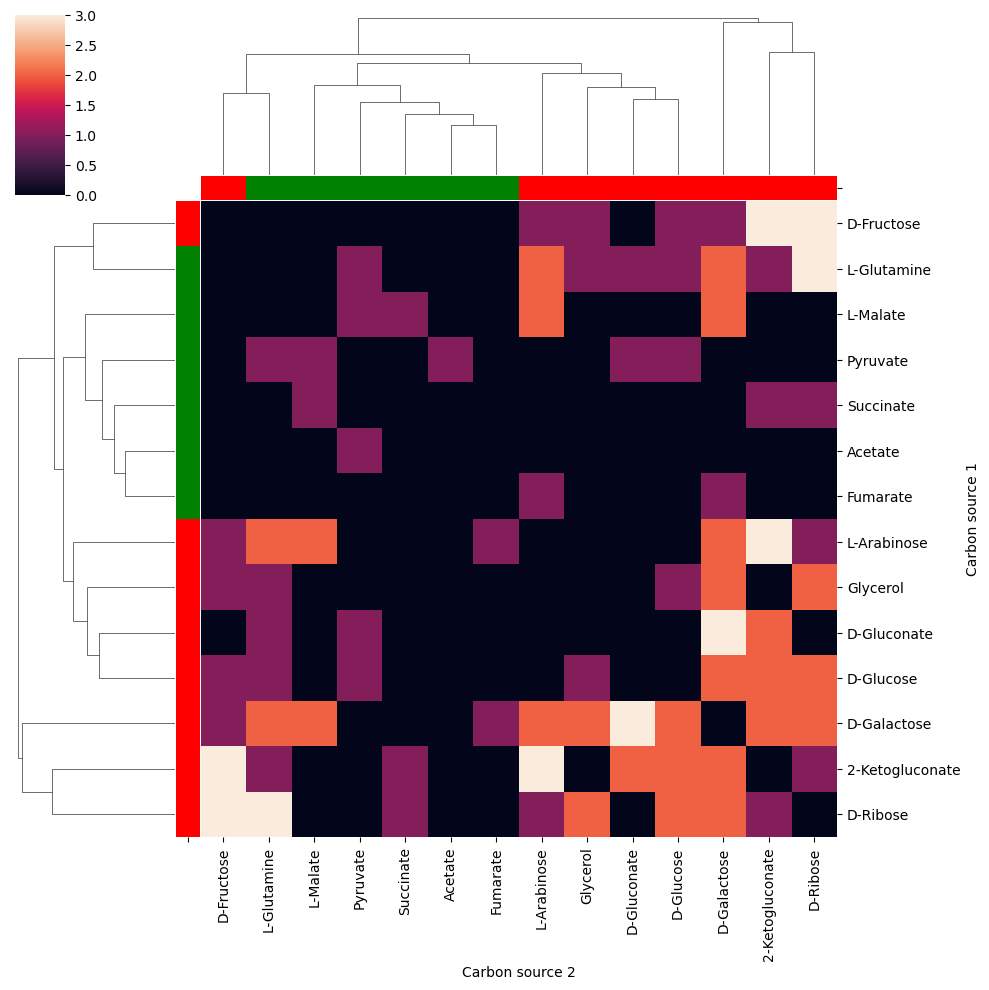

In [314]:
sidx = n_changes_df.Strain == 'Enterobacteriaceae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
sns.clustermap(pivot, row_colors=cscolors, col_colors=cscolors)#, mask = mask)

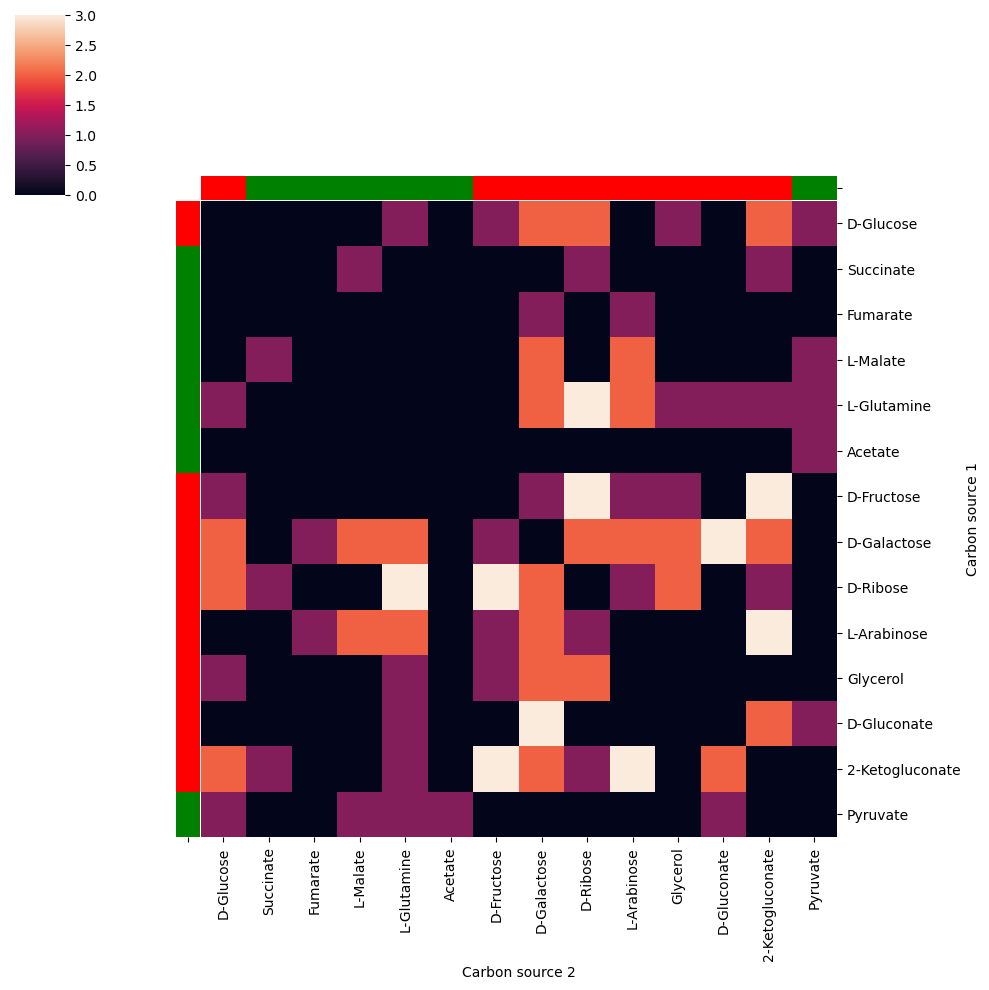

In [316]:
sidx = n_changes_df.Strain == 'Enterobacteriaceae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
col_order = [x for x in carbon_sources if x in pivot.columns]
row_order = [x for x in carbon_sources if x in pivot.index]
sns.clustermap(pivot.loc[row_order,col_order], row_colors=cscolors, col_colors=cscolors, row_cluster=False, col_cluster=False)#, mask = mask)

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/matrix.py:624: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  linkage = hierarchy.linkage(self.array, method=self.method,


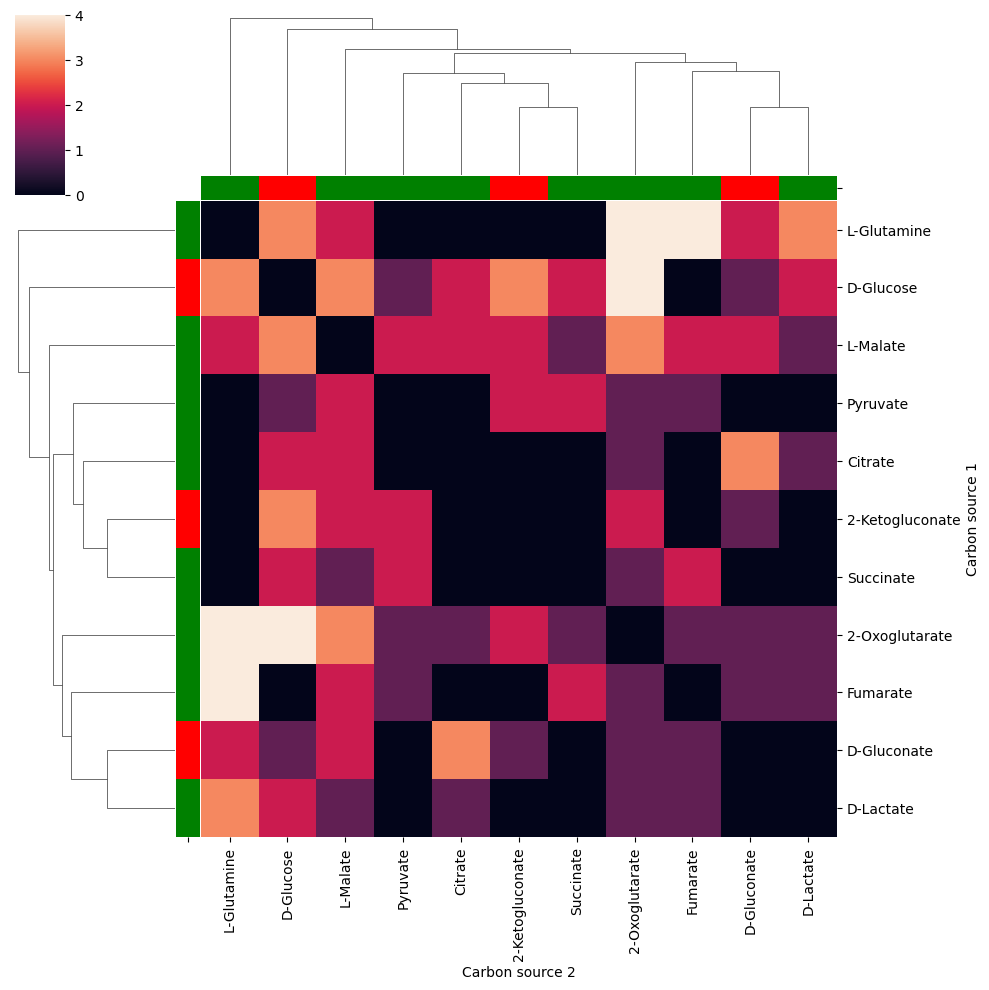

In [318]:
sidx = n_changes_df.Strain == 'Pseudomonadacae'
pivot = n_changes_df.loc[sidx, :].pivot(index = 'Carbon source 1', columns = 'Carbon source 2', values = 'Metabolite')
pivot.fillna(0, inplace = True)
# mask = np.triu(pivot)

cscolors = pd.Series(cs_to_color_map)
sns.clustermap(pivot, row_colors=cscolors, col_colors=cscolors)#, mask = mask)

## Calculate metabolite values for all pairs

In [35]:
fnmc = folder / 'ms_name_to_id_curated.csv'
dfmc = pd.read_csv(fnmc, index_col = 0)
translate_dict = dfmc[['Untargeted MS name', 'Metabolite ID']].set_index('Untargeted MS name').to_dict()['Metabolite ID']
model = model_ez

In [325]:
translate_dict_r = {value:key for key, value in translate_dict.items()}

In [319]:
model_dict = {'Enterobacteriaceae': model_ez,
              'Pseudomonadacae'   : model_p}

In [327]:
measured_mets = []
measured_metnames = []
for key, value in translate_dict.items():
    m_id = f'{value}_c'
    # try:
    #     m = model.metabolites.get_by_id(m_id)
    # except KeyError:
    #     pass
    # else:
    measured_mets.append(m_id)
    measured_metnames.append(key)
    

In [419]:
dfu.Carbon_Source.unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', '2-Ketogluconate', 'Pyruvate'], dtype=object)

In [420]:
cs_to_exchange = {'D-Glucose': 'EX_glc__D_e',
                'D-Lactate': 'EX_lac__L_e',
                'Citrate': 'EX_cit_e',
                '2-Oxoglutarate': 'EX_akg_e',
                'Succinate': 'EX_succ_e',
                'Fumarate': 'EX_fum_e',
                'L-Malate': 'EX_mal__L_e',
                'L-Glutamine': 'EX_gln__L_e',
                'Acetate': 'EX_ac_e',
                'D-Fructose': 'EX_fru_e',
                'D-Galactose': 'EX_gal_e',
                'D-Ribose': 'EX_rib__D_e',
                'L-Arabinose': 'EX_arab__L_e',
                'Glycerol': 'EX_glyc_e',
                'D-Gluconate': 'EX_glcn_e',
                '2-Ketogluconate': 'EX_25dkglcn_e',
                'Pyruvate': 'EX_pyr_e'}

In [323]:
# metabolite_value_dict = OrderedDict()
# growth_dict = OrderedDict()
# model.reactions.EX_glc__D_e.lower_bound = 0
# for cs, ex_id in cs_to_exchange.items():
#     with model:
#         try:
#             r = model.reactions.get_by_id(ex_id)
#         except KeyError:
#             print(f'{ex_id} not in model')
#             continue
#         m_ex = r.metabolites.popitem()[0]
#         lb = 30/m_ex.elements['C']
#         # model.reactions.EX_pi_e.lower_bound = -1
#         r.lower_bound = -lb
#         solution = model.optimize()
#         if solution.objective_value:
#             # print(model.summary())

#             growth_dict[cs] = solution.objective_value
#             metabolite_value_dict[cs] = -solution.shadow_prices[measured_mets]
        

In [418]:
cs_to_exchange.keys()

dict_keys(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate', 'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol', 'D-Gluconate', '2-Ketogluconate', 'Pyruvate'])

In [515]:
metabolite_value_dict = OrderedDict()
metabolite_value_list = []
for s in dfu.Strain.unique():
    strain_metabolite_value_dict = OrderedDict()
    model = model_dict[s]
    model.reactions.EX_glc__D_e.lower_bound = 0
    model_metabolites = [m.id for m in model.metabolites]
    for cs, ex_id in cs_to_exchange.items():
        with model:
            try:
                r = model.reactions.get_by_id(ex_id)
            except KeyError:
                print(f'{ex_id} not in model')
                continue
            m_ex = r.metabolites.popitem()[0]
            try:
                nC = model_ez.metabolites.get_by_id(m_ex.id).elements['C']
            except KeyError:
                if len(m_ex.elements):
                    nC = m_ex.elements['C']
                else:
                    nC = 6
            lb = 30/nC
            # model.reactions.EX_pi_e.lower_bound = -1
            r.lower_bound = -lb
            solution = model.optimize()
            if solution.objective_value:
                # print(model.summary())

                # growth_dict[cs] = solution.objective_value
                
                strain_metabolite_value_dict[cs] = -solution.shadow_prices[[x for x in measured_mets if x in model_metabolites]]
                for key, value in strain_metabolite_value_dict[cs].items():
                    m_name = translate_dict_r[key[:-2]]
                    metabolite_value_list.append([s, cs,m_name , value])
metabolite_value_dict[s] = strain_metabolite_value_dict

EX_25dkglcn_e not in model
EX_gal_e not in model
EX_arab__L_e not in model


In [516]:
met_value_df = pd.DataFrame(metabolite_value_list, columns = ['Strain', 'Carbon source', 'Metabolite', 'Metabolite value'])

In [491]:
# dfsp = pd.DataFrame(metabolite_value_dict).T

In [492]:
# met_value_df

In [493]:
# dfsp[dfsp < 0] = np.nan
# dfsp.columns = [x.replace('_c', '') for x in dfsp.columns]

In [517]:
metabolite_values = {}
metabolite_zscores = {}
for strain in dfu.Strain.unique():
    dfsp = met_value_df.loc[met_value_df.Strain == strain, :].pivot(index = 'Metabolite', columns = 'Carbon source', values = 'Metabolite value')
    Zdfsp = (dfsp-dfsp.mean())/dfsp.std()
    metabolite_values[strain] = dfsp.T.to_dict()
    metabolite_zscores[strain] = Zdfsp.T.to_dict()

In [518]:
# metabolite_values[dfu.Strain.unique()[0]]

In [519]:
met_value_df.loc[met_value_df.Strain == 'Enterobacteriaceae', :]['Carbon source'].unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', 'Pyruvate'], dtype=object)

## Compute differences in metabolite values

In [521]:
ratio_diff_sp = np.zeros(len(ttest_df))
log_diff = np.zeros(len(ttest_df))
for i, row in ttest_df.iterrows():
    m_name = row['Metabolite']
    strain = row['Strain']
    if not isinstance(m_name, str):
        ratio_diff_sp[i] = np.nan
        log_diff[i] = np.nan
    elif not metabolite_values[strain].get(m_name):
        ratio_diff_sp[i] = np.nan
        log_diff[i] = np.nan
    else:
        cs1 = row['Carbon source 1']
        cs2 = row['Carbon source 2']
        # print(c1, cs2)
        try:
            ratio_diff_sp[i] = metabolite_values[strain][m_name][cs1]/metabolite_values[strain][m_name][cs2]
            log_diff[i] = np.log10(metabolite_values[strain][m_name][cs1]) - np.log10(metabolite_values[strain][m_name][cs2])
        except (KeyError, ZeroDivisionError):
            ratio_diff_sp[i] = np.nan
            log_diff[i] = np.nan
        # print(strain, m_name, cs1, cs2, ratio_diff_sp[i], log_diff[i])


/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4159258003.py:18: RuntimeWarning: invalid value encountered in log10
  log_diff[i] = np.log10(metabolite_values[strain][m_name][cs1]) - np.log10(metabolite_values[strain][m_name][cs2])


In [522]:
ttest_df['MV ratio diff'] = ratio_diff_sp
ttest_df['MV log diff'] = log_diff

In [523]:
added = {}
keep_idx = []
for idx, row in ttest_df.iterrows():
    m = row['Metabolite']
    s = row['Strain']
    c1 = row['Carbon source 1']
    c2 = row['Carbon source 2']
    lst1 = [s,m,c1,c2]
    lst2 = [s,m,c2,c1]
    if row['Type diff'] == 'Acid-Sugar':
        continue
    if added.get('-'.join(lst1)) or added.get('-'.join(lst2)):
        pass
    else:
        keep_idx.append(idx)
        added['-'.join(lst1)] = True

In [524]:
rttest_df = ttest_df.loc[keep_idx,:]

In [525]:
rttest_df

,Strain,Metabolite,Carbon source 1,Carbon source 2,Type diff,X1,X2,P-value,Difference,Ratio,Outcome,MV ratio diff,MV log diff
0,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Glucose,Sugar-Sugar,0.444628,0.444628,1.000000,0.000000,1.000000,0,NaN,NaN
1,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,Citrate,Sugar-Acid,0.199567,-0.108929,0.708159,0.308496,-1.832084,0,NaN,NaN
2,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Fructose,Sugar-Sugar,0.444628,0.423623,0.964618,0.021005,1.049584,0,NaN,NaN
3,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,D-Galactose,Sugar-Sugar,0.444628,-1.011935,0.371854,1.456563,-0.439384,0,NaN,NaN
4,Enterobacteriaceae,"2',4'-Dihydroxyacetophenone",D-Glucose,L-Arabinose,Sugar-Sugar,0.884282,0.185110,0.261852,0.699172,4.777065,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4368,Pseudomonadacae,Xanthosine,D-Gluconate,2-Oxoglutarate,Sugar-Acid,-0.455297,-0.175565,0.835405,-0.279732,2.593330,0,0.937691,-0.027940
4369,Pseudomonadacae,Xanthosine,D-Gluconate,Fumarate,Sugar-Acid,-1.141110,0.524034,0.448682,-1.665143,-2.177551,0,0.937691,-0.027940
4370,Pseudomonadacae,Xanthosine,D-Gluconate,L-Malate,Sugar-Acid,-0.986344,-0.028502,0.670349,-0.957843,34.606528,0,0.937691,-0.027940
4371,Pseudomonadacae,Xanthosine,D-Gluconate,L-Glutamine,Sugar-Acid,-0.455297,0.447360,0.515694,-0.902656,-1.017742,0,0.932919,-0.030156


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


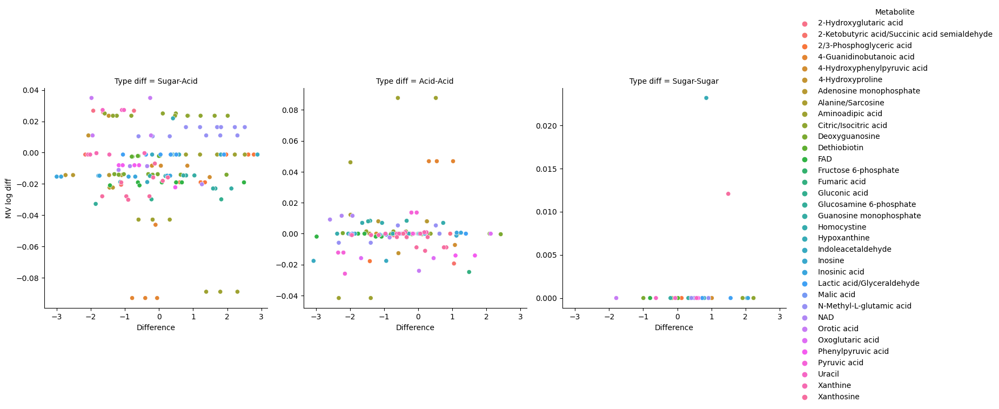

In [527]:
sidx = rttest_df.Strain ==  'Pseudomonadacae'#'Enterobacteriaceae'
# sidx = ttest_df.Strain ==  'Enterobacteriaceae'
pidx = rttest_df['P-value'] < 1
rttest_df.loc[:,'Size'] = 20 - 2*np.log10(ttest_df.loc[:,'P-value'])
nanidx = ~rttest_df['MV log diff'].isna()
sns.relplot(data = rttest_df.loc[pidx&sidx&nanidx,:], x = 'Difference', y = 'MV log diff', hue = 'Metabolite', col = 'Type diff', col_wrap= 3, facet_kws={'sharey': False, 'sharex': True})

# Compare Corrected Z-scores with metabolite values

In [528]:
dfu_met_values = np.zeros(len(dfu))
for i, row in dfu.iterrows():
    m_name = row['Metabolite']
    strain = row['Strain']
    # m_id = translate_dict[m_name]
    cs = row['Carbon_Source']
    try:
        # mv = metabolite_zscores[strain][m_name][cs]
        mv = metabolite_values[strain][m_name][cs]
    except KeyError:
        mv = np.nan
    dfu_met_values[i] = mv

dfu['Metabolite value'] = dfu_met_values
dfu['log(mv)'] = np.log10(dfu_met_values)
    
                      
                    

/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4096790698.py:15: RuntimeWarning: divide by zero encountered in log10
  dfu['log(mv)'] = np.log10(dfu_met_values)
/var/folders/h6/4b_zz_cd5d92w2ycp017ytn00000gp/T/ipykernel_3711/4096790698.py:15: RuntimeWarning: invalid value encountered in log10
  dfu['log(mv)'] = np.log10(dfu_met_values)


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


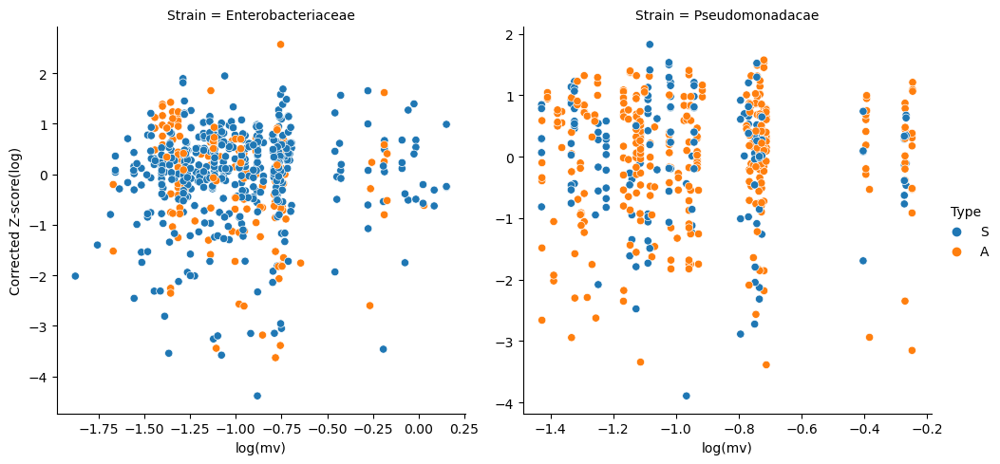

In [529]:
# nanidx = dfu[['Metabolite value', 'Corrected Z-score(log)']].isna().any(axis = 1)
# sidx = dfu.Strain == 'Enterobacteriaceae'
# sns.relplot(data = dfu, x = 'Metabolite value', y = 'Corrected Z-score(log)', hue = 'Carbon_Source', facet_kws={'sharey': False, 'sharex': False}, col = 'Strain')#col='Metabolite', col_wrap=4, 
sns.relplot(data = dfu, x = 'log(mv)', y = 'Corrected Z-score(log)', hue = 'Type', facet_kws={'sharey': False, 'sharex': False}, col = 'Strain')#col='Metabolite', col_wrap=4, 

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


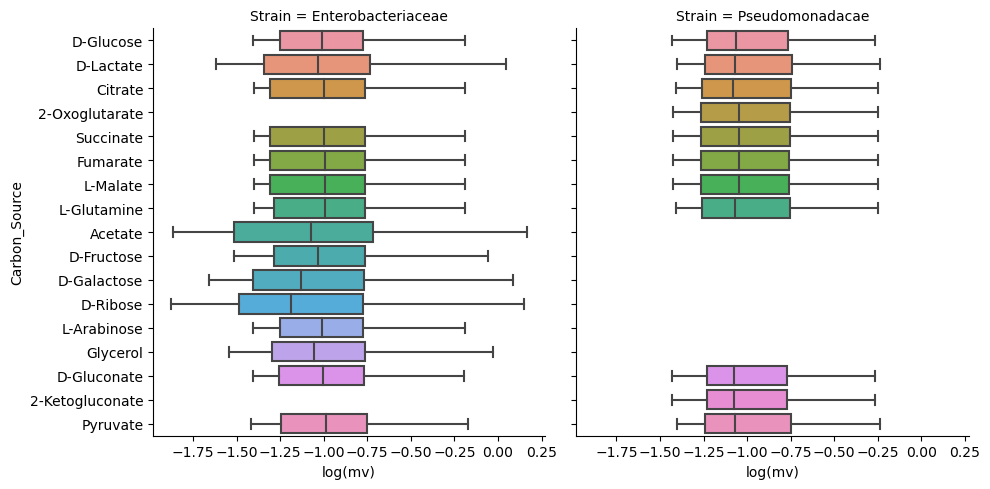

In [531]:
sns.catplot(data = dfu, col='Strain', x = 'log(mv)', kind = 'box', y = 'Carbon_Source')

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


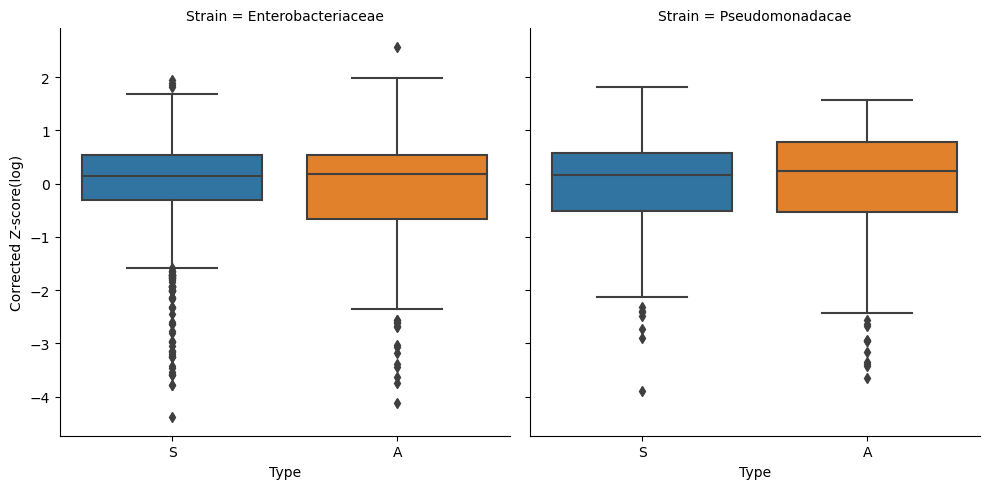

In [511]:
sns.catplot(data = dfu, col='Strain', y = 'Corrected Z-score(log)', x = 'Type', kind = 'box')

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


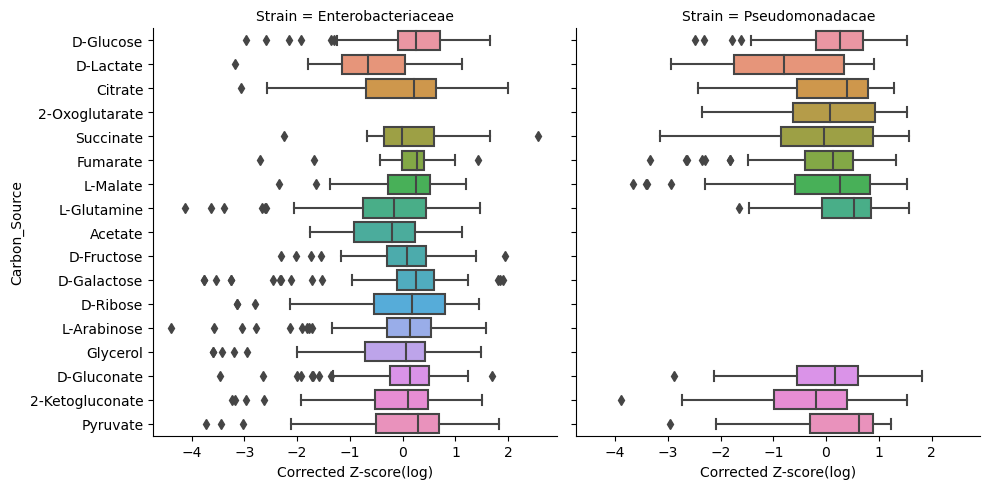

In [513]:
sns.catplot(data = dfu, col='Strain', x = 'Corrected Z-score(log)', y = 'Carbon_Source', kind = 'box')

In [532]:
tidx = dfu.Type == 'S'
all_x = dfu.loc[~nanidx&~sidx&tidx,'Metabolite value']
all_y = dfu.loc[~nanidx&~sidx&tidx,'Corrected Z-score(log)']
prho, ppval = st.pearsonr(all_x, all_y)
print(prho,ppval)
srho, spval = st.spearmanr(all_x, all_y)
print(srho,spval)

ValueError: array must not contain infs or NaNs

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


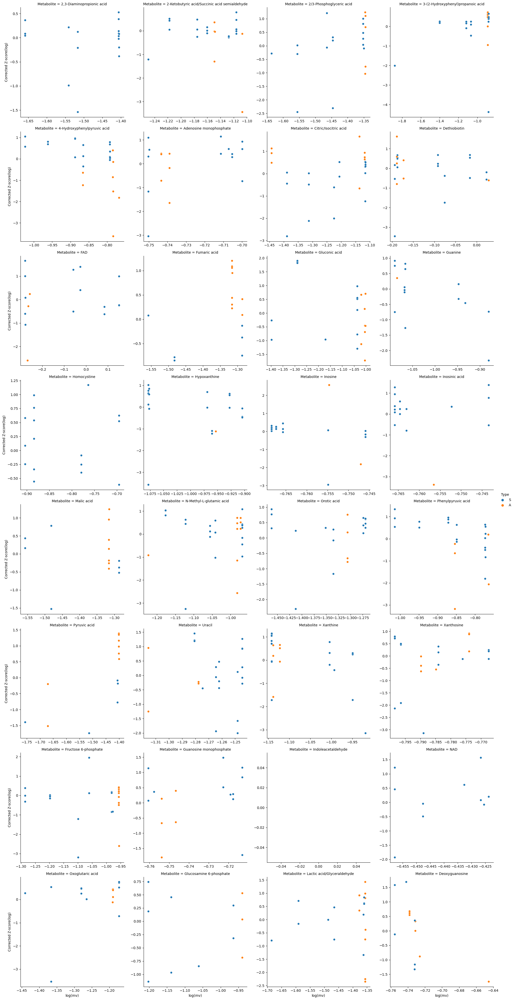

In [535]:
nanidx = dfu[['Metabolite value', 'Corrected Z-score(log)']].isna().any(axis = 1)
sidx = dfu.Strain == 'Enterobacteriaceae'
sns.relplot(data = dfu.loc[~nanidx&sidx,:], x = 'log(mv)', y = 'Corrected Z-score(log)', hue = 'Type', col='Metabolite', col_wrap=4, facet_kws={'sharey': False, 'sharex': False})#Metabolite value

/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


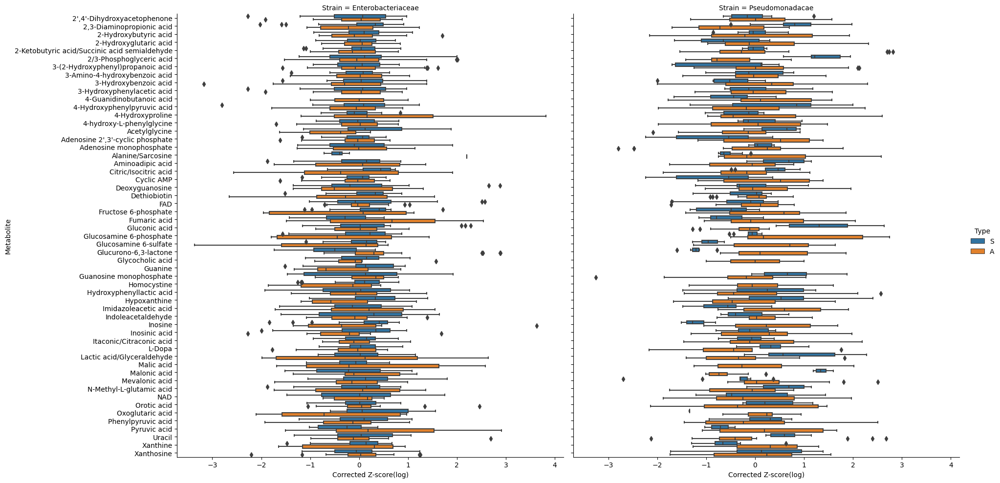

In [120]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# fig, ax = plt.subplots(1, figsize = (6, 18))
x = 'Corrected Z-score(log)'
y = 'Metabolite'
# order = [x for x in dfu.loc[sidx,'Metabolite'].unique()]
# sns.boxplot(data = dfu.loc[~sidx,:], x = x, y = y, hue = 'Type', ax = ax)#, order = order)
sns.catplot(data = dfu, x = x, y = y, hue = 'Type', col = "Strain", kind = 'box', height=10, aspect=1)#, order = order)

mannwhitney = []
for s in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        idxS = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='S')
        idxA = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='A')
        
        czsS = dfu.loc[idxS, 'Corrected Z-score(log)'].values
        czsA = dfu.loc[idxA, 'Corrected Z-score(log)'].values
        x_arr = []
        y_arr = []
        for x, y in zip(czsS, czsA):
            if np.isfinite(x) and np.isfinite(y):
                x_arr.append(x)
                y_arr.append(y)
        if len(x_arr) and len(y_arr):
            res = sp.stats.mannwhitneyu(x_arr, y_arr)
            mannwhitney.append([s, m, res.statistic, res.pvalue])
mwu_df = pd.DataFrame(mannwhitney, columns = ['Strain', 'Metabolite', 'Test statistic', 'p-value'])
# pairs = []
# for m in order:
#     m_pairs = []
#     for t in ['S', 'A']:
#         m_pairs.append((m, t))
#     pairs.append(m_pairs)
    

        
        
# annot = Annotator(ax, pairs, data=dfu.loc[sidx,:], x=y, y=x, order=order)
# # annot.new_plot(ax, pairs, data=df, x=x, y=y, order=order, hue=hue, hue_order=hue_order)
# annot.configure(test='Mann-Whitney', verbose=2)
# annot.apply_test()
# annot.annotate()

In [111]:
mwu_df.loc[mwu_df['p-value'] < 0.01, :]

,Strain,Metabolite,Test statistic,p-value
27,Enterobacteriaceae,"Glucurono-6,3-lactone",81.0,0.000021
33,Enterobacteriaceae,Hypoxanthine,347.0,0.001526
36,Enterobacteriaceae,Inosine,244.0,0.009922
37,Enterobacteriaceae,Inosinic acid,118.0,0.008616
57,Pseudomonadacae,2/3-Phosphoglyceric acid,81.0,0.000412
66,Pseudomonadacae,Acetylglycine,57.0,0.006993
78,Pseudomonadacae,Gluconic acid,36.0,0.002165
81,Pseudomonadacae,"Glucurono-6,3-lactone",0.0,0.000583
84,Pseudomonadacae,Hypoxanthine,46.0,0.004079
90,Pseudomonadacae,Lactic acid/Glyceraldehyde,35.0,0.004329


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


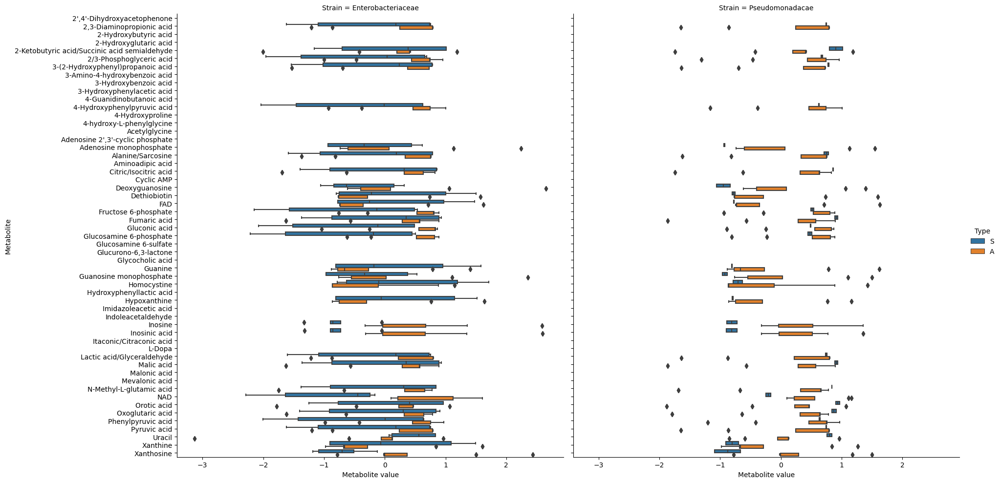

In [123]:
sidx = dfu.Strain == 'Enterobacteriaceae'
# fig, ax = plt.subplots(1, figsize = (6, 18))
xkey = 'Metabolite value'
ykey = 'Metabolite'
# order = [x for x in dfu.loc[sidx,'Metabolite'].unique()]
# sns.boxplot(data = dfu.loc[~sidx,:], x = xkey, y = ykey, hue = 'Type', ax = ax)#, order = order)
sns.catplot(data = dfu, x = xkey, y = ykey, hue = 'Type', col = "Strain", kind = 'box', height=10, aspect=1)#, order = order)


mannwhitney = []
for s in dfu.Strain.unique():
    for m in dfu.Metabolite.unique():
        idxS = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='S')
        idxA = (dfu.Strain == s) & (dfu.Metabolite == m) & (dfu.Type=='A')
        
        czsS = dfu.loc[idxS, xkey].values
        czsA = dfu.loc[idxA, xkey].values
        x_arr = []
        y_arr = []
        for x, y in zip(czsS, czsA):
            if np.isfinite(x) and np.isfinite(y):
                x_arr.append(x)
                y_arr.append(y)
        if len(x_arr) and len(y_arr):
            res = sp.stats.mannwhitneyu(x_arr, y_arr)
            mannwhitney.append([s, m, res.statistic, res.pvalue])
mwu_df2 = pd.DataFrame(mannwhitney, columns = ['Strain', 'Metabolite', 'Test statistic', 'p-value'])
# pairs = []
# for m in order:
#     m_pairs = []
#     for t in ['S', 'A']:
#         m_pairs.append((m, t))
#     pairs.append(m_pairs)
    

        
        
# annot = Annotator(ax, pairs, data=dfu.loc[sidx,:], x=y, y=x, order=order)
# # annot.new_plot(ax, pairs, data=df, x=x, y=y, order=order, hue=hue, hue_order=hue_order)
# annot.configure(test='Mann-Whitney', verbose=2)
# annot.apply_test()
# annot.annotate()

In [110]:
mwu_df2.loc[mwu_df2['p-value'] < 0.01, :]

,Strain,Metabolite,Test statistic,p-value
2,Enterobacteriaceae,2/3-Phosphoglyceric acid,63.0,1.771576e-03
4,Enterobacteriaceae,4-Hydroxyphenylpyruvic acid,63.0,1.771576e-03
11,Enterobacteriaceae,Fructose 6-phosphate,63.0,1.771576e-03
13,Enterobacteriaceae,Gluconic acid,63.0,1.771576e-03
14,Enterobacteriaceae,Glucosamine 6-phosphate,54.0,6.455820e-04
17,Enterobacteriaceae,Homocystine,252.0,4.505109e-03
19,Enterobacteriaceae,Inosine,9.0,1.299313e-06
20,Enterobacteriaceae,Inosinic acid,9.0,1.299313e-06
24,Enterobacteriaceae,NAD,0.0,2.967649e-07
27,Enterobacteriaceae,Phenylpyruvic acid,63.0,1.771576e-03


<Axes: xlabel='Metabolite value', ylabel='Metabolite'>

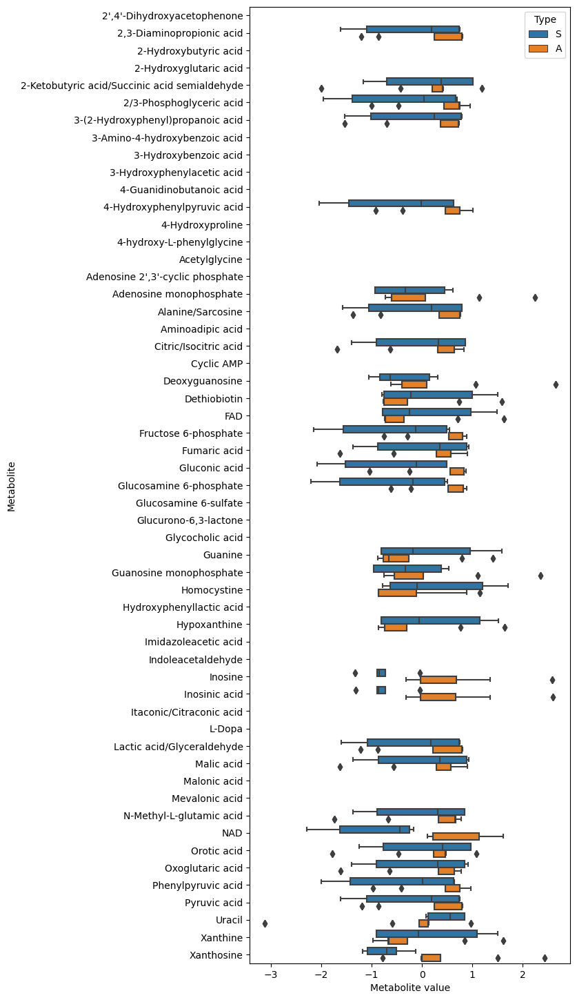

In [53]:
sidx = dfu.Strain == 'Enterobacteriaceae'
fig, ax = plt.subplots(1, figsize = (6,18))
sns.boxplot(data = dfu.loc[sidx,:], x = 'Metabolite value', y = 'Metabolite', hue = 'Type', ax = ax)

In [762]:
# sidx = ttest_df.Strain == 'Enterobacteriaceae'
# ttest_df.loc[idx, 

In [ ]:
# change_idx = ttest_df.Outcome != 0

In [668]:
# sidx = dfu.Strain == 'Enterobacteriaceae'
# metabolites = dfu.Metabolite.unique()
# key = 'Peak_Intensity'
# for s in dfu.Strain.unique():
#     sidx = dfu.Strain == s
#     for m in metabolites:
#         # Normalize both plates together?
#         idx = (dfu.Metabolite == m)&sidx
#         dfu.loc[idx, 'Max-scaled'] = dfu.loc[idx, key]/np.max(dfu.loc[idx, key])
#         # dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()

In [494]:
# s = 'Enterobacteriaceae'
# idx = (dfu.Metabolite == metabolites[0]) & (dfu.Strain == s)
# sns.catplot(data = dfu.loc[idx,:], y = 'Carbon_Source', x = key, jitter = False)

In [757]:
change_idx = ttest_df.Outcome != 0

In [759]:
change_idx.sum(), len(change_idx)

(4282, 21560)

In [750]:
ttest_pval_arr[np.isnan(ttest_pval_arr)] = 1

<Axes: >

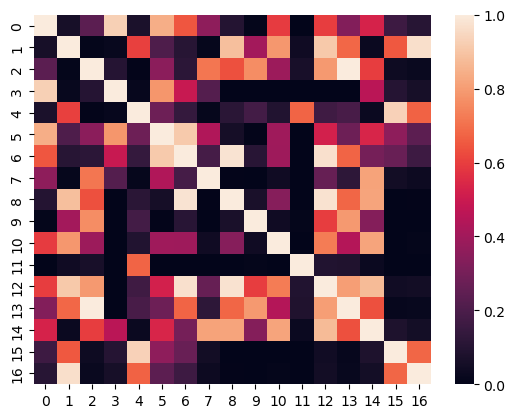

In [495]:
sns.heatmap(ttest_pval_arr)

In [497]:
# fig, ax = plt.subplots(1, figsize = (12,10))
# s = 'Enterobacteriaceae'
# sns.stripplot(data=dfum.loc[dfum.Strain==s,:], y="Metabolite", x="Max-scaled",hue = 'Carbon_Source', ax = ax)#
# plt.grid()
# plt.legend(loc = 3, )

In [680]:
# sns.violinplot(data=dfum.loc[dfu.Strain==s,:], x="Metabolite", y="Z-score", ax = ax)


In [628]:
metabolites = dfu.Metabolite.unique()
key = 'Peak_Intensity'
for m in metabolites:
    # Normalize both plates together?
    idx = dfu.Metabolite == m
    dfu.loc[idx, 'Z-score'] = (dfu.loc[idx, key]-dfu.loc[idx, key].mean())/dfu.loc[idx, key].std()

In [498]:
idx = dfu.Strain == 'Enterobacteriaceae'
# idx = dfu.Strain == 'Pseudomonadacae'
dfu0 = dfu.loc[idx, :]#['Carbon_Source', 'Metabolite','Peak_Intensity']].groupby(['Carbon_Source', 'Metabolite']).mean().reset_index()
# temp = dfu0.loc[~dfu0.isna().any(axis = 1),:]


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))


<Axes: xlabel='Corrected Z-score(log)', ylabel='Metabolite'>

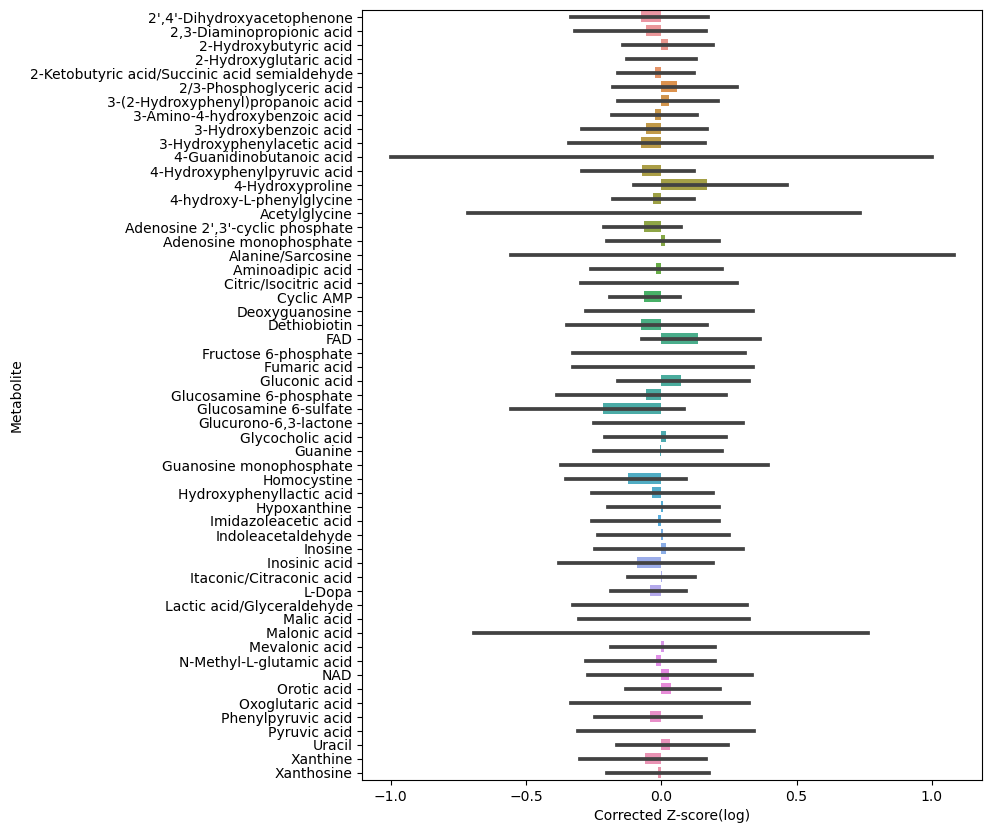

In [501]:
fig, ax = plt.subplots(1, figsize = (8,10))
sns.barplot(data = dfu0, y='Metabolite', x = 'Corrected Z-score(log)')


2',4'-Dihydroxyacetophenone


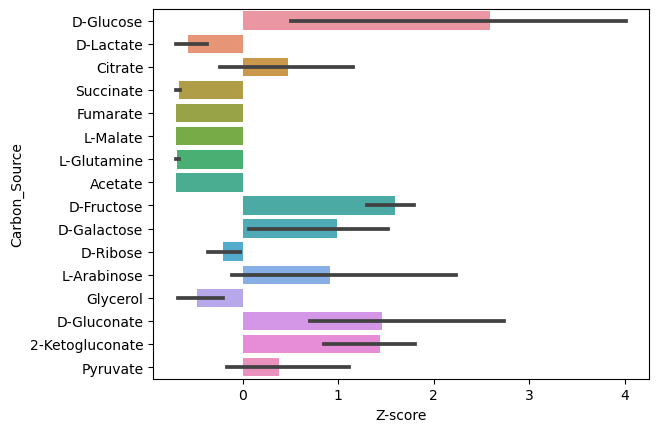

2,3-Diaminopropionic acid


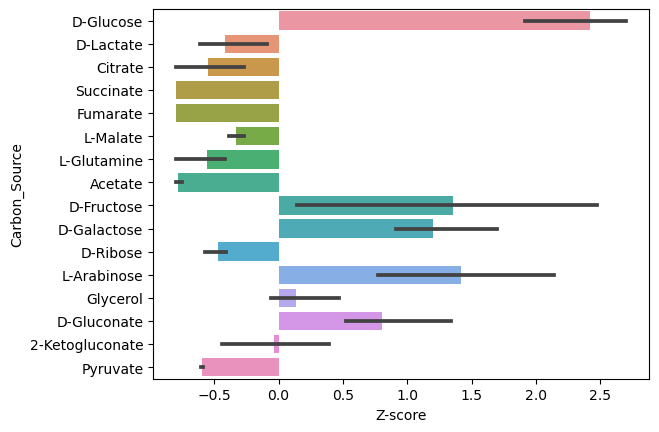

2-Hydroxybutyric acid


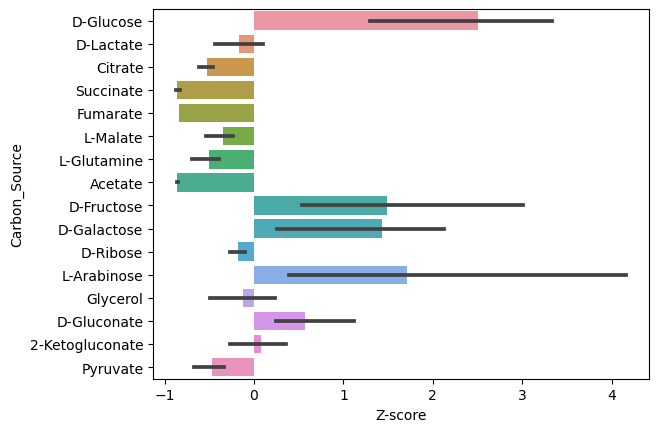

2-Hydroxyglutaric acid


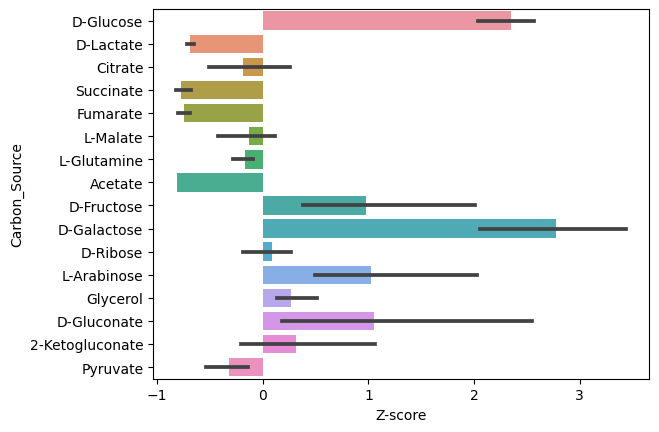

2-Ketobutyric acid/Succinic acid semialdehyde


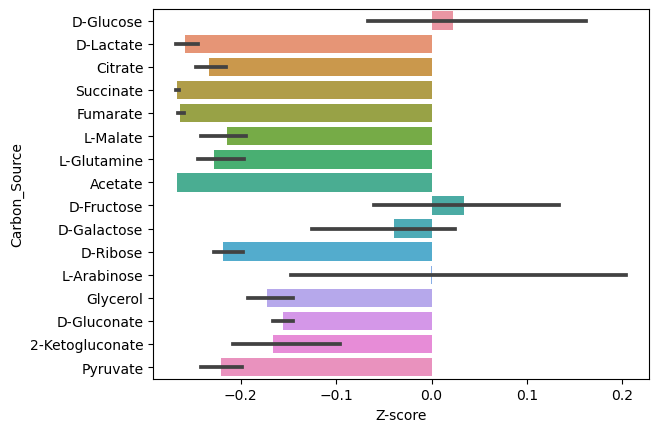

2/3-Phosphoglyceric acid


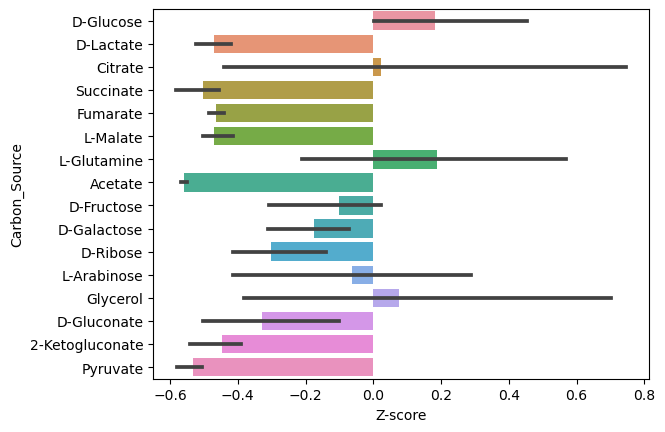

3-(2-Hydroxyphenyl)propanoic acid


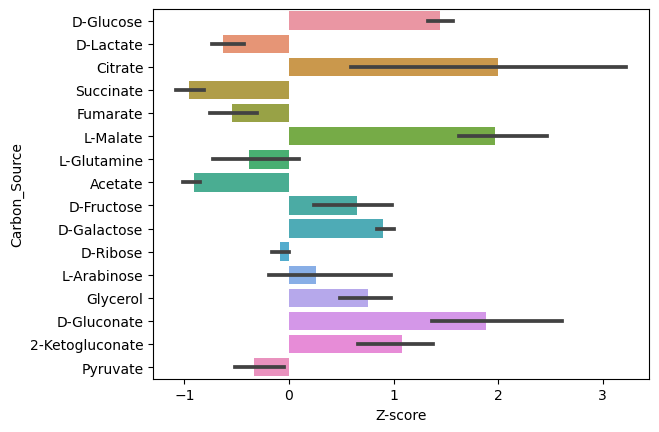

3-Amino-4-hydroxybenzoic acid


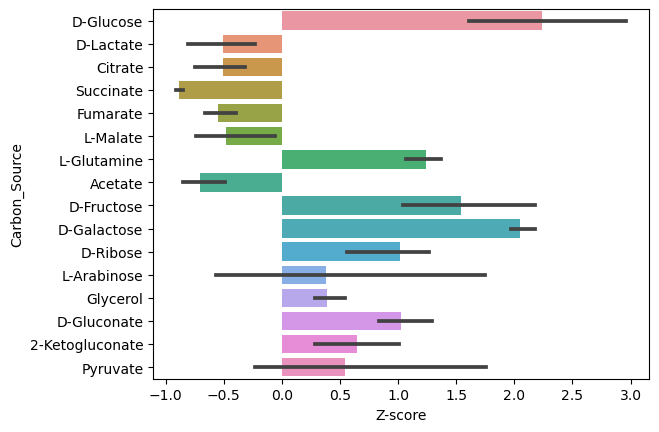

3-Hydroxybenzoic acid


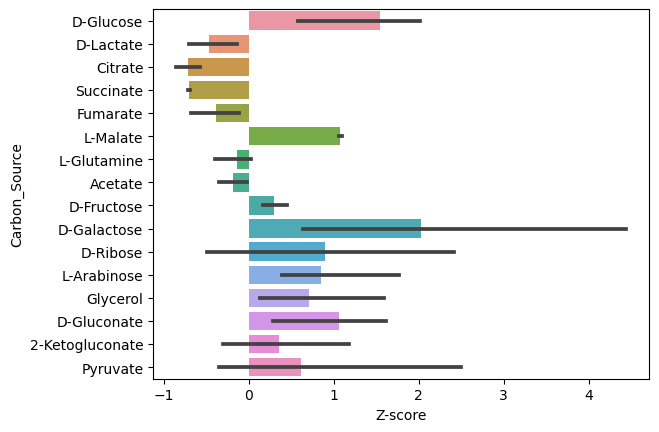

3-Hydroxyphenylacetic acid


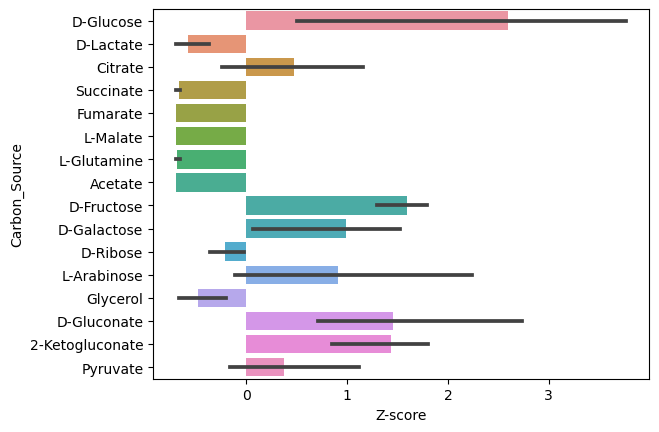

4-Guanidinobutanoic acid


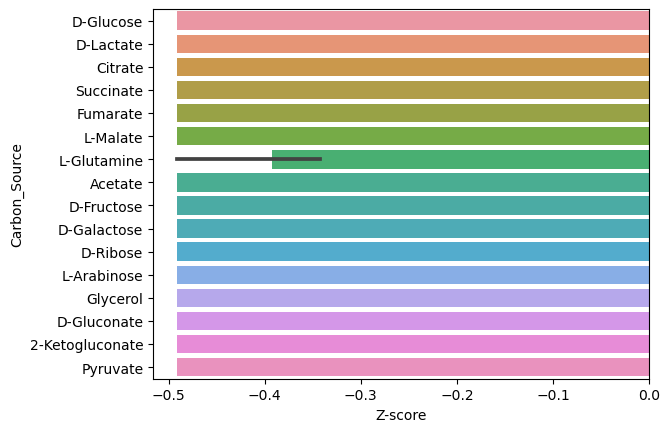

4-Hydroxyphenylpyruvic acid


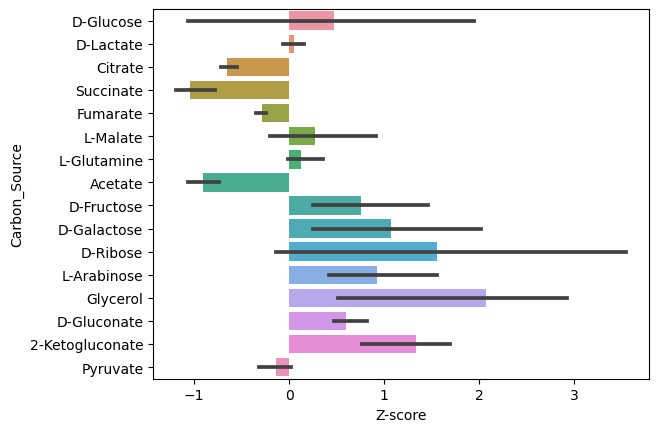

4-Hydroxyproline


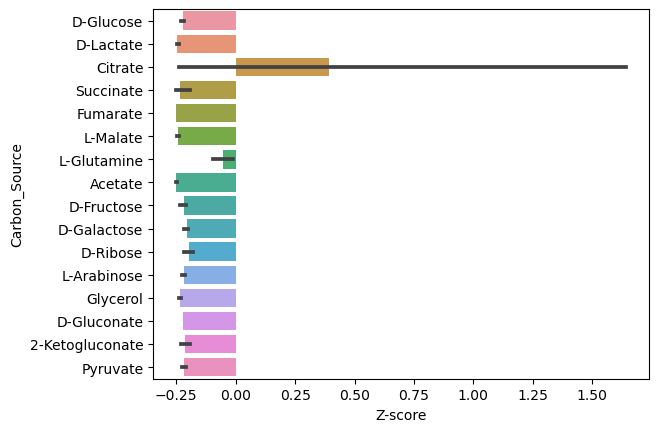

4-hydroxy-L-phenylglycine


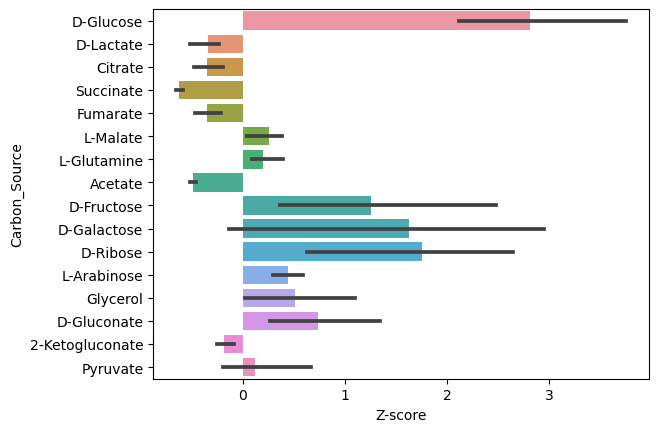

Acetylglycine


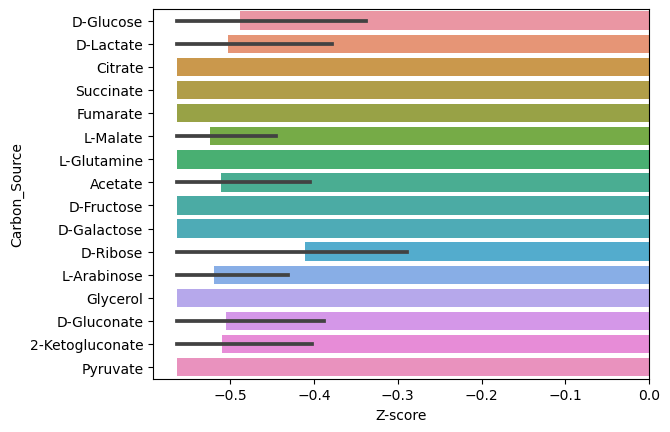

Adenosine 2',3'-cyclic phosphate


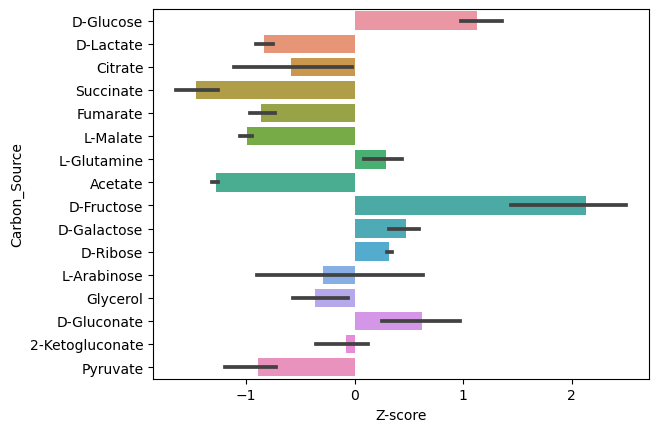

Adenosine monophosphate


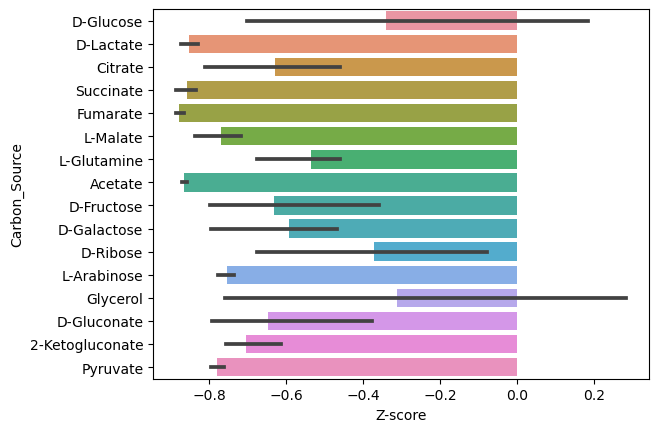

Alanine/Sarcosine


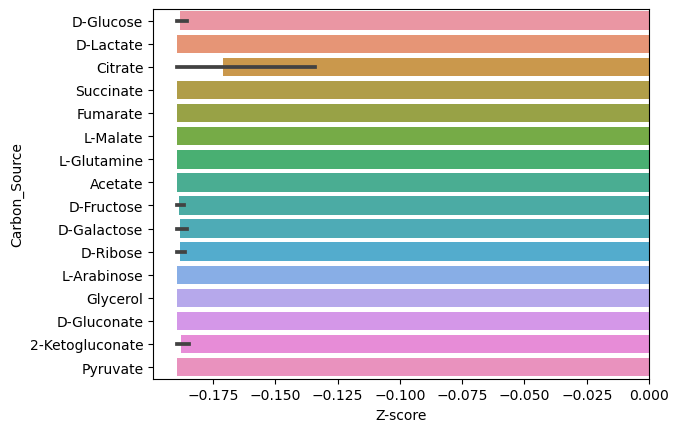

Aminoadipic acid


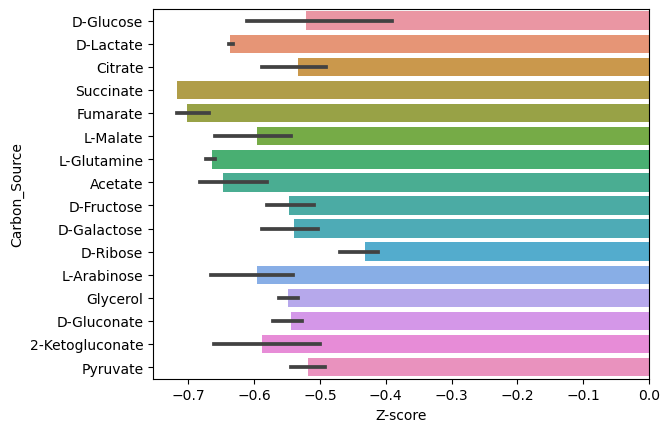

Citric/Isocitric acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


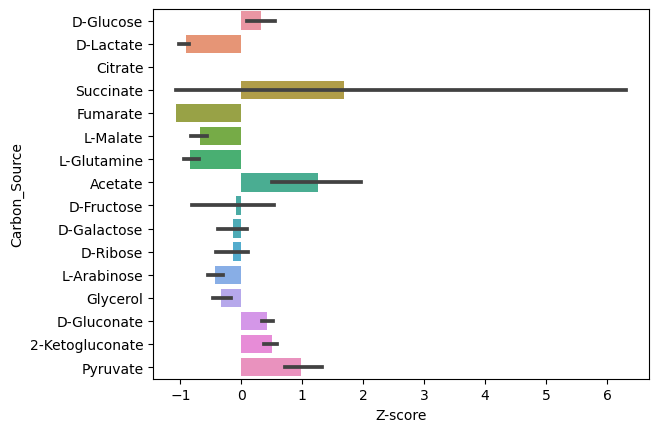

Cyclic AMP


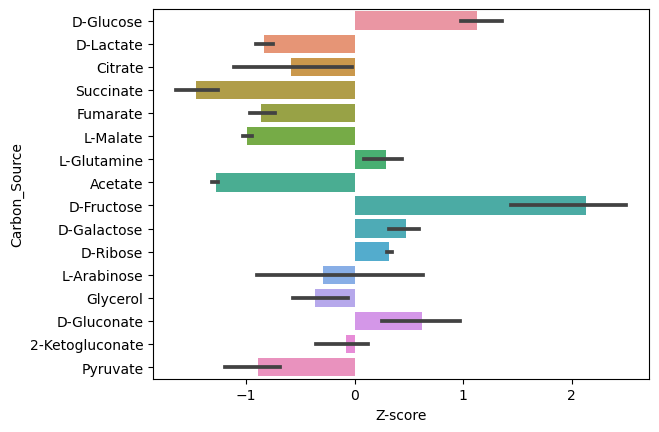

Deoxyguanosine


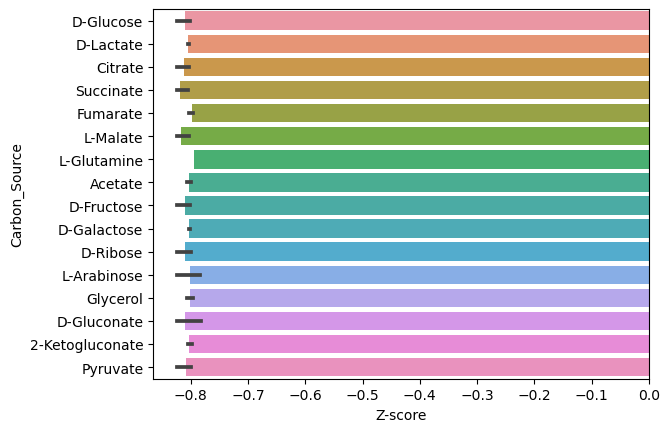

Dethiobiotin


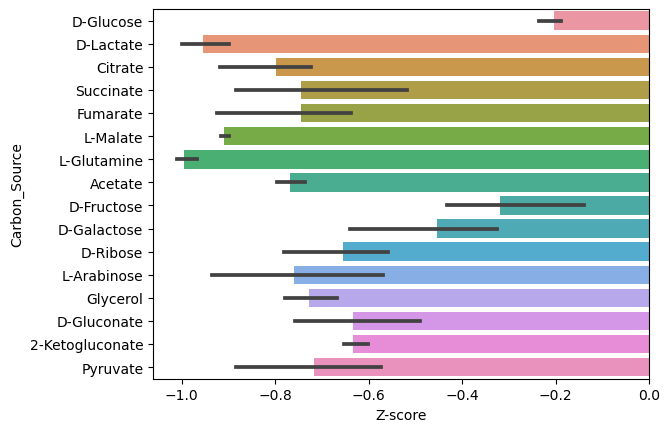

FAD


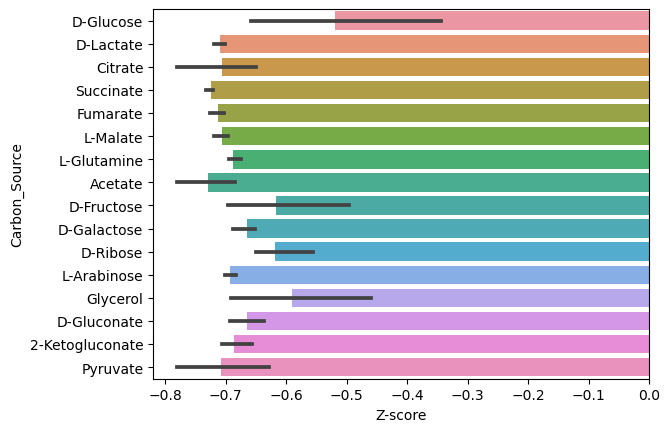

Fructose 6-phosphate


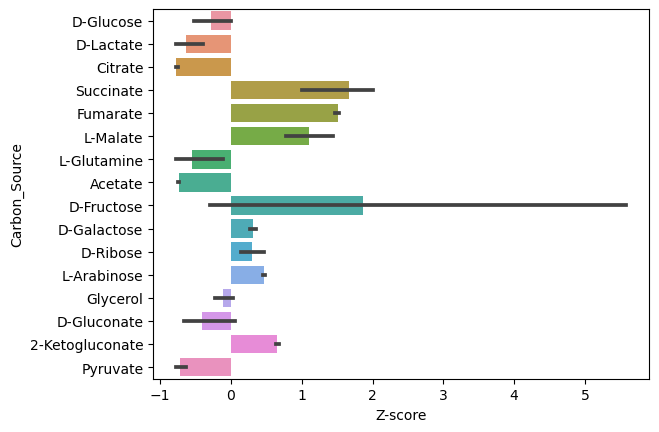

Fumaric acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


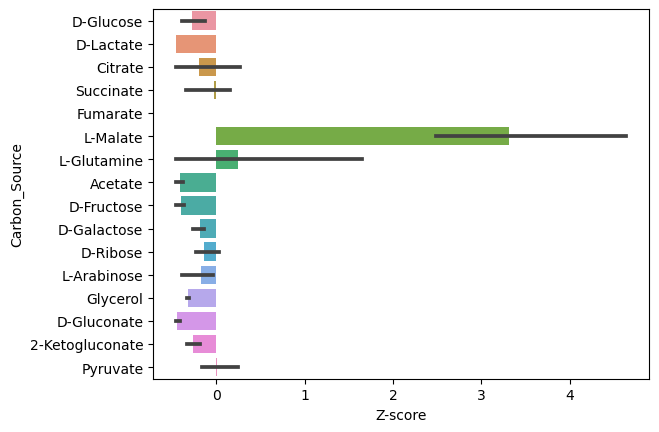

Gluconic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


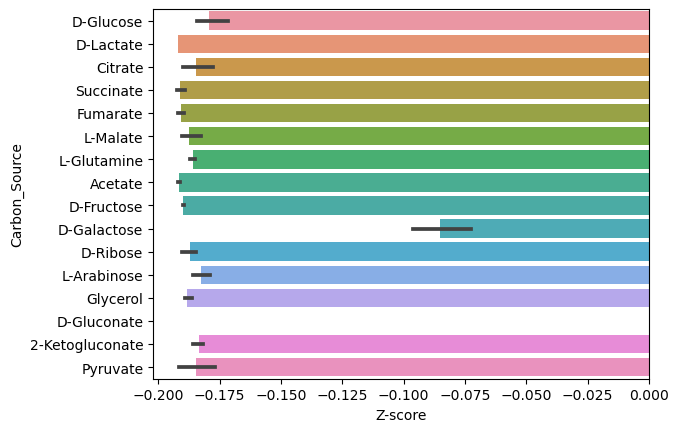

Glucosamine 6-phosphate


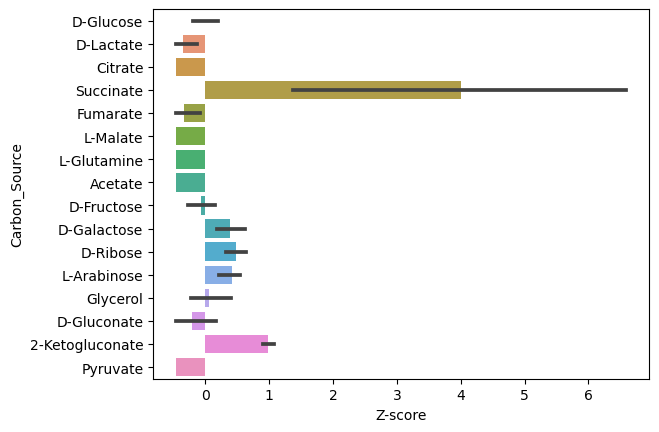

Glucosamine 6-sulfate


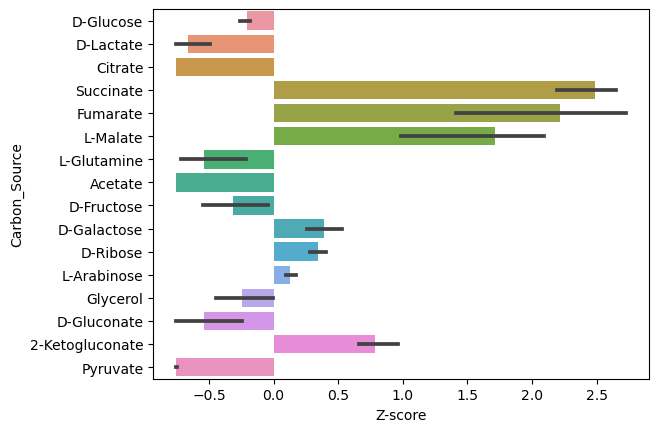

Glucurono-6,3-lactone


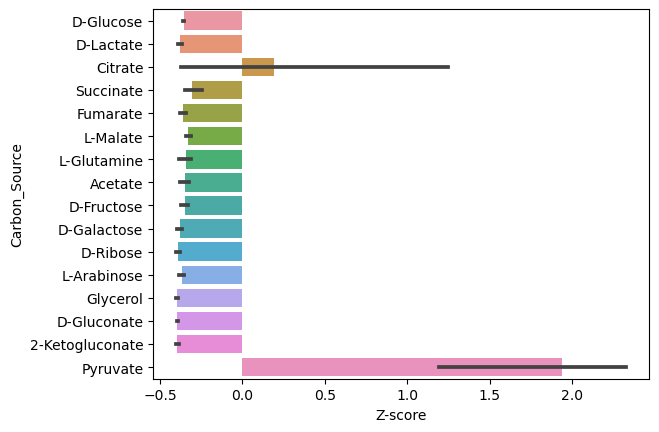

Glycocholic acid


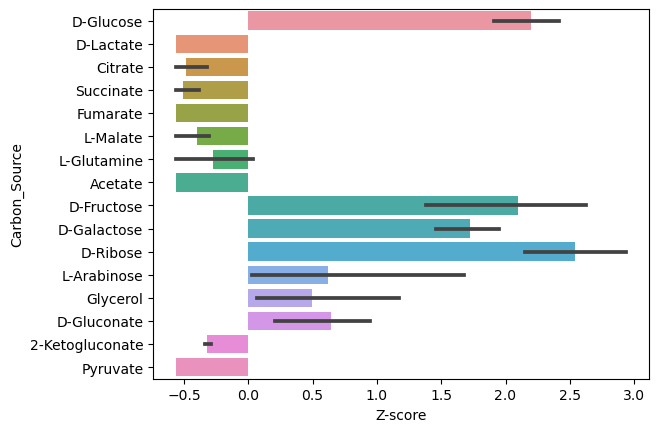

Guanine


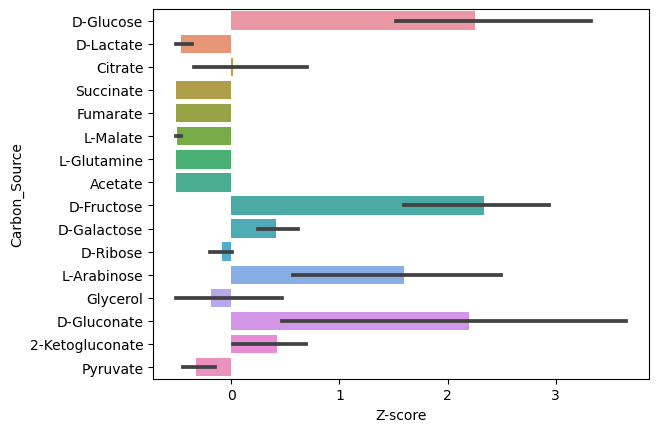

Guanosine monophosphate


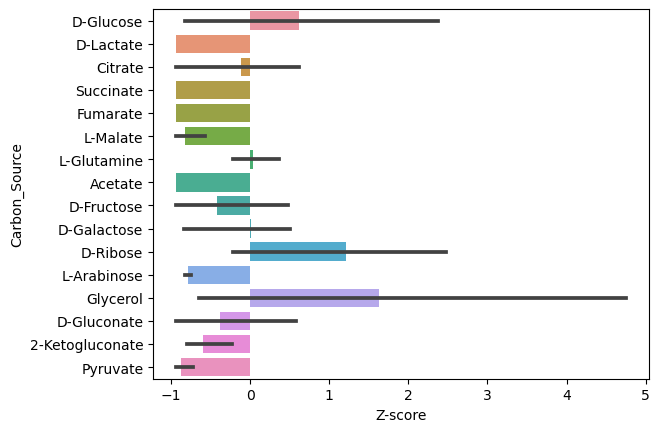

Homocystine


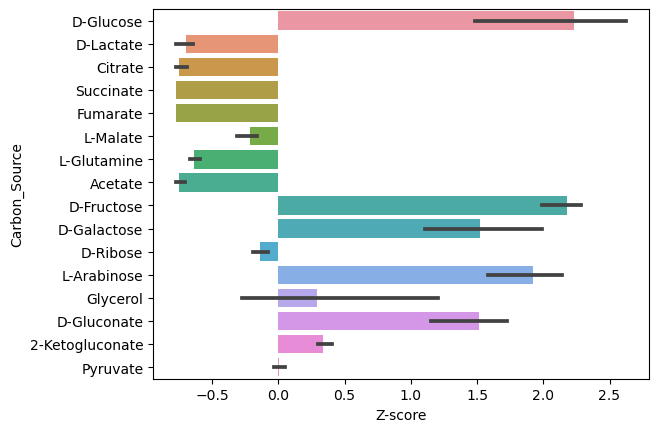

Hydroxyphenyllactic acid


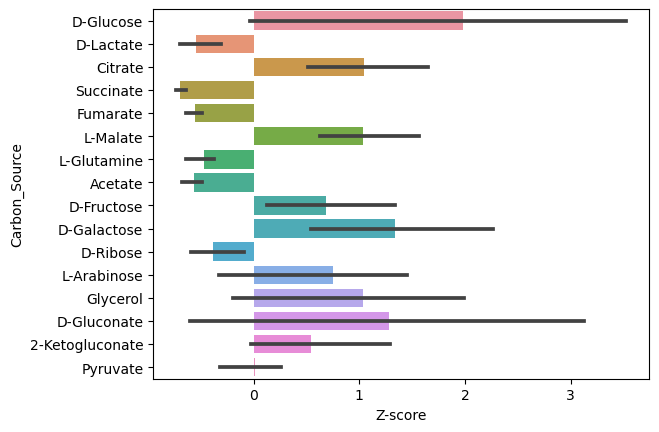

Hypoxanthine


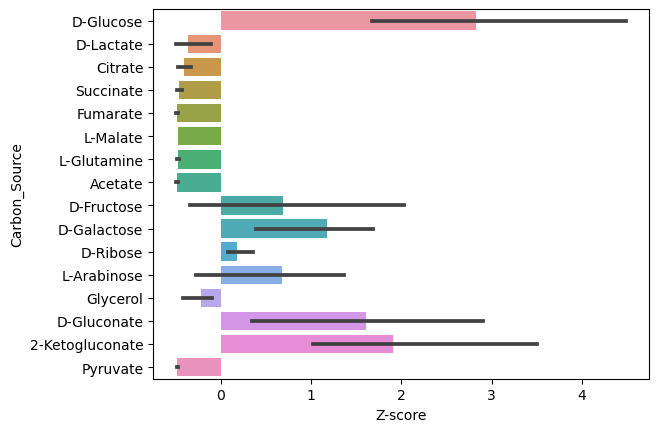

Imidazoleacetic acid


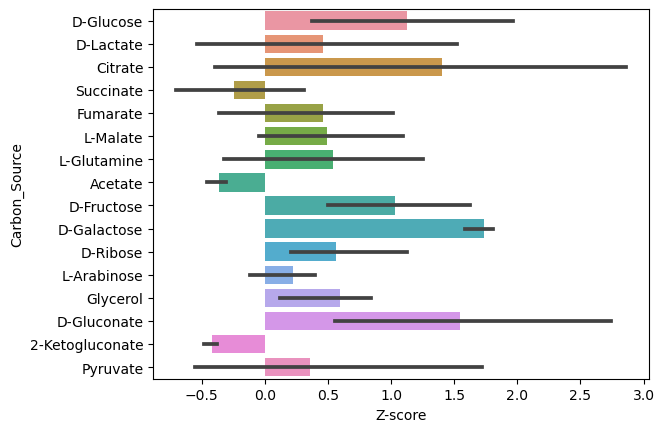

Indoleacetaldehyde


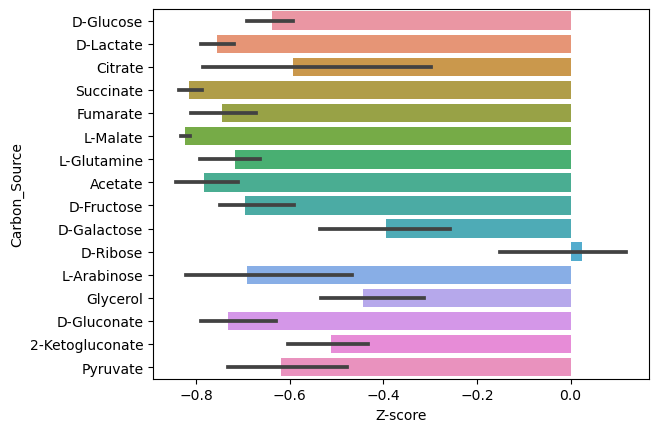

Inosine


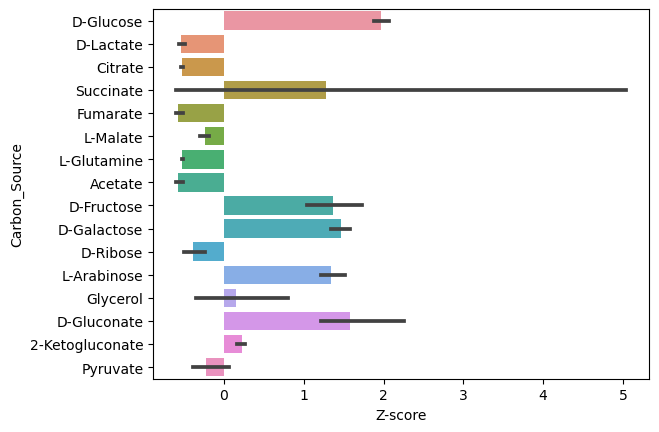

Inosinic acid


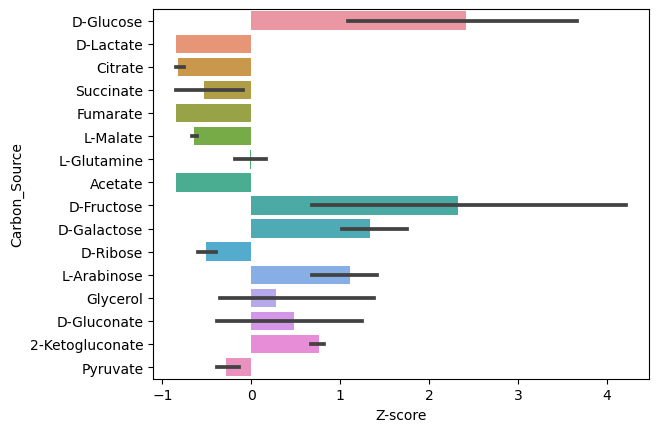

Itaconic/Citraconic acid


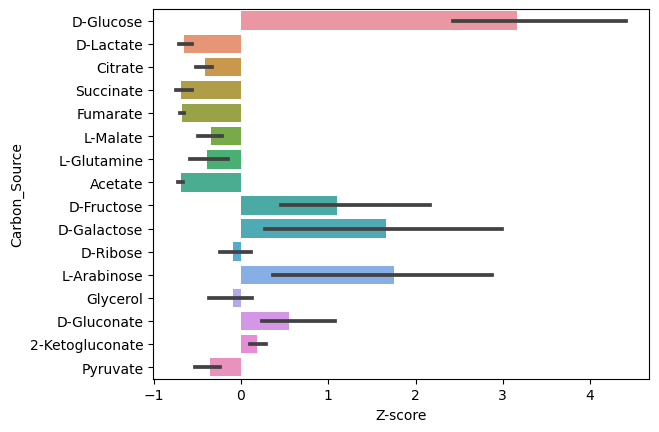

L-Dopa


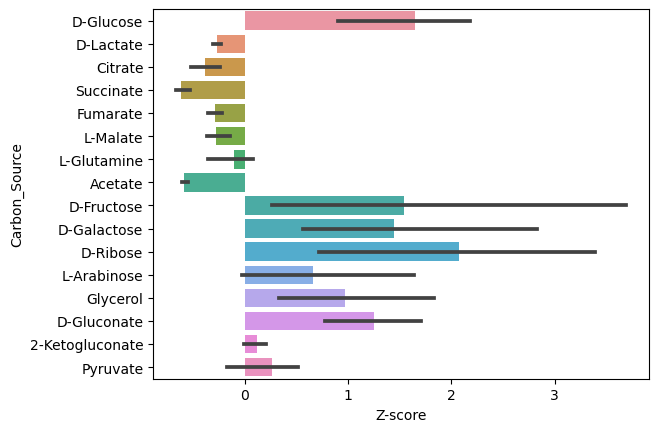

Lactic acid/Glyceraldehyde


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


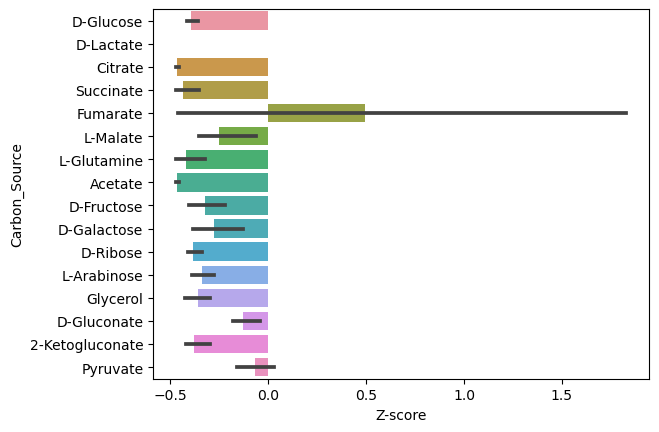

Malic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


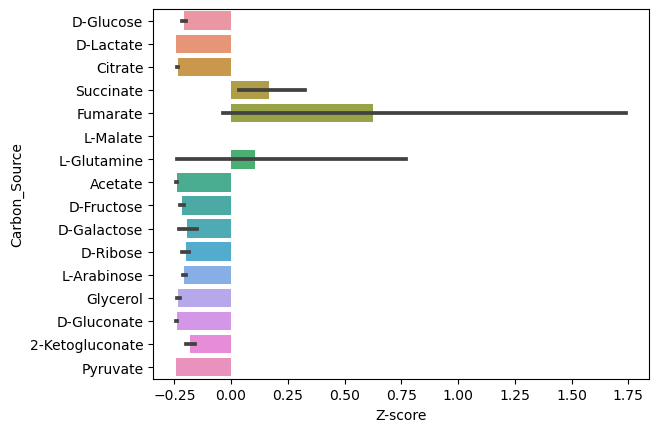

Malonic acid


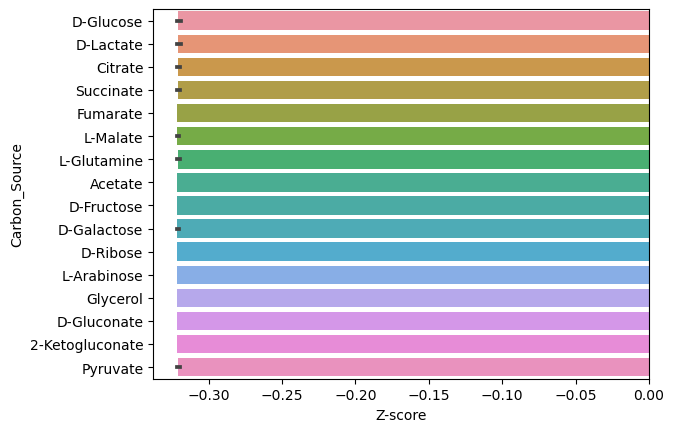

Mevalonic acid


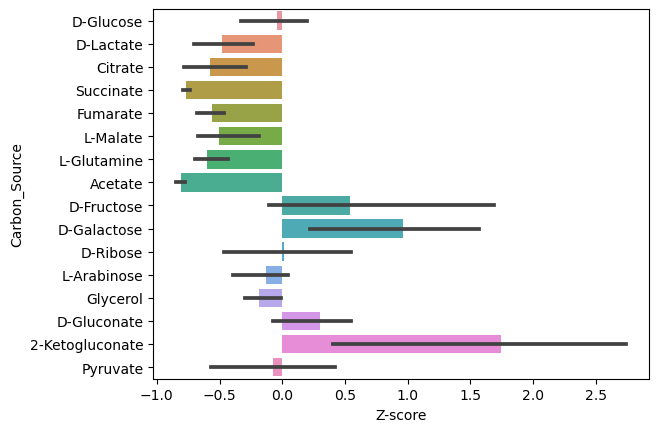

N-Methyl-L-glutamic acid


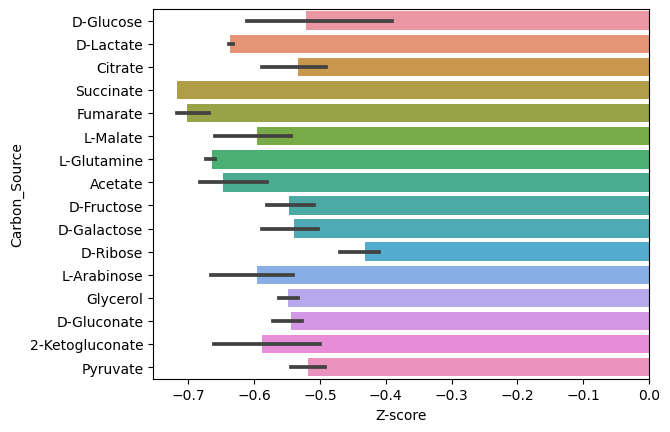

NAD


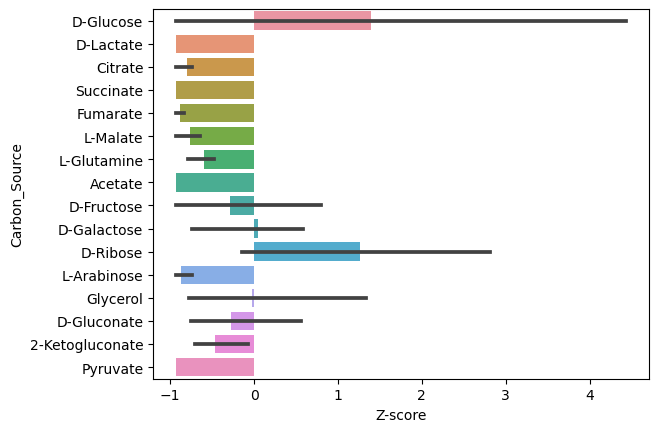

Orotic acid


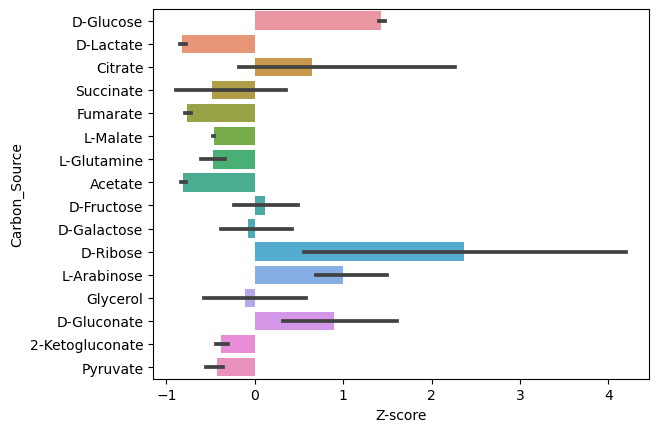

Oxoglutaric acid


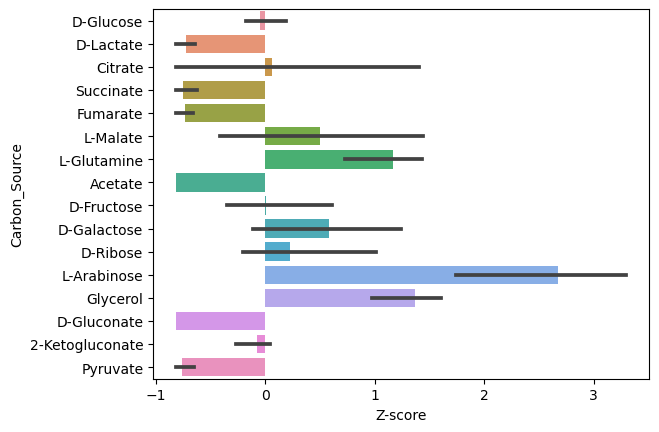

Phenylpyruvic acid


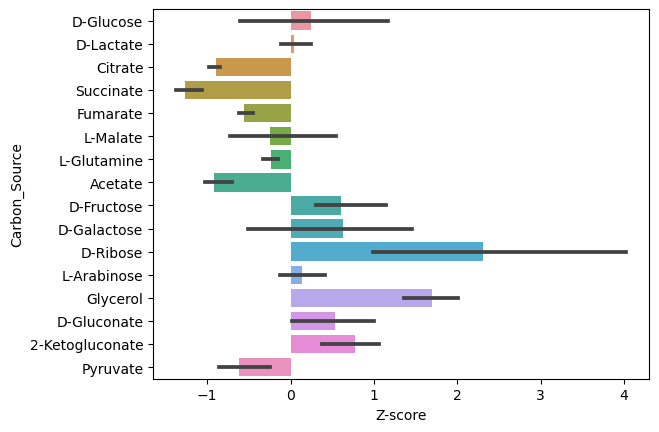

Pyruvic acid


/Users/ssulheim/anaconda3/lib/python3.11/site-packages/seaborn/algorithms.py:98: RuntimeWarning: Mean of empty slice
  boot_dist.append(f(*sample, **func_kwargs))
/Users/ssulheim/anaconda3/lib/python3.11/site-packages/numpy/lib/nanfunctions.py:1556: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


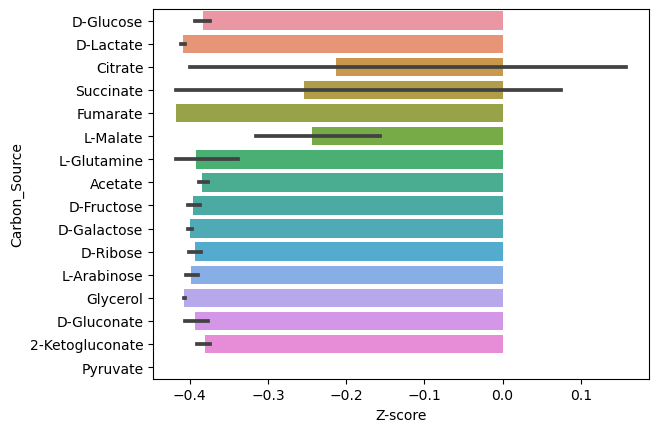

Uracil


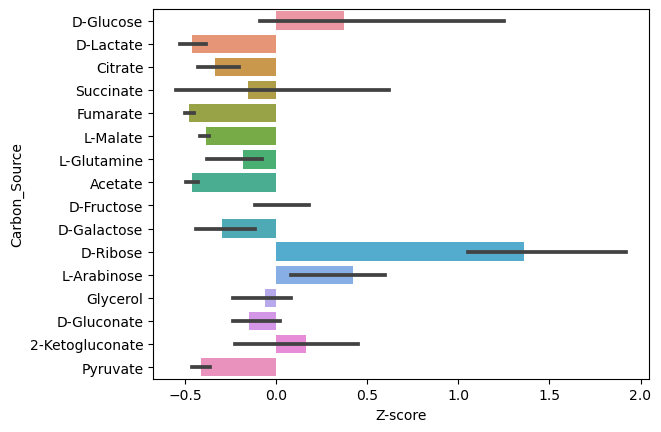

Xanthine


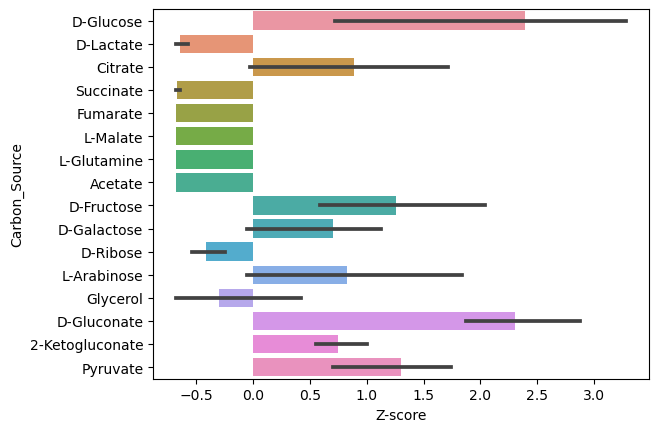

Xanthosine


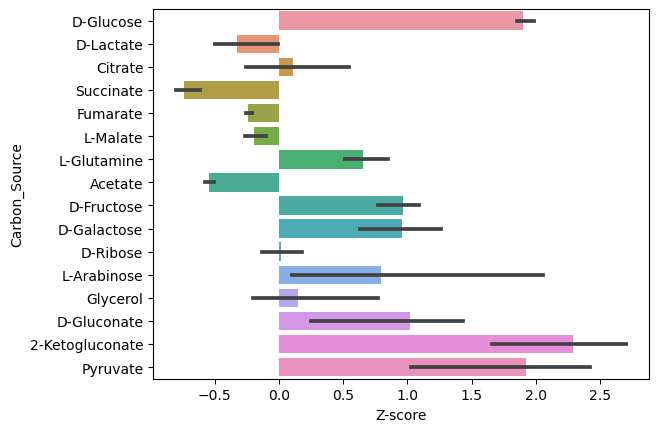

In [502]:
m = metabolites[0]
for m in metabolites:
    idx = dfu0.Metabolite == m
    print(m)
    sns.barplot(dfu0.loc[idx,:], x = 'Z-score', y = 'Carbon_Source')
    plt.show()

In [590]:
result = dfu0.pivot(index=['Metabolite'], columns='Carbon_Source', values='Peak_Intensity').T

In [554]:
# result = result.loc[:,~result.isna().any(axis=0)] 
mask = result.isna()
# result.fillna(0, inplace=True)
result[result == -np.inf] = np.nan

In [555]:
resultN = (result-np.nanmean(result, axis = 0))/np.nanstd(result, axis = 0)

In [556]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,1.084062,-0.163698,-0.101302,0.003737,-0.004557,-0.779796,0.639184,0.186047,-0.095512,1.084062,...,2.738917,-0.062754,-0.129528,-0.540880,-0.197217,0.683780,-0.249547,0.504649,0.369533,1.950084
Acetate,-0.990420,-0.940725,-1.027411,-1.080151,-0.971273,-1.213305,-1.345366,-1.206004,-0.782632,-0.990420,...,-1.108929,-0.886832,-0.777513,-1.031678,-0.986320,-1.143785,-0.302627,-0.858755,-0.982009,-1.215820
Citrate,0.149919,-0.700911,-0.697773,-0.477456,-0.650894,1.052611,1.548147,-0.998580,-1.451960,0.149919,...,-0.756727,0.676112,-0.592110,0.610038,-0.057574,-1.123126,2.327684,-0.585401,0.503953,-0.489997
D-Fructose,1.234588,1.278289,1.290932,0.634215,1.915383,0.566786,0.201599,1.107124,-0.172040,1.234588,...,0.922546,0.484829,0.131195,0.014315,-0.116901,0.506558,-0.477127,0.136894,0.853240,0.466099
D-Galactose,0.645832,1.112152,1.234724,2.360135,1.213949,0.278232,0.452703,1.629736,2.034583,0.645832,...,1.553934,0.602486,0.583702,-0.207100,0.491059,0.527717,-0.551393,-0.500039,0.333594,0.463772
D-Gluconate,1.104784,0.701518,0.382217,0.708699,0.093186,-0.322311,1.441059,0.578647,0.808091,1.104784,...,0.562584,0.537865,0.133047,0.888875,-0.986320,0.428901,-0.452884,-0.175964,1.850044,0.527356
D-Glucose,2.207946,2.373666,2.298829,1.953064,1.800165,1.674947,0.994824,1.826229,1.415389,2.207946,...,0.048943,0.838811,2.464078,1.494866,-0.175437,0.113034,-0.294973,0.956022,1.930357,1.514813
D-Lactate,-0.868249,-0.558648,-0.343160,-0.963015,-0.896196,-0.875436,-1.072803,-1.001156,-1.132036,-0.868249,...,-0.610920,-0.723353,-0.777513,-1.043658,-0.889909,-0.106834,-0.677901,-0.861352,-0.948581,-0.978988
D-Ribose,-0.511766,-0.614242,-0.353029,-0.221432,-0.506457,-0.217402,-0.523914,0.565341,0.597469,-0.511766,...,0.129344,2.077376,2.271682,2.549710,0.121042,2.343833,-0.456538,3.106146,-0.732333,-0.591316


In [ ]:
sns.clustermap(resultN.T,cmap='RdBu', vmin = -2, vmax = 2)#, mask = mask.T)

In [525]:
dfu.Carbon_Source.unique()

array(['D-Glucose', 'D-Lactate', 'Citrate', '2-Oxoglutarate', 'Succinate',
       'Fumarate', 'L-Malate', 'L-Glutamine', 'Acetate', 'D-Fructose',
       'D-Galactose', 'D-Ribose', 'L-Arabinose', 'Glycerol',
       'D-Gluconate', '2-Ketogluconate', 'Pyruvate'], dtype=object)

# Compare variations in shadow price versus variation in leakage rates
## ToDo: Mantel test https://en.wikipedia.org/wiki/Mantel_test

In [526]:
mets = [m for m in model.metabolites if m.compartment == 'c']
matches = []
for name in dfu.Metabolite.unique():
    name_at = name.replace("ic acid", 'ate')
    scores = []
    suggestions = []
    for m in mets:
        score1 = fuzz.ratio(name.lower(),m.name.lower())
        score2 = fuzz.ratio(name_at.lower(),m.name.lower())
        score = max(score1, score2)
        # pscore = fuzz.partial_ratio(name.lower(),m.name.lower())
        if score > 80:
            scores.append(score)
            suggestions.append(m)
            # print(name, mname, score, pscore)
        # elif pscore > 90 and score > 70:
        #     print(name, mname, score, pscore)
    if len(scores):
        # print(scores, suggestions, np.argmax(scores))
        match = suggestions[np.argmax(scores)]
        # print(name, match.name, match.id, scores[np.argmax(scores)])
        matches.append([name, match.name, match.id.rstrip('_c'), scores[np.argmax(scores)]])
    else:
        matches.append([name, None, None, None])
    #     print(name, ' No match')
dfmatch = pd.DataFrame(matches, columns = ['Untargeted MS name', 'Metabolite name', 'Metabolite ID', 'Score'])          

In [527]:
fnm = folder / 'ms_name_to_id.csv'
dfmatch.to_csv(fnm)

In [528]:
fnmc = folder / 'ms_name_to_id_curated.csv'
dfmc = pd.read_csv(fnmc, index_col = 0)

In [529]:
translate_dict = dfmc[['Untargeted MS name', 'Metabolite ID']].set_index('Untargeted MS name').to_dict()['Metabolite ID']

# Now try to predict

In [530]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,0.777026,0.213653,0.422005,0.466917,0.520545,-0.664645,0.729209,0.481948,0.240732,0.777026,...,1.694019,0.102866,0.104902,-0.146369,0.201679,0.755766,0.084276,0.863745,0.749420,1.264449
Acetate,NaN,-2.639961,-2.003680,-2.362717,-1.974295,-1.630393,-1.855653,-1.352748,-0.454331,NaN,...,-2.114373,-0.803865,NaN,-1.808186,NaN,-1.214920,-0.018195,-1.367994,-1.644358,-1.417786
Citrate,0.424219,-0.633157,-0.195415,0.077789,-0.127000,1.057006,1.120174,-0.792694,-2.056328,0.424219,...,-0.666514,0.609083,-0.931151,0.832053,0.321611,-1.167126,1.894840,-0.464693,0.780001,-0.101858
D-Fructose,0.818326,0.991392,0.982436,0.773510,1.174540,0.748524,0.478853,0.940480,0.179843,0.818326,...,1.010367,0.493938,0.384880,0.454306,0.273024,0.648974,-0.447422,0.561274,0.848098,0.633199
D-Galactose,0.637113,0.933379,0.967370,1.241761,1.007519,0.532885,0.629181,1.132717,1.295782,0.637113,...,1.297544,0.565833,0.719465,0.260123,0.663279,0.662159,-0.699763,-0.284076,0.740728,0.631878
D-Gluconate,0.782886,0.767234,0.677742,0.802030,0.577807,-0.036788,1.080522,0.702151,0.798114,0.782886,...,0.806315,0.526786,0.386566,0.965849,NaN,0.599499,-0.376453,0.221534,0.988047,0.667441
D-Glucose,1.032279,1.290995,1.204321,1.156944,1.150084,1.381811,0.898536,1.196789,1.069082,1.032279,...,0.430564,0.700334,1.437871,1.201969,0.221719,0.378158,-0.002800,1.151235,0.997068,1.112447
D-Lactate,-0.892739,-0.302691,0.239031,-0.958930,-0.916955,-0.833571,-0.960077,-0.798102,-1.046854,-0.892739,...,-0.372032,-0.573563,NaN,-1.934429,-1.345712,0.200568,-1.345629,-1.381093,-0.436931,-0.807973
D-Ribose,-0.087611,-0.415201,0.230281,0.311968,0.088813,0.078323,-0.118312,0.695395,0.688570,-0.087611,...,0.498337,1.253881,1.387211,1.505596,0.451083,1.489686,-0.386854,1.979469,0.205266,-0.216632


In [531]:
measured_mets = []
measured_metnames = []
for key, value in translate_dict.items():
    m_id = f'{value}_c'
    try:
        m = model.metabolites.get_by_id(m_id)
    except KeyError:
        pass
    else:
        measured_mets.append(m_id)
        measured_metnames.append(key)
    

In [532]:
cs_to_exchange = {'D-Glucose': 'EX_glc__D_e',
                'D-Lactate': 'EX_lac__L_e',
                'Citrate': 'EX_cit_e',
                '2-Oxoglutarate': 'EX_akg_e',
                'Succinate': 'EX_succ_e',
                'Fumarate': 'EX_fum_e',
                'L-Malate': 'EX_mal__L_e',
                'L-Glutamine': 'EX_gln__L_e',
                'Acetate': 'EX_ac_e',
                'D-Galactose': 'EX_gal_e',
                'D-Ribose': 'EX_rib__D_e',
                'L-Arabinose': 'EX_arab__L_e',
                'Glycerol': 'EX_glyc_e',
                'D-Gluconate': 'EX_glcn_e',
                '2-Ketogluconate': 'EX_25dkglcn_e',
                'Pyruvate': 'EX_pyr_e'}

In [575]:
shadow_price_dict = OrderedDict()
growth_dict = OrderedDict()
model.reactions.EX_glc__D_e.lower_bound = 0
for cs, ex_id in cs_to_exchange.items():    
    with model:
        try:
            r = model.reactions.get_by_id(ex_id)
        except KeyError:
            print(f'{ex_id} not in model')
            continue
        r.lower_bound = -200
        solution = model.optimize()
        if solution.objective_value:
            # print(model.summary())

            growth_dict[cs] = solution.objective_value
            shadow_price_dict[cs] = -solution.shadow_prices[measured_mets]
        

EX_25dkglcn_e not in model


In [576]:
dfsp = pd.DataFrame(shadow_price_dict).T

In [577]:
dfsp[dfsp < 0] = np.nan

In [578]:
dfsp

,23dappa_c,2obut_c,3pg_c,dhpppn_c,34hpp_c,amp_c,ala__L_c,cit_c,dgsn_c,dtbt_c,...,mal__D_c,acglu_c,nad_c,orot_c,akg_c,phpyr_c,pyr_c,ura_c,xan_c,xtsn_c
D-Glucose,NaN,0.037827,0.005221,NaN,0.045595,0.208744,0.004948,0.013604,0.197182,1.589743,...,0.000810,0.042004,0.334048,0.019141,0.015200,0.043667,0.001065,0.053105,0.141470,0.149058
D-Lactate,0.010858,0.049870,0.024066,NaN,0.103860,0.219219,0.017068,0.030494,0.214439,1.196114,...,0.013973,0.054665,0.387144,0.028756,0.027618,0.105052,0.011482,0.050627,0.123955,0.178435
Citrate,0.008228,0.034575,0.021360,NaN,0.096817,0.231059,0.012249,0.010360,0.227632,1.443275,...,0.009781,0.036991,0.400707,0.017421,0.011813,0.096158,0.009140,0.047597,0.132299,0.181134
2-Oxoglutarate,0.014319,0.048400,0.026424,NaN,0.111096,0.215246,0.020873,0.030844,0.211552,1.133856,...,0.017952,0.056122,0.382713,0.026530,0.027077,0.112847,0.014873,0.045735,0.117489,0.176253
Succinate,0.007700,0.038547,0.020323,NaN,0.093062,0.220256,0.013117,0.017644,0.215973,1.300525,...,0.010687,0.042345,0.379419,0.018099,0.016444,0.093870,0.008459,0.043214,0.125631,0.174381
Fumarate,0.009249,0.039897,0.021536,NaN,0.096350,0.218456,0.014669,0.020371,0.214661,1.260514,...,0.012461,0.045231,0.378895,0.019521,0.018841,0.097430,0.009963,0.043414,0.123429,0.174133
L-Malate,0.005149,0.036340,0.018332,NaN,0.087686,0.223348,0.010561,0.013154,0.217975,1.366453,...,0.007765,0.037604,0.380489,0.015761,0.012497,0.088044,0.005981,0.042908,0.129054,0.174605
L-Glutamine,0.012521,0.024416,0.027818,NaN,0.122119,0.181398,NaN,0.028041,0.200621,1.342493,...,0.017269,0.032382,0.353465,NaN,0.025799,0.123745,0.013901,0.025369,0.090478,0.154988
Acetate,0.017486,0.044434,0.028339,NaN,0.115242,0.225049,0.022091,0.030246,0.228584,1.146989,...,0.021058,0.053629,0.397803,0.026381,0.028564,0.116904,0.018060,0.046913,0.127722,0.188466
D-Galactose,0.021973,0.060615,0.027819,0.039794,0.109280,0.197131,0.029025,0.048685,0.195070,0.964432,...,0.027028,0.075490,0.356770,0.038696,0.043043,0.112581,0.022348,0.053150,0.112449,0.164428


In [579]:
rel_std = dfsp.std()/dfsp.mean()
std_log = np.log10(dfsp).std()#/np.log10(dfsp).mean()

In [582]:
log_sp = np.log10(dfsp)

In [583]:
dfspN = (dfsp-dfsp.mean())/dfsp.std()

In [584]:
log_spN = (log_sp-log_sp.mean())/log_sp.std()

In [585]:
res_dict = resultN.T.to_dict()
sp_dict = dfspN.T.to_dict()
spl_dict = log_spN.T.to_dict()

In [586]:
resultN

Metabolite,"2',4'-Dihydroxyacetophenone","2,3-Diaminopropionic acid",2-Hydroxybutyric acid,2-Hydroxyglutaric acid,2-Ketobutyric acid/Succinic acid semialdehyde,2/3-Phosphoglyceric acid,3-(2-Hydroxyphenyl)propanoic acid,3-Amino-4-hydroxybenzoic acid,3-Hydroxybenzoic acid,3-Hydroxyphenylacetic acid,...,Mevalonic acid,N-Methyl-L-glutamic acid,NAD,Orotic acid,Oxoglutaric acid,Phenylpyruvic acid,Pyruvic acid,Uracil,Xanthine,Xanthosine
Carbon_Source,,,,,,,,,,,,,,,,,,,,,
2-Ketogluconate,1.084062,-0.163698,-0.101302,0.003737,-0.004557,-0.779796,0.639184,0.186047,-0.095512,1.084062,...,2.738917,-0.062754,-0.129528,-0.540880,-0.197217,0.683780,-0.249547,0.504649,0.369533,1.950084
Acetate,-0.990420,-0.940725,-1.027411,-1.080151,-0.971273,-1.213305,-1.345366,-1.206004,-0.782632,-0.990420,...,-1.108929,-0.886832,-0.777513,-1.031678,-0.986320,-1.143785,-0.302627,-0.858755,-0.982009,-1.215820
Citrate,0.149919,-0.700911,-0.697773,-0.477456,-0.650894,1.052611,1.548147,-0.998580,-1.451960,0.149919,...,-0.756727,0.676112,-0.592110,0.610038,-0.057574,-1.123126,2.327684,-0.585401,0.503953,-0.489997
D-Fructose,1.234588,1.278289,1.290932,0.634215,1.915383,0.566786,0.201599,1.107124,-0.172040,1.234588,...,0.922546,0.484829,0.131195,0.014315,-0.116901,0.506558,-0.477127,0.136894,0.853240,0.466099
D-Galactose,0.645832,1.112152,1.234724,2.360135,1.213949,0.278232,0.452703,1.629736,2.034583,0.645832,...,1.553934,0.602486,0.583702,-0.207100,0.491059,0.527717,-0.551393,-0.500039,0.333594,0.463772
D-Gluconate,1.104784,0.701518,0.382217,0.708699,0.093186,-0.322311,1.441059,0.578647,0.808091,1.104784,...,0.562584,0.537865,0.133047,0.888875,-0.986320,0.428901,-0.452884,-0.175964,1.850044,0.527356
D-Glucose,2.207946,2.373666,2.298829,1.953064,1.800165,1.674947,0.994824,1.826229,1.415389,2.207946,...,0.048943,0.838811,2.464078,1.494866,-0.175437,0.113034,-0.294973,0.956022,1.930357,1.514813
D-Lactate,-0.868249,-0.558648,-0.343160,-0.963015,-0.896196,-0.875436,-1.072803,-1.001156,-1.132036,-0.868249,...,-0.610920,-0.723353,-0.777513,-1.043658,-0.889909,-0.106834,-0.677901,-0.861352,-0.948581,-0.978988
D-Ribose,-0.511766,-0.614242,-0.353029,-0.221432,-0.506457,-0.217402,-0.523914,0.565341,0.597469,-0.511766,...,0.129344,2.077376,2.271682,2.549710,0.121042,2.343833,-0.456538,3.106146,-0.732333,-0.591316


In [544]:
import scipy.stats as st

In [545]:
dfspN.columns

Index(['23dappa_c', '2obut_c', '3pg_c', 'dhpppn_c', '34hpp_c', 'amp_c',
       'ala__L_c', 'cit_c', 'dgsn_c', 'dtbt_c', 'fad_c', 'f6p_c', 'fum_c',
       'glcn_c', 'gam6p_c', 'gua_c', 'gmp_c', 'hcys__L_c', 'hxan_c',
       'aacald_c', 'ins_c', 'imp_c', 'lac__L_c', 'mal__D_c', 'acglu_c',
       'nad_c', 'orot_c', 'akg_c', 'phpyr_c', 'pyr_c', 'ura_c', 'xan_c',
       'xtsn_c'],
      dtype='object')

In [587]:
carbon_sources = [x for x in cs_to_exchange.keys() if x in shadow_price_dict.keys() and x in res_dict.keys()]

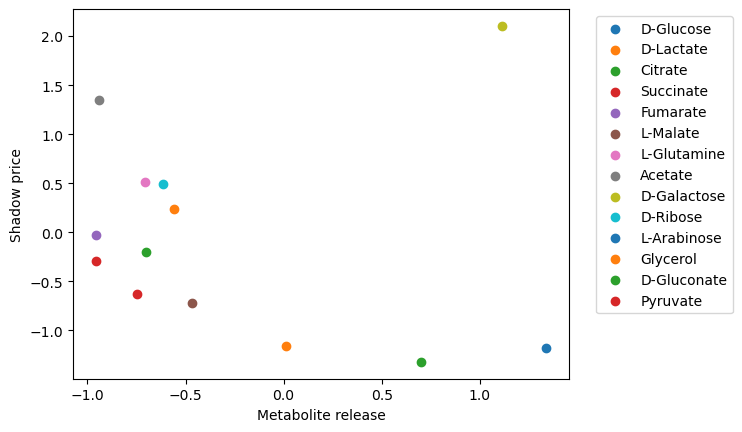

2,3-Diaminopropionic acid
-0.12441526933986873 0.685502816813651 -0.34112824568605227 0.2540107344193662
23dappa_c 0.6322 0.3438


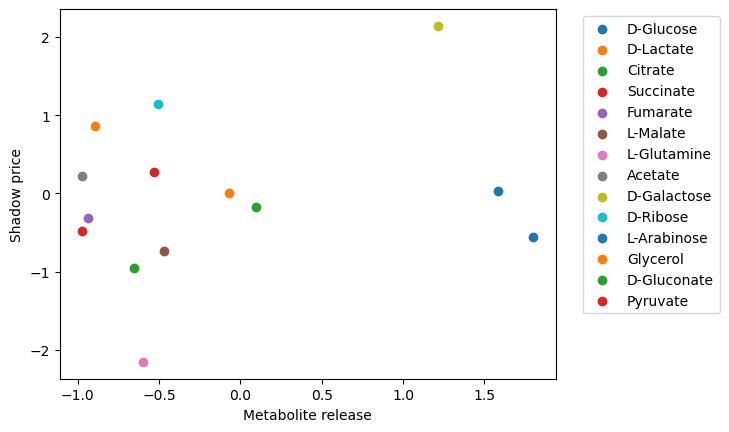

2-Ketobutyric acid/Succinic acid semialdehyde
0.2211684053636957 0.44733361629563345 0.09010989010989012 0.7593388378159541
2obut_c 0.198 0.0909


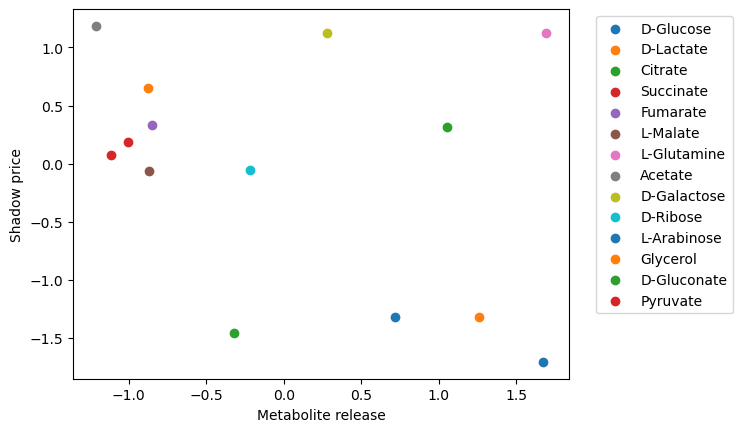

2/3-Phosphoglyceric acid
-0.3517101742449254 0.2175148863421093 -0.3054945054945055 0.2881698858754571
3pg_c 0.4241 0.2431


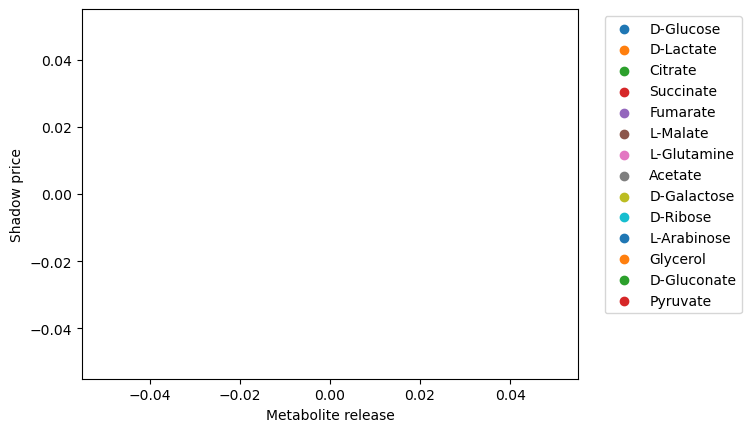

3-(2-Hydroxyphenyl)propanoic acid


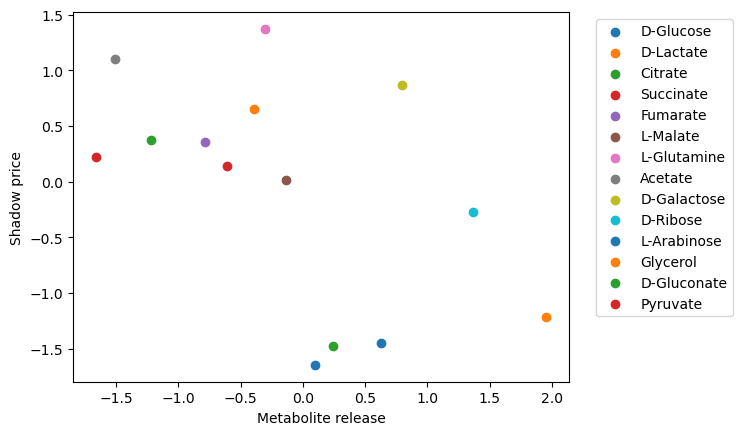

4-Hydroxyphenylpyruvic acid
-0.5192512030078223 0.05706457308572688 -0.49890109890109896 0.06936352739715487
34hpp_c 0.2903 0.1443


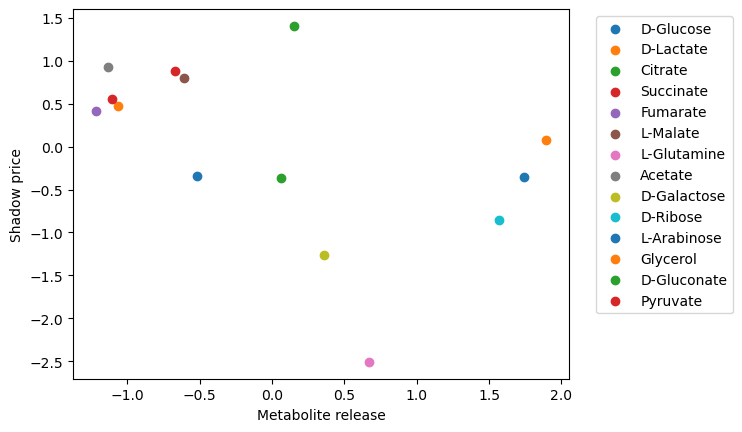

Adenosine monophosphate
-0.4925535264273299 0.07355827484500405 -0.5780219780219781 0.030383014145236958
amp_c 0.0595 0.0267


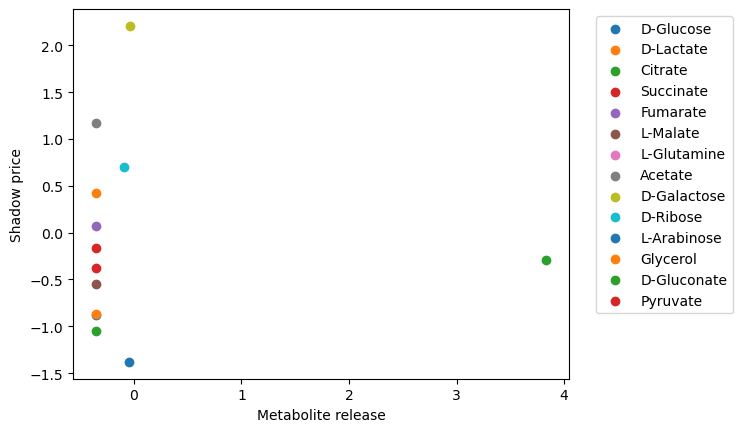

Alanine/Sarcosine
-0.026858607529740827 0.9305946108565869 0.1744848557072916 0.5685912573644221
ala__L_c 0.4722 0.2127


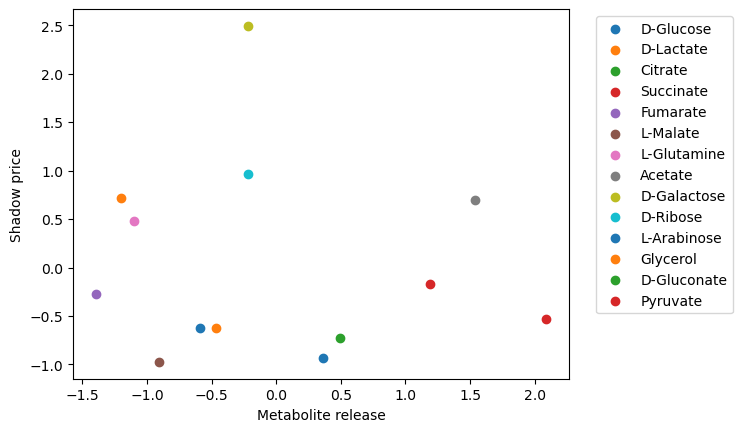

Citric/Isocitric acid
-0.08875647088806149 0.7730867341350731 -0.03846153846153846 0.9007243023389337
cit_c 0.4431 0.185


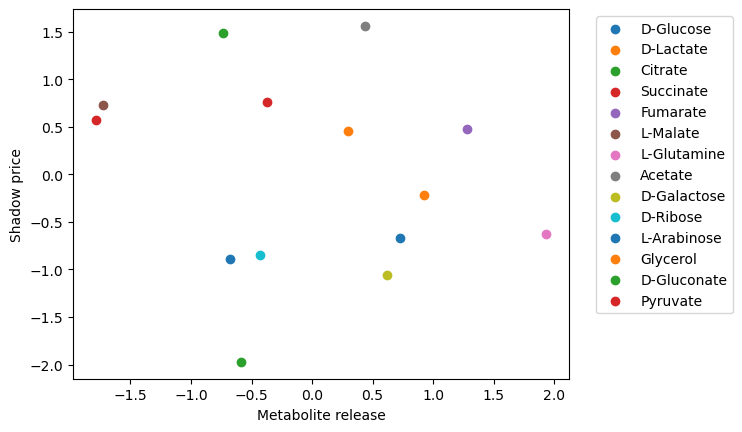

Deoxyguanosine
-0.18273577098637503 0.5317817765162729 -0.1824175824175824 0.5325088185186945
dgsn_c 0.0613 0.0268


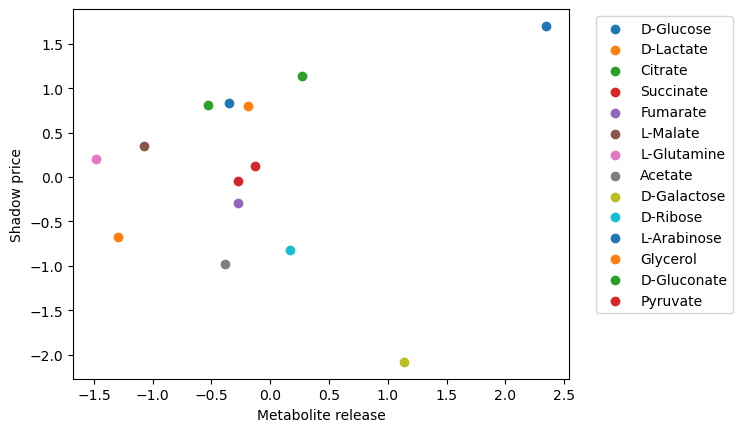

Dethiobiotin
0.1364805259972007 0.6417597153609818 0.0945054945054945 0.7479382611415478
dtbt_c 0.1263 0.0568


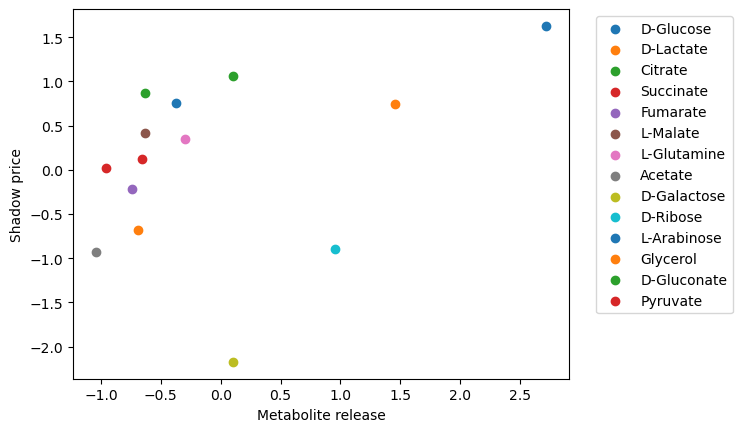

FAD
0.35478850774437953 0.2132354878018699 0.45054945054945056 0.10593278527264058
fad_c 0.1781 0.0835


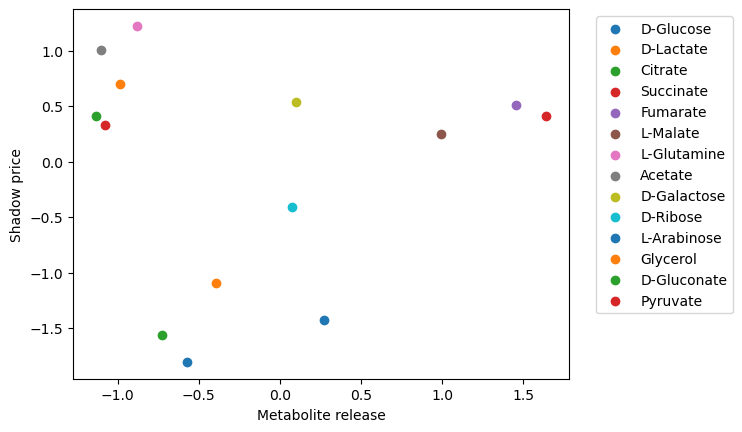

Fructose 6-phosphate
0.004375105400506926 0.9881568307897977 -0.2087912087912088 0.4737788373098136
f6p_c 0.4697 0.3148


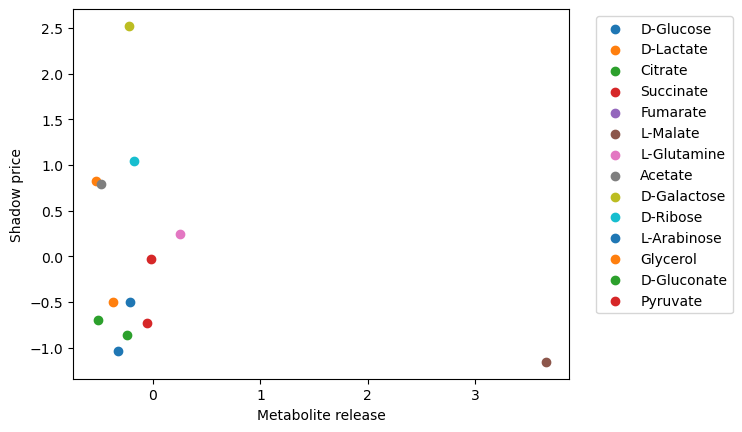

Fumaric acid
-0.32070134490616387 0.28536625037414215 -0.1868131868131868 0.5411235235098939
fum_c 0.4324 0.1765


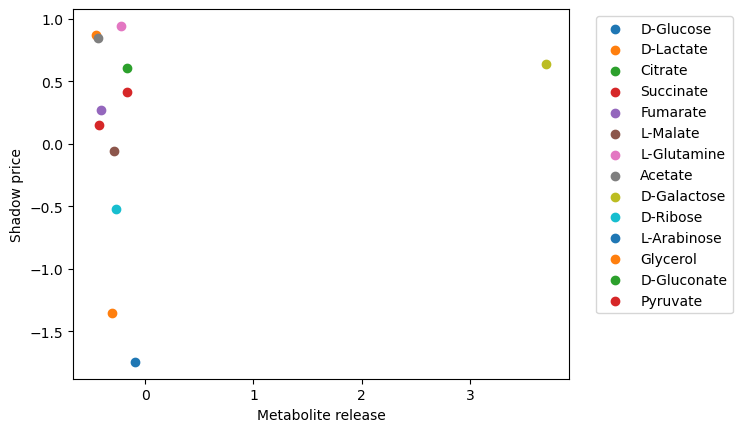

Gluconic acid
0.1556712102815822 0.629014398692699 -0.17482517482517487 0.5868236643627043
glcn_c 0.4913 0.4376


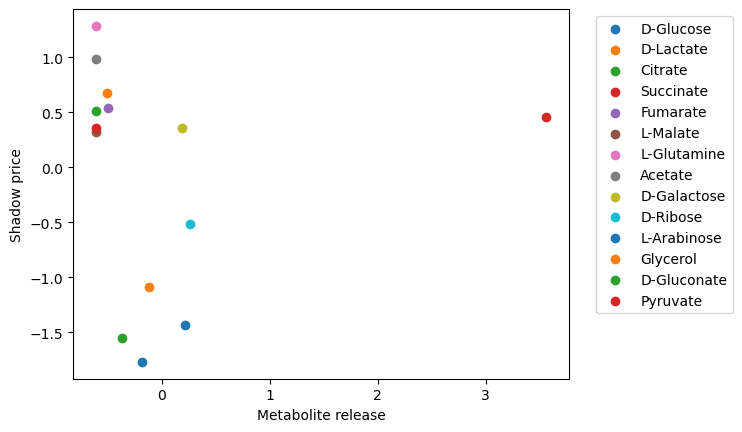

Glucosamine 6-phosphate
-0.03410239251199521 0.9078624437831757 -0.4877636220720025 0.07684048587548296
gam6p_c 0.3408 0.1829


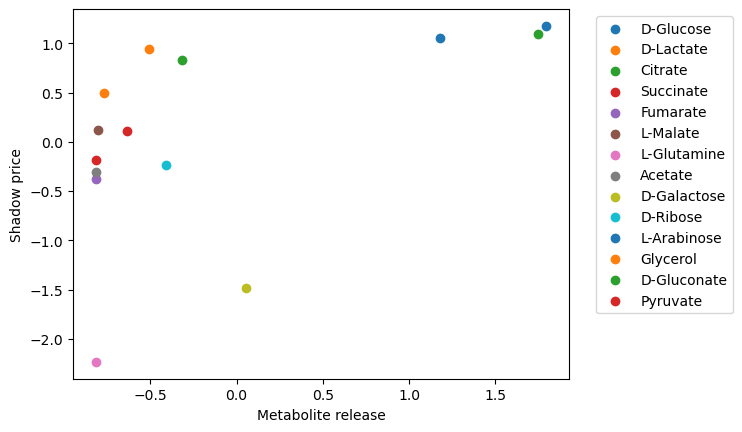

Guanine
0.5289712722523252 0.05178229765275612 0.6867090574230528 0.006673184188524621
gua_c 0.1051 0.0479


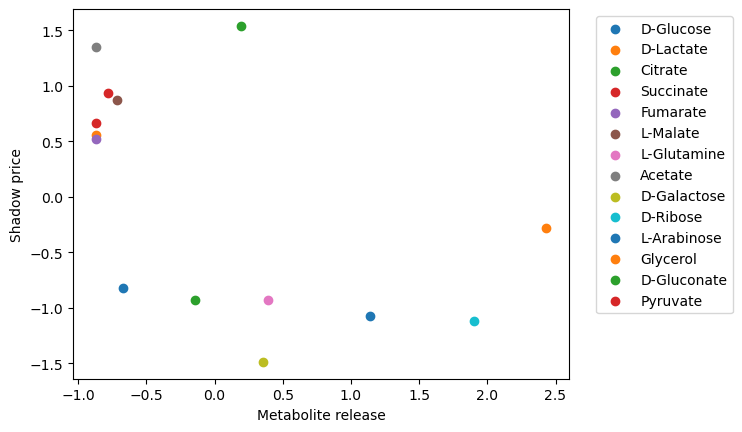

Guanosine monophosphate
-0.5380347983475035 0.0471849946721513 -0.6067041186941534 0.02142019683592601
gmp_c 0.0491 0.0214


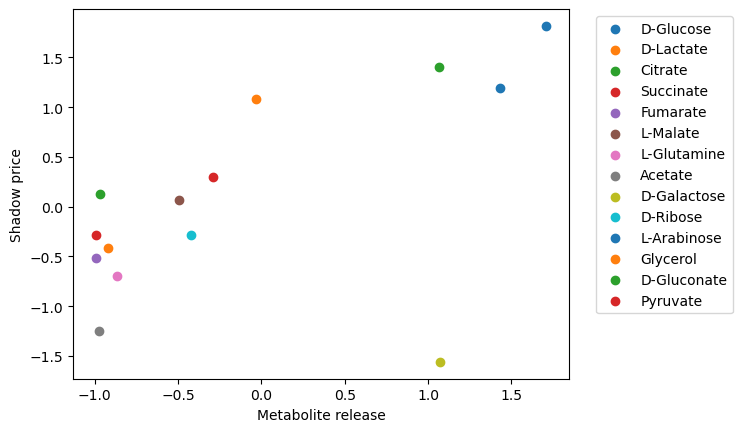

Homocystine
0.5848751059217281 0.02802557034020623 0.5786582159449335 0.030158146162140163
hcys__L_c 0.1318 0.0568


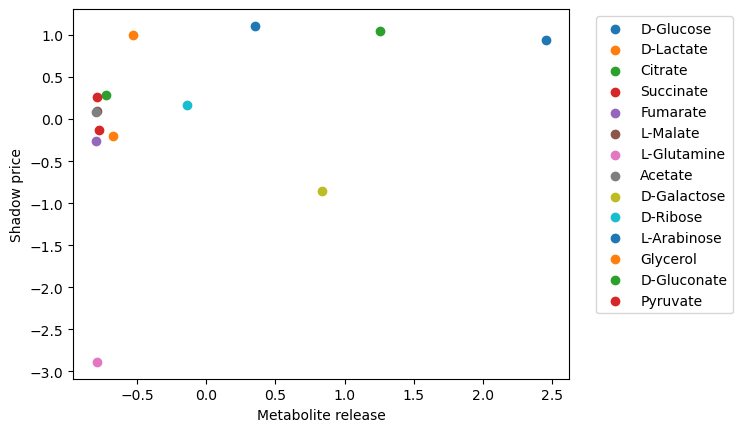

Hypoxanthine
0.3743534431009647 0.18727543059304763 0.4769230769230769 0.0846484341946868
hxan_c 0.0946 0.0449


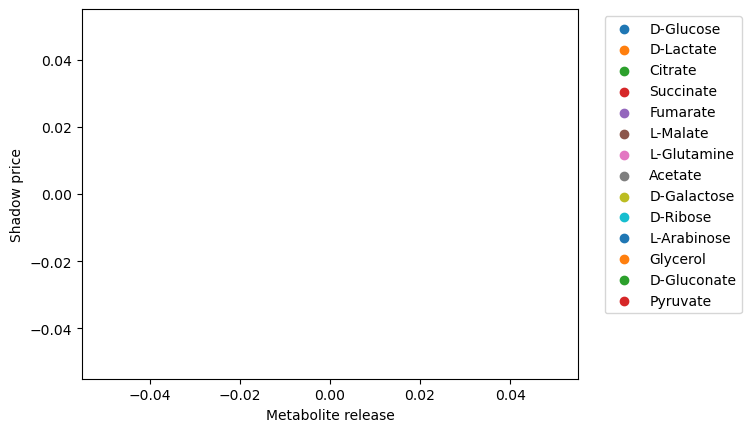

Indoleacetaldehyde


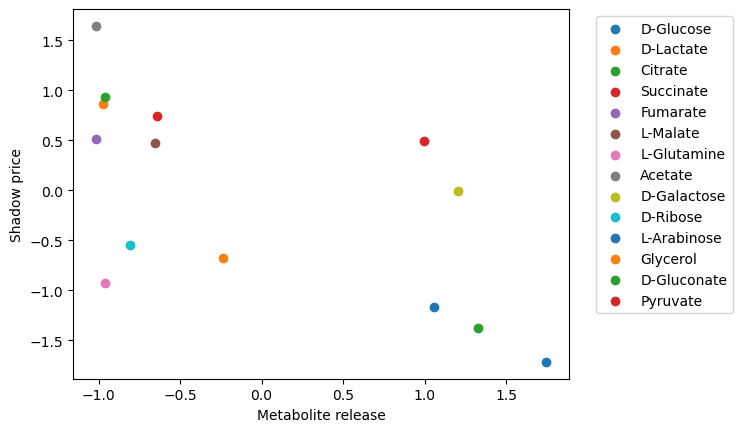

Inosine
-0.6307152894507057 0.015589785115592364 -0.745054945054945 0.002230037316742075
ins_c 0.0728 0.032


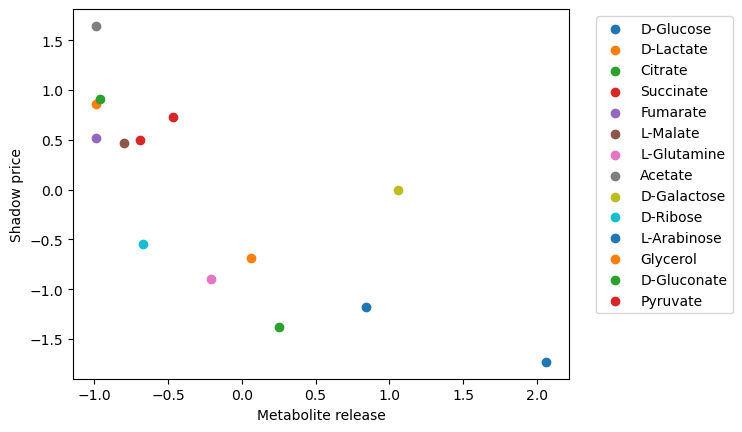

Inosinic acid
-0.7673568986144622 0.0013573468886392479 -0.8410677998713362 0.00016370711028037302
imp_c 0.0725 0.0319


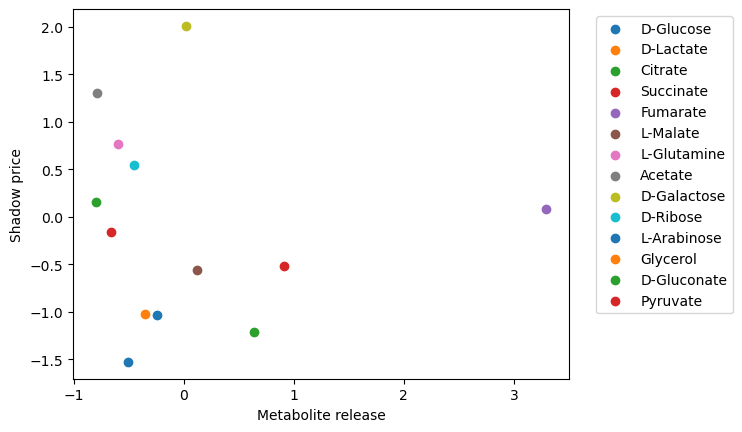

Lactic acid/Glyceraldehyde
-0.09341789591747222 0.7614719150061727 -0.3131868131868132 0.2974384220710292
lac__L_c 0.5835 0.3466


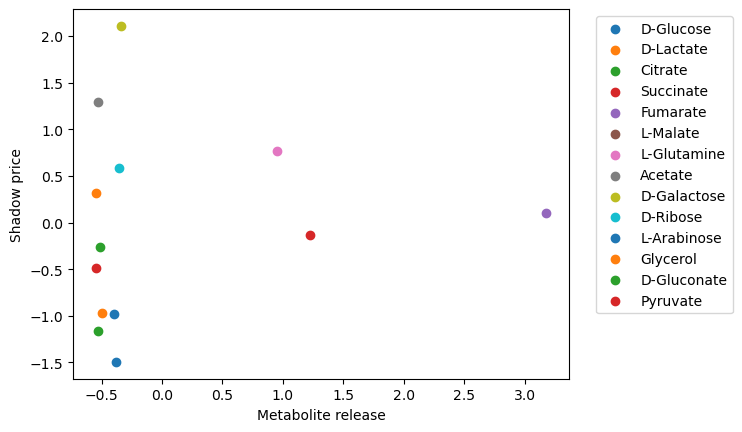

Malic acid
0.11581374893601487 0.7063449609906579 0.2200827391522918 0.46998875742238644
mal__D_c 0.6228 0.39


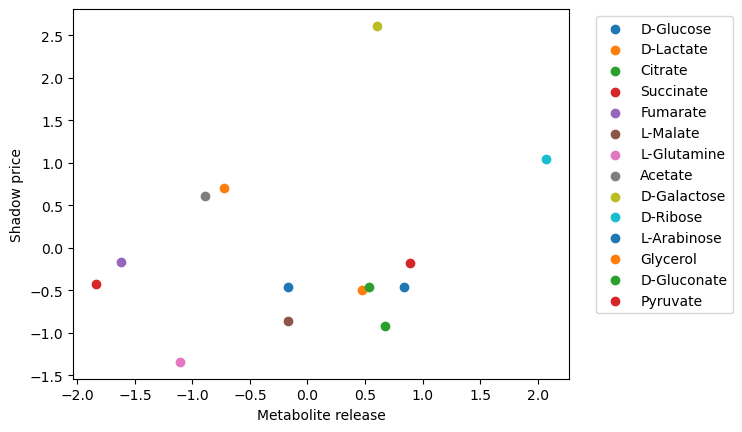

N-Methyl-L-glutamic acid
0.26190074660753465 0.36572333317029887 0.09010989010989012 0.7593388378159541
acglu_c 0.2316 0.0935


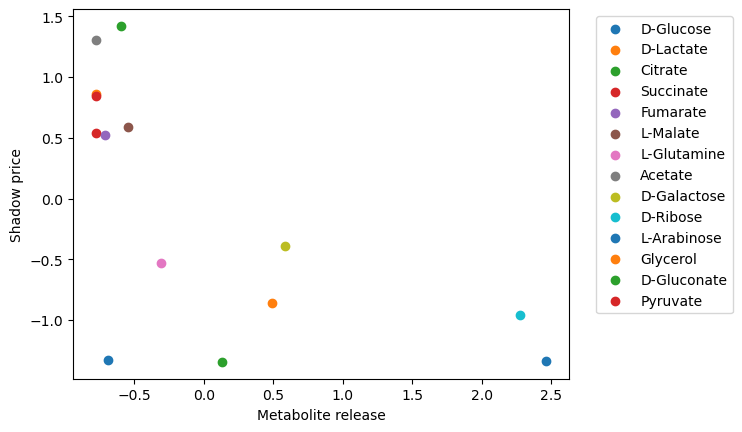

NAD
-0.6482901273874319 0.012155123366054536 -0.693376135650461 0.005961112964377703
nad_c 0.066 0.0289


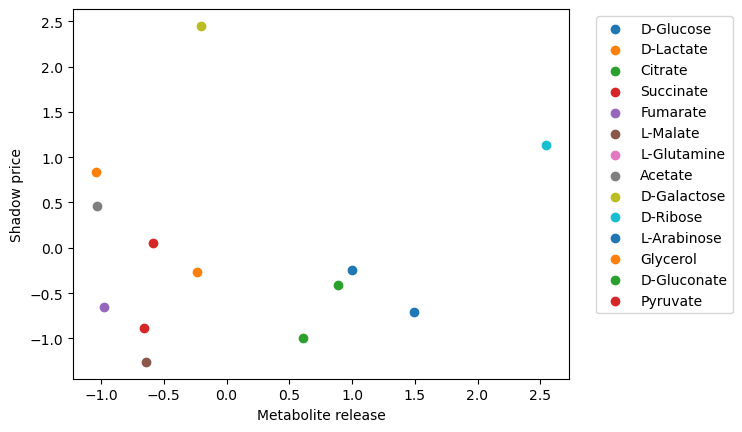

Orotic acid
0.06117665112405518 0.8426271144078209 0.016483516483516484 0.9573761750901849
orot_c 0.2628 0.1072


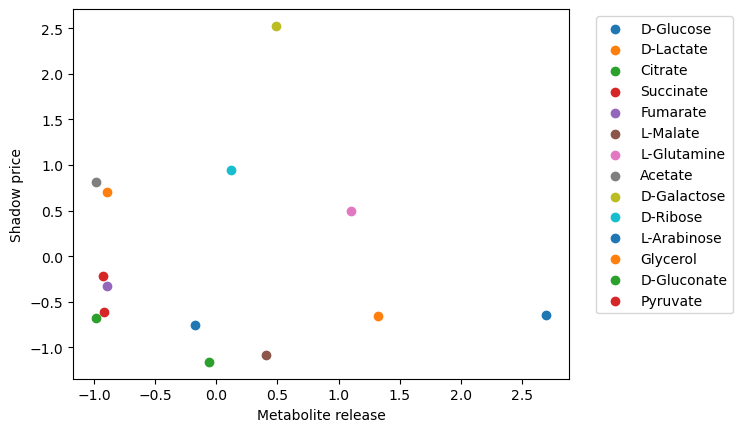

Oxoglutaric acid
-0.042591747268649505 0.8850506440748089 -0.059405976541875294 0.8401280416361696
akg_c 0.3919 0.1595


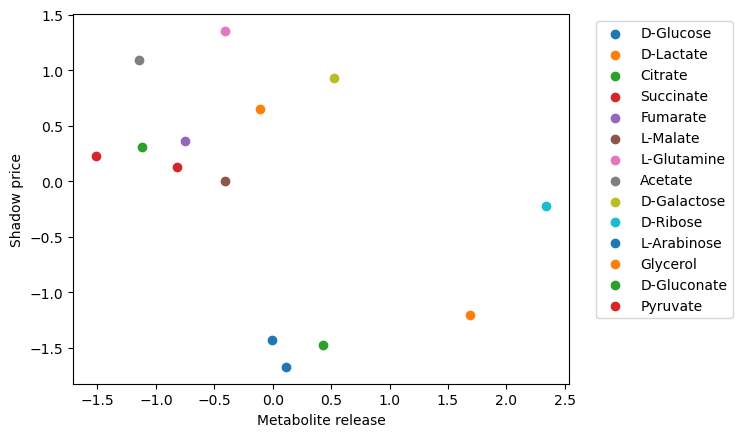

Phenylpyruvic acid
-0.41971837301478826 0.13516459916214912 -0.4461538461538462 0.10980712780122508
phpyr_c 0.301 0.151


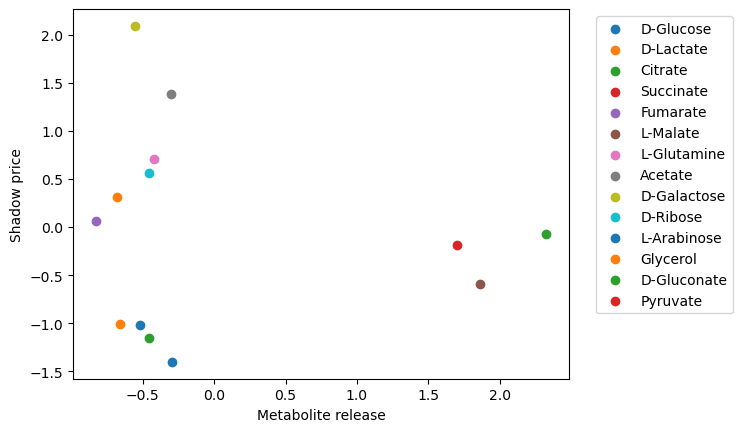

Pyruvic acid
-0.13326629328048883 0.6642680431321362 -0.19230769230769232 0.5290679872349875
pyr_c 0.6339 0.3618


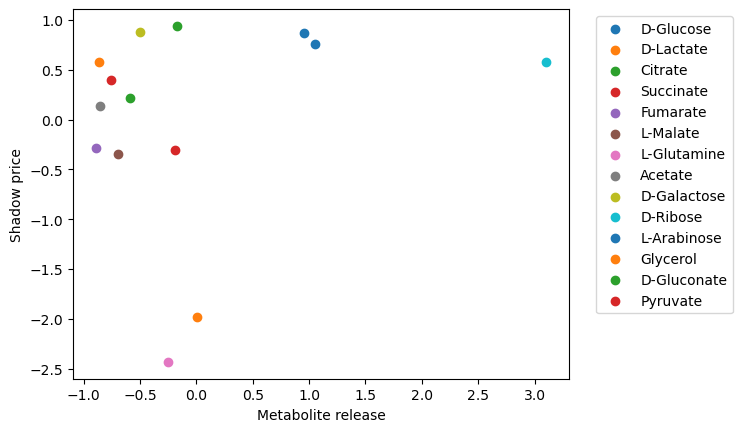

Uracil
0.1979096077016317 0.4976277547458855 0.2923076923076923 0.31052632038588196
ura_c 0.1833 0.095


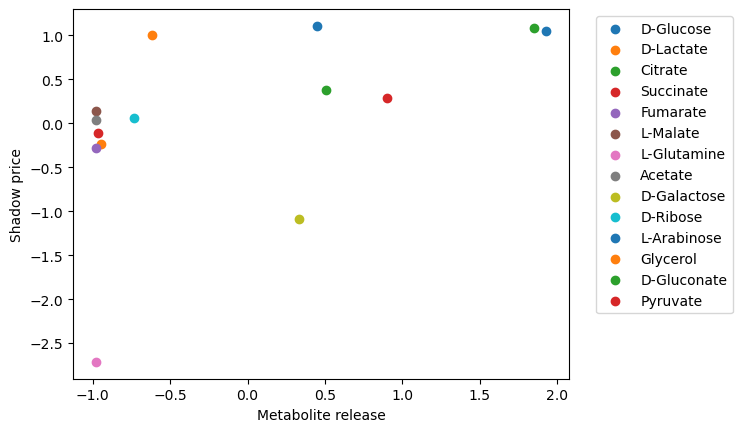

Xanthine
0.5015321226845814 0.0676758098303144 0.665934065934066 0.009322999096841759
xan_c 0.1063 0.0502


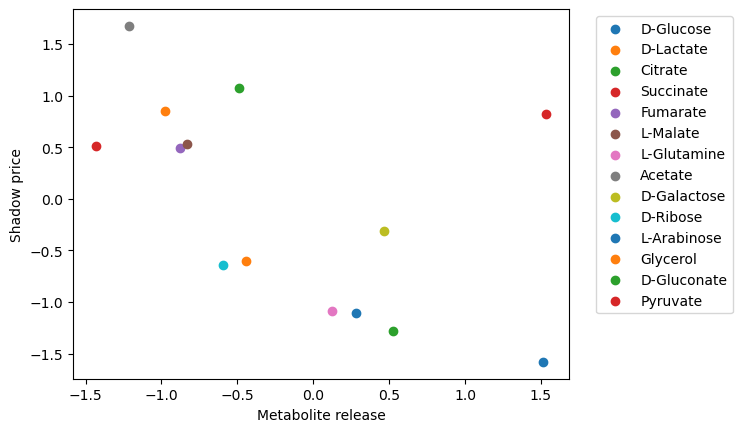

Xanthosine
-0.5494361078755238 0.04183350426488062 -0.5692307692307692 0.03361941707727023
xtsn_c 0.0719 0.0315


In [588]:
pcorrelations = []
scorrelations = []
ppvals = []
spvals = []
all_x = []
all_y = []

for m_id, m_name in zip(measured_mets, measured_metnames):
    x_arr = []
    y_arr = []
    for cs in carbon_sources:
        # if cs == 'D-Galactose':
        #     continue
        x = res_dict[cs][m_name]
        y = sp_dict[cs][m_id]
        if np.isfinite(x) and np.isfinite(y):
            x_arr.append(x)
            y_arr.append(y)
        all_x += x_arr
        all_y += y_arr
        plt.scatter(x,y, label = cs)
    plt.xlabel('Metabolite release')
    plt.ylabel('Shadow price')
    plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left")
    plt.show()
    print(m_name)
    if len(x_arr)>4:
        prho, ppval = st.pearsonr(x_arr, y_arr)
        srho, spval = st.spearmanr(x_arr, y_arr)
        print(prho, ppval,srho, spval)
        print(m_id, np.round(rel_std[m_id], 4), np.round(std_log[m_id], 4))
        scorrelations.append(srho)
        pcorrelations.append(prho)
        spvals.append(spval)
        ppvals.append(ppval)